# Fantasy Football Draft Analysis

Author: Melody Bass

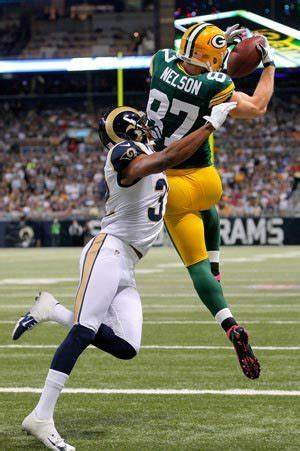

## Overview

## Business Problem

## Data Understanding

In [590]:
# Basics
import pandas as pd
import numpy as np
import itertools

# Visualization
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import matplotlib.patches as mpatches
from matplotlib.pylab import rcParams
import time

# Modeling
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import acf, pacf, adfuller
from fbprophet import Prophet as proph

# Warnings
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
warnings.filterwarnings('ignore')

In [592]:
# Load in player fantasy points time series from Weekly Player Data ETL

wr_ts = pd.read_csv('data/wr_ts.csv')
wr_ts = wr_ts.drop('Unnamed: 0', axis=1).fillna(0)

qb_ts = pd.read_csv('data/qb_ts.csv')
qb_ts = qb_ts.drop('Unnamed: 0', axis=1).fillna(0)

rb_ts = pd.read_csv('data/rb_ts.csv')
rb_ts = rb_ts.drop('Unnamed: 0', axis=1).fillna(0)

te_ts = pd.read_csv('data/te_ts.csv')
te_ts = te_ts.drop('Unnamed: 0', axis=1).fillna(0)
qb_ts.tail(20)

,Aaron Rodgers,Baker Mayfield,Dak Prescott,Derek Carr,Jameis Winston,Josh Allen,Kirk Cousins,Kyler Murray,Lamar Jackson,Matt Ryan,Matthew Stafford,Patrick Mahomes II,Russell Wilson,Ryan Tannehill,Tom Brady
65,18.3,21.0,0.0,2.1,0.0,37.7,20.3,34.1,30.2,27.8,15.3,25.9,13.0,37.0,23.4
66,26.1,8.0,0.0,23.2,0.0,32.3,23.6,16.4,21.3,19.9,0.7,20.2,19.9,18.3,29.9
67,26.0,16.2,0.0,22.9,-0.1,20.3,34.3,3.8,25.2,22.7,23.6,0.0,18.1,28.4,31.3
68,3.3,13.6,28.4,25.0,29.6,17.2,22.0,34.6,18.0,7.4,24.3,33.3,27.1,15.2,29.2
69,26.8,18.5,8.5,24.2,10.3,17.7,25.3,35.1,34.3,19.3,18.2,25.0,23.3,14.6,29.6
70,19.0,16.9,20.1,22.2,13.5,37.2,25.1,19.5,20.3,15.6,29.5,24.9,16.6,23.5,28.7
71,24.1,9.3,27.0,15.4,13.0,21.0,11.1,22.6,19.4,29.0,20.3,32.3,22.6,18.8,11.1
72,20.8,23.0,21.7,8.2,26.8,36.5,14.4,13.7,41.9,21.6,17.5,21.0,10.1,14.0,37.7
73,23.7,13.2,27.8,21.5,0.0,29.7,28.5,25.8,13.8,0.0,26.2,25.0,0.0,13.9,19.0
74,24.7,0.0,0.0,20.0,16.9,0.0,0.0,22.4,23.1,18.4,27.2,8.7,0.0,20.4,24.4


In [593]:
pd.set_option('max_columns', 100)
rb_ts.describe()

,Aaron Jones,Alvin Kamara,Austin Ekeler,Chase Edmonds,Christian McCaffrey,Cordarrelle Patterson,Dalvin Cook,Darrell Henderson Jr.,David Montgomery,Derrick Henry,Devin Singletary,Ezekiel Elliott,J.D. McKissic,Jamaal Williams,James Conner,Joe Mixon,Josh Jacobs,Kareem Hunt,Leonard Fournette,Mark Ingram II,Marlon Mack,Melvin Gordon III,Miles Sanders,Nick Chubb,Nyheim Hines,Ronald Jones II,Saquon Barkley,Tony Pollard
count,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000
mean,12.401176,18.288235,12.667059,5.437647,15.431765,2.734118,12.331765,3.718824,7.309412,13.518824,5.460000,15.616471,5.896471,7.568235,10.071765,11.903529,7.370588,11.296471,11.836471,9.625882,5.475294,13.404706,5.956471,10.162353,6.905882,5.323529,9.207059,4.383529
std,11.501910,12.394617,10.415743,7.355205,13.674256,6.896610,11.667060,6.558192,9.107671,12.393071,6.701443,9.670215,6.745765,7.653154,11.176747,9.901845,8.965540,10.676180,10.041163,9.098497,7.598808,9.781103,8.145046,10.367371,6.767330,6.797122,11.591097,6.568483
min,-0.200000,0.000000,0.000000,-0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.600000,0.000000,-2.000000
25%,2.200000,8.400000,2.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.100000,0.000000,8.300000,0.000000,1.000000,0.000000,5.200000,0.000000,0.000000,0.000000,2.000000,0.000000,6.300000,0.000000,0.000000,1.100000,0.000000,0.000000,0.000000
50%,10.900000,17.800000,11.900000,1.700000,14.000000,0.000000,13.400000,0.000000,1.900000,10.700000,2.300000,16.500000,4.400000,5.800000,6.800000,10.300000,0.000000,9.800000,11.600000,8.200000,1.400000,12.100000,0.000000,8.900000,5.700000,1.200000,0.900000,0.500000
75%,18.300000,25.300000,20.200000,8.800000,26.100000,0.000000,20.400000,4.900000,11.900000,19.400000,10.200000,20.500000,8.600000,11.200000,15.400000,17.400000,13.400000,16.600000,17.600000,14.500000,9.200000,20.800000,10.000000,17.100000,10.400000,9.700000,17.900000,6.800000
max,49.200000,56.200000,41.500000,35.000000,47.700000,34.600000,48.600000,24.700000,29.200000,47.800000,23.000000,40.900000,25.700000,30.800000,40.300000,42.100000,35.900000,45.600000,44.100000,35.500000,31.900000,36.000000,35.200000,39.300000,28.500000,26.100000,43.900000,31.200000


In [594]:
# load in player snap data from Weekly Player Data ETL as position_snap_ts 
qb_snap_ts = pd.read_csv('data/qb_snap_ts.csv')
qb_snap_ts = qb_snap_ts.drop('Unnamed: 0', axis=1).fillna(0)

rb_snap_ts = pd.read_csv('data/rb_snap_ts.csv')
rb_snap_ts = rb_snap_ts.drop('Unnamed: 0', axis=1).fillna(0)

wr_snap_ts = pd.read_csv('data/wr_snap_ts.csv')
wr_snap_ts = wr_snap_ts.drop('Unnamed: 0', axis=1).fillna(0)

te_snap_ts = pd.read_csv('data/te_snap_ts.csv')
te_snap_ts = te_snap_ts.drop('Unnamed: 0', axis=1).fillna(0)

wr_snap_ts.head()

,snaps_A.J. Brown,snaps_Adam Thielen,snaps_Allen Robinson II,snaps_Amari Cooper,snaps_Brandin Cooks,snaps_Chris Godwin,snaps_Christian Kirk,snaps_Cooper Kupp,snaps_Courtland Sutton,snaps_DJ Chark Jr.,snaps_DJ Moore,snaps_DK Metcalf,snaps_Davante Adams,snaps_DeAndre Hopkins,snaps_DeVante Parker,snaps_Diontae Johnson,snaps_Hunter Renfrow,snaps_Jakobi Meyers,snaps_Jarvis Landry,snaps_JuJu Smith-Schuster,snaps_Julio Jones,snaps_Keenan Allen,snaps_Kenny Golladay,snaps_Marquez Valdes-Scantling,snaps_Marquise Brown,snaps_Marvin Jones Jr.,snaps_Mecole Hardman,snaps_Michael Gallup,snaps_Mike Evans,snaps_Mike Williams,snaps_Robbie Anderson,snaps_Robert Woods,snaps_Russell Gage,snaps_Sammy Watkins,snaps_Stefon Diggs,snaps_Terry McLaurin,snaps_Tyler Boyd,snaps_Tyler Lockett,snaps_Tyreek Hill
0,0.0,65.0,3.0,61.0,67.0,0.0,0.0,39.0,0.0,0.0,0.0,0.0,67.0,79.0,0.0,0.0,0.0,0.0,0.0,25.0,48.0,52.0,44.0,0.0,0.0,68.0,0.0,0.0,0.0,0.0,57.0,43.0,0.0,38.0,58.0,0.0,42.0,26.0,50.0
1,0.0,62.0,0.0,48.0,65.0,29.0,0.0,30.0,0.0,0.0,0.0,0.0,71.0,67.0,63.0,0.0,0.0,0.0,62.0,39.0,48.0,50.0,33.0,0.0,0.0,56.0,0.0,0.0,55.0,0.0,43.0,45.0,0.0,45.0,60.0,0.0,0.0,61.0,47.0
2,0.0,63.0,0.0,44.0,57.0,11.0,0.0,38.0,0.0,0.0,0.0,0.0,67.0,71.0,58.0,0.0,0.0,0.0,60.0,51.0,58.0,61.0,45.0,0.0,0.0,68.0,0.0,0.0,47.0,0.0,49.0,60.0,0.0,42.0,52.0,0.0,30.0,66.0,39.0
3,0.0,55.0,0.0,53.0,64.0,9.0,0.0,49.0,0.0,0.0,0.0,0.0,40.0,78.0,47.0,0.0,0.0,0.0,46.0,54.0,16.0,49.0,0.0,0.0,0.0,64.0,0.0,0.0,59.0,0.0,55.0,59.0,0.0,60.0,48.0,0.0,39.0,50.0,58.0
4,0.0,68.0,0.0,55.0,72.0,17.0,0.0,63.0,0.0,0.0,0.0,0.0,56.0,64.0,3.0,0.0,0.0,0.0,49.0,66.0,0.0,71.0,0.0,0.0,0.0,58.0,0.0,0.0,68.0,0.0,39.0,64.0,0.0,59.0,49.0,0.0,5.0,38.0,46.0


In [595]:
# load in historical fantasy data from Yearly Player Data ETL
adp_2015_df = pd.read_csv('data/adp_2015.csv')
adp_2015_df = adp_2015_df.drop('Unnamed: 0', axis=1).fillna(0)

adp_2016_df = pd.read_csv('data/adp_2016.csv')
adp_2016_df = adp_2016_df.drop('Unnamed: 0', axis=1).fillna(0)

adp_2017_df = pd.read_csv('data/adp_2017.csv')
adp_2017_df = adp_2017_df.drop('Unnamed: 0', axis=1).fillna(0)

adp_2018_df = pd.read_csv('data/adp_2018.csv')
adp_2018_df = adp_2018_df.drop('Unnamed: 0', axis=1).fillna(0)

adp_2019_df = pd.read_csv('data/adp_2019.csv')
adp_2019_df = adp_2019_df.drop('Unnamed: 0', axis=1).fillna(0)

adp_2020_df = pd.read_csv('data/adp_2020.csv')
adp_2020_df = adp_2020_df.drop('Unnamed: 0', axis=1).fillna(0)

adp_2021_df = pd.read_csv('data/adp_2021.csv')
adp_2021_df = adp_2021_df.drop('Unnamed: 0', axis=1).fillna(0)

# load in historical kicker and defense fantasy data from Yearly Player Data ETL

adp_2015_k = pd.read_csv('data/adp_2015_k.csv')
adp_2015_k = adp_2015_k.drop('Unnamed: 0', axis=1).fillna(0)

adp_2016_k = pd.read_csv('data/adp_2016_k.csv')
adp_2016_k = adp_2016_k.drop('Unnamed: 0', axis=1).fillna(0)

adp_2017_k = pd.read_csv('data/adp_2017_k.csv')
adp_2017_k = adp_2017_k.drop('Unnamed: 0', axis=1).fillna(0)

adp_2018_k = pd.read_csv('data/adp_2018_k.csv')
adp_2018_k = adp_2018_k.drop('Unnamed: 0', axis=1).fillna(0)

adp_2019_k = pd.read_csv('data/adp_2019_k.csv')
adp_2019_k = adp_2019_k.drop('Unnamed: 0', axis=1).fillna(0)

adp_2020_k = pd.read_csv('data/adp_2020_k.csv')
adp_2020_k = adp_2020_k.drop('Unnamed: 0', axis=1).fillna(0)

adp_2021_k = pd.read_csv('data/adp_2021_k.csv')
adp_2021_k = adp_2021_k.drop('Unnamed: 0', axis=1).fillna(0)

## EDA

### Historical ADP vs Actual Points EDA

In [830]:
def adp_plot_hist(df, position, year = ''):
    '''
    Plot historical adp vs actual points in specified year by position
    
    Input:
        df : DataFrame.
        position : 'Quarterback', 'Running Back', 'Wide Receiver', 'Tight End', 'Kicker', 'Defense', 'All' 
        year : '2015' - '2021' 
        
    Output:
        Plots ADP vs. PPR Fantasy Points.
    '''
    
    # Select position for plot
    if position == 'Quarterback':
        df = df.loc[df['POS'] == 'QB']
        
    elif position == 'Running Back':
        df = df.loc[df['POS'] == 'RB']
        
    elif position == 'Wide Receiver':
        df = df.loc[df['POS'] == 'WR']
        
    elif position == 'Tight End':
        df = df.loc[df['POS'] == 'TE']
        
    elif position == 'Kicker':
        df = df.loc[df['POS'] == 'K']
        
    elif position == 'Defense':
        df = df.loc[df['POS'] == 'DST']
        
    elif position == 'All':
        df = df
        
    # Reset index and plot 
    df = df.reset_index()
    plt.figure(figsize=(20,15))
    p1 = sns.regplot('ADP', 'FPTS', data=df, ci=None)

    # Add player name text to each point
    for line in range(0,df.shape[0]):
         p1.text(df['ADP'][line]+0.2, df['FPTS'][line], 
         df['Player'][line], ha='left', bbox={'facecolor':'white','alpha':1,'edgecolor':'none','pad':1},
         size='small', color='black', weight='normal')

    # Set Title
    plt.title(f'ADP vs {year} {position} Fantasy Points', fontsize=25)
    # Set x-axis label
    plt.xlabel(f'ADP', fontsize=20)
    # Set y-axis label
    plt.ylabel(f'Actual Points', fontsize=20);
    
    # Return plot
    return adp_plot

#### All Positions in the Top 100 ADP

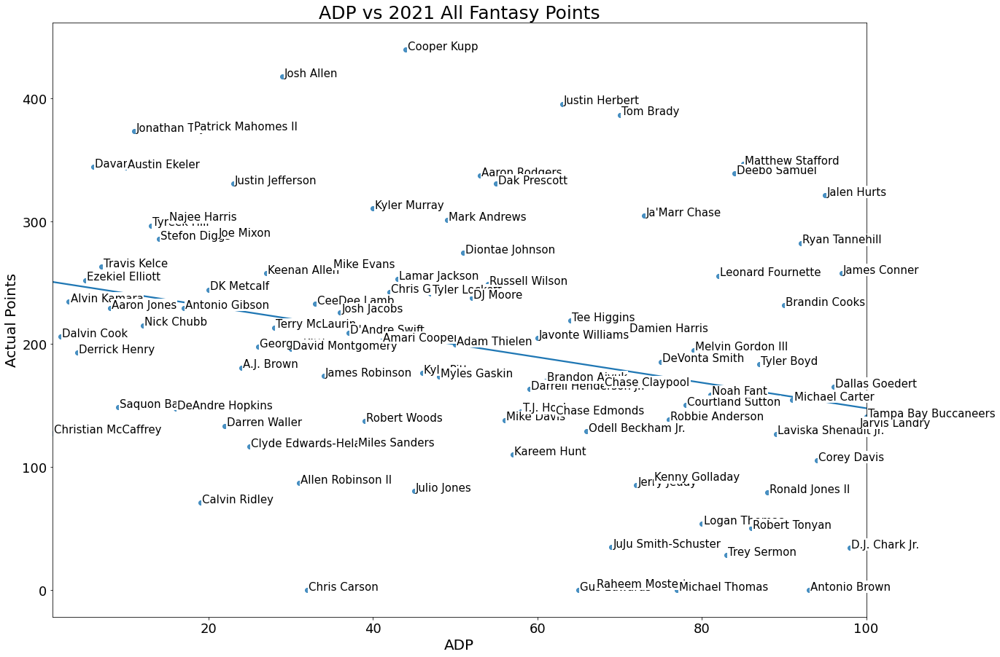

In [831]:
adp_plot_hist(adp_2021_df, 'All', '2021');

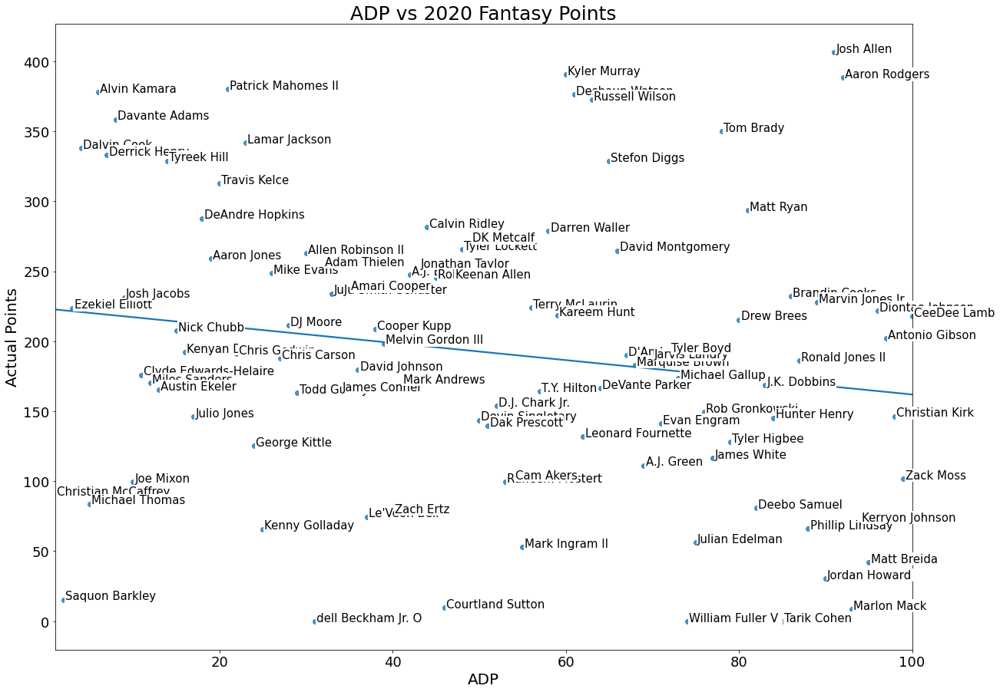

In [782]:
adp_plot_hist(adp_2020_df, 'All', '2020');

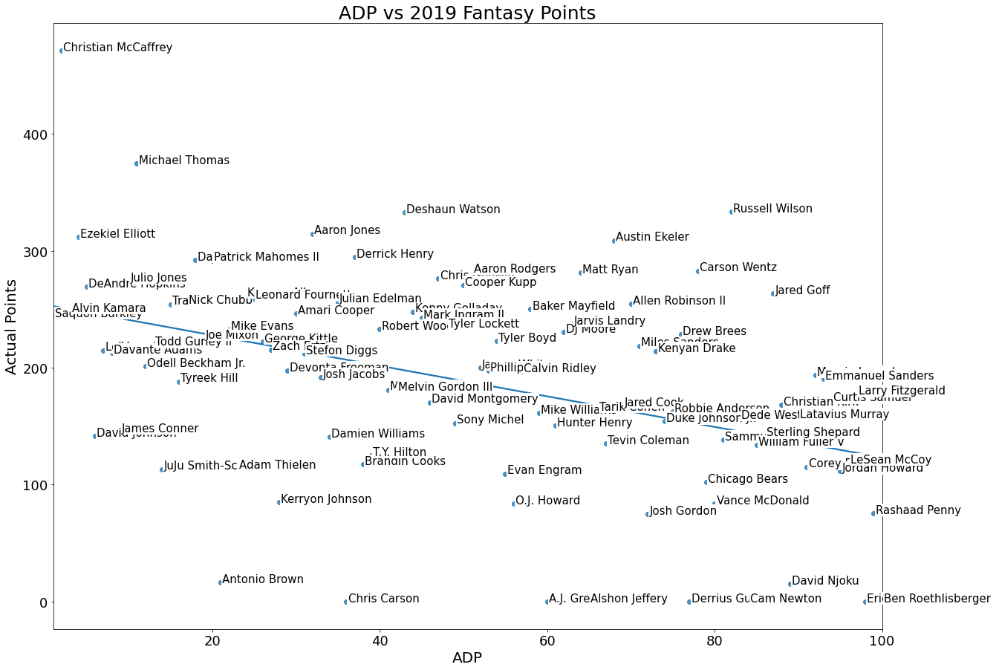

In [783]:
adp_plot_hist(adp_2019_df, 'All', '2019');

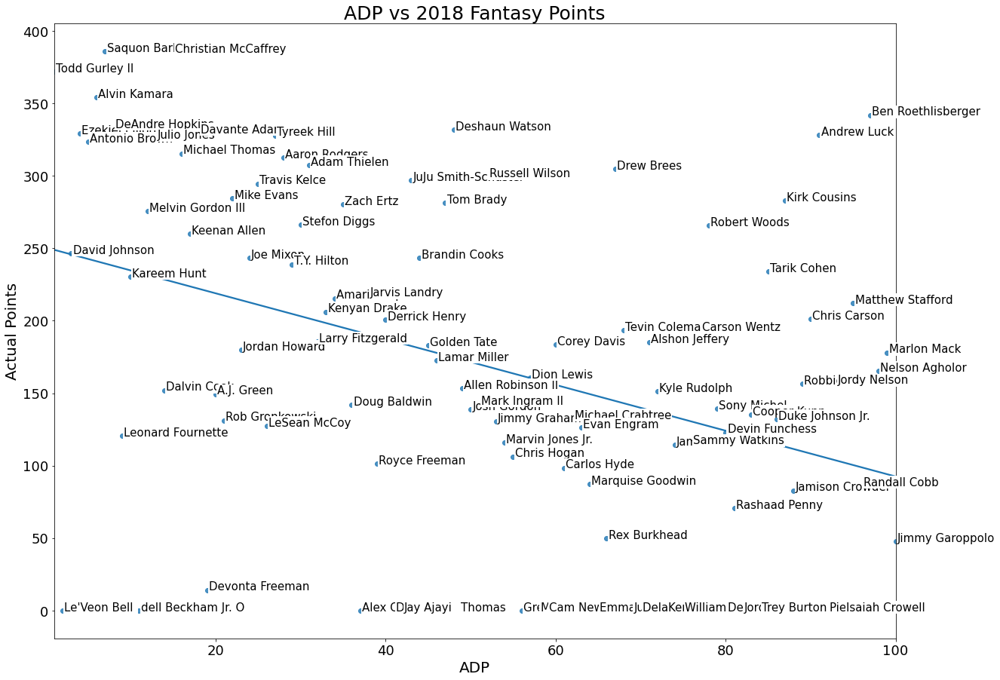

In [784]:
adp_plot_hist(adp_2018_df, 'All', '2018');

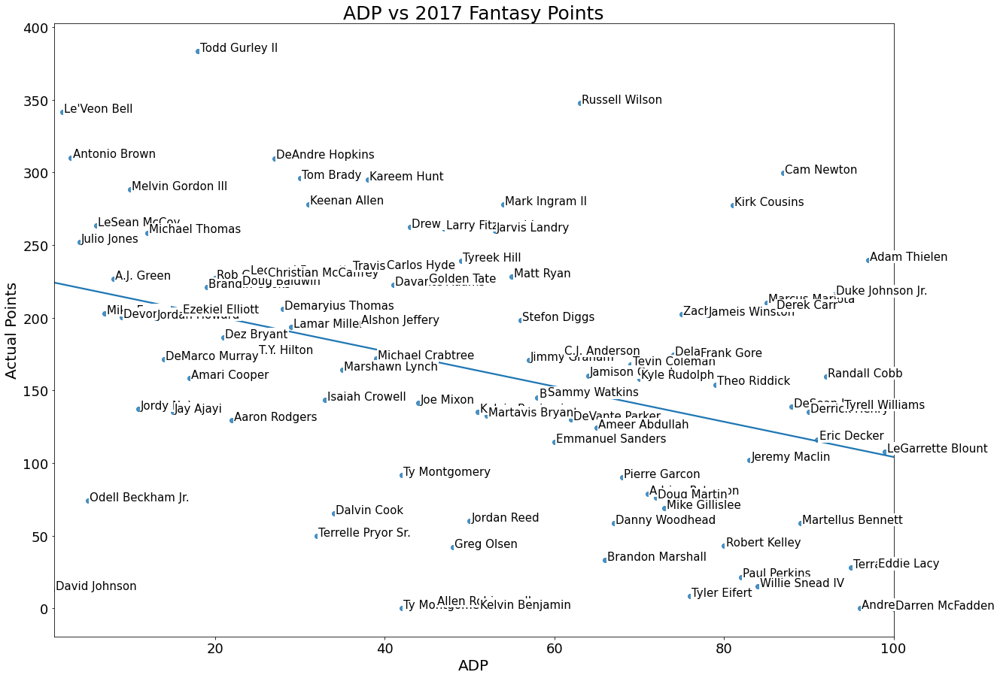

In [785]:
adp_plot_hist(adp_2017_df, 'All', '2017');

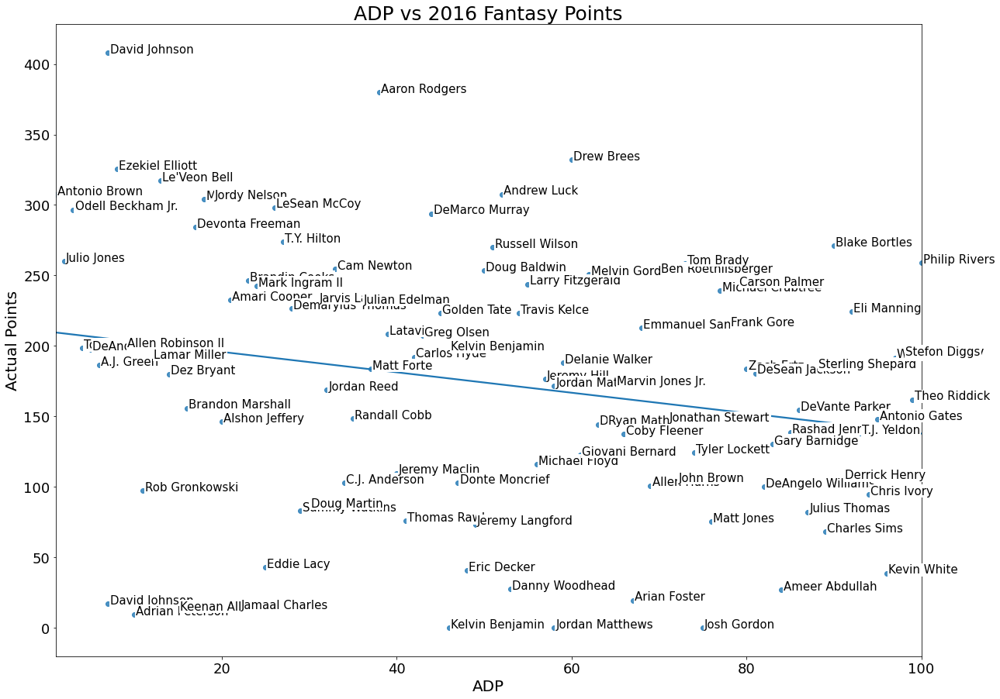

In [786]:
adp_plot_hist(adp_2016_df, 'All', '2016');

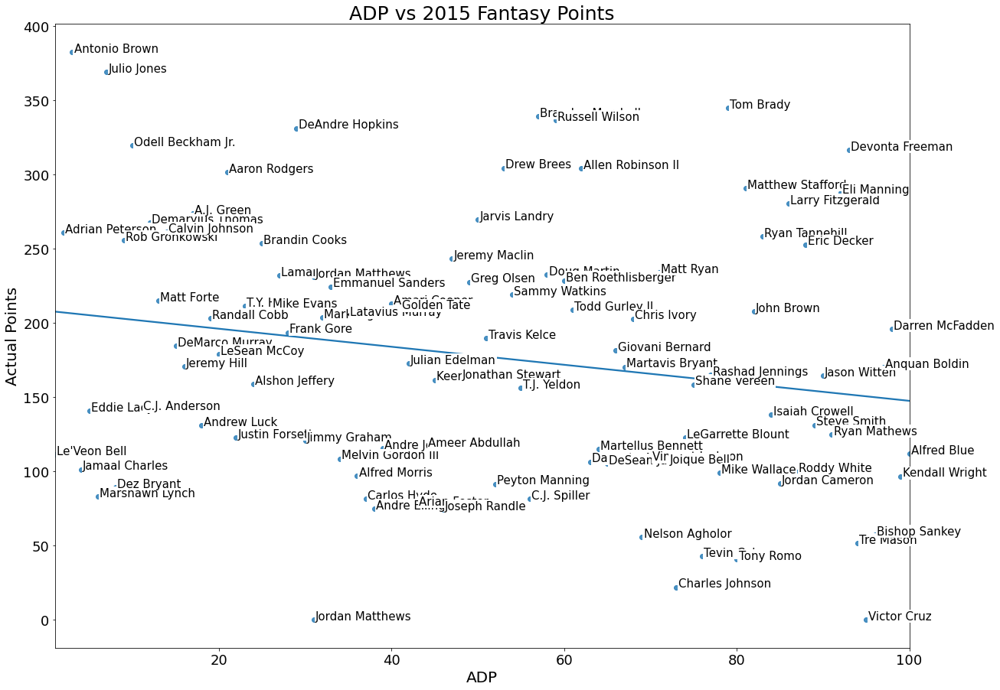

In [787]:
adp_plot_hist(adp_2015_df, 'All', '2015');

#### Quarterbacks

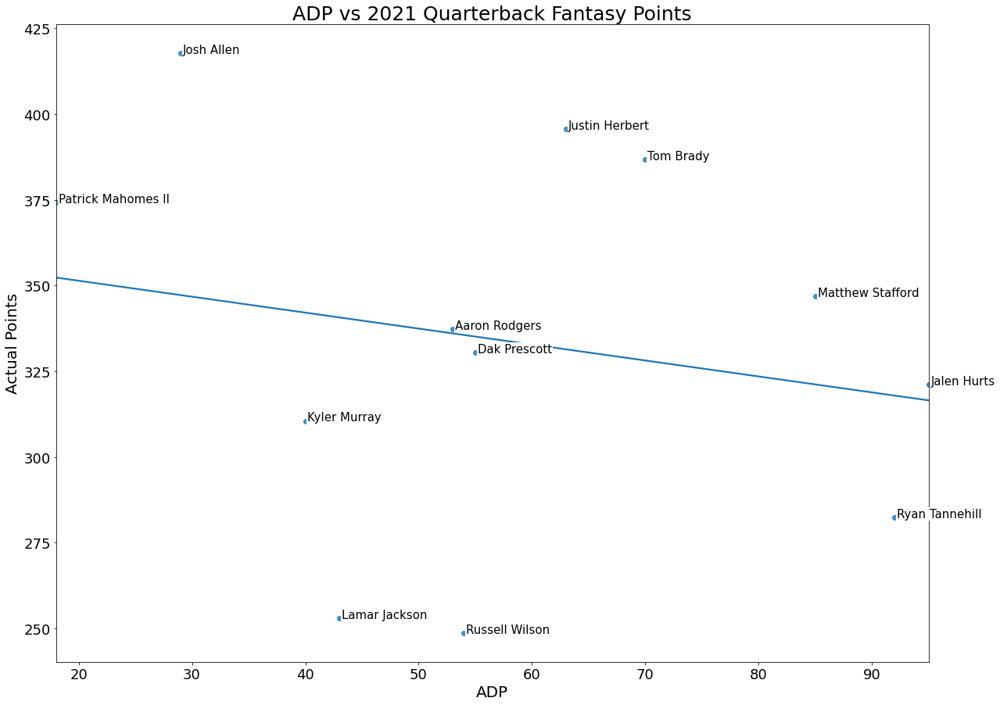

In [832]:
adp_plot_hist(adp_2021_df, 'Quarterback', '2021');

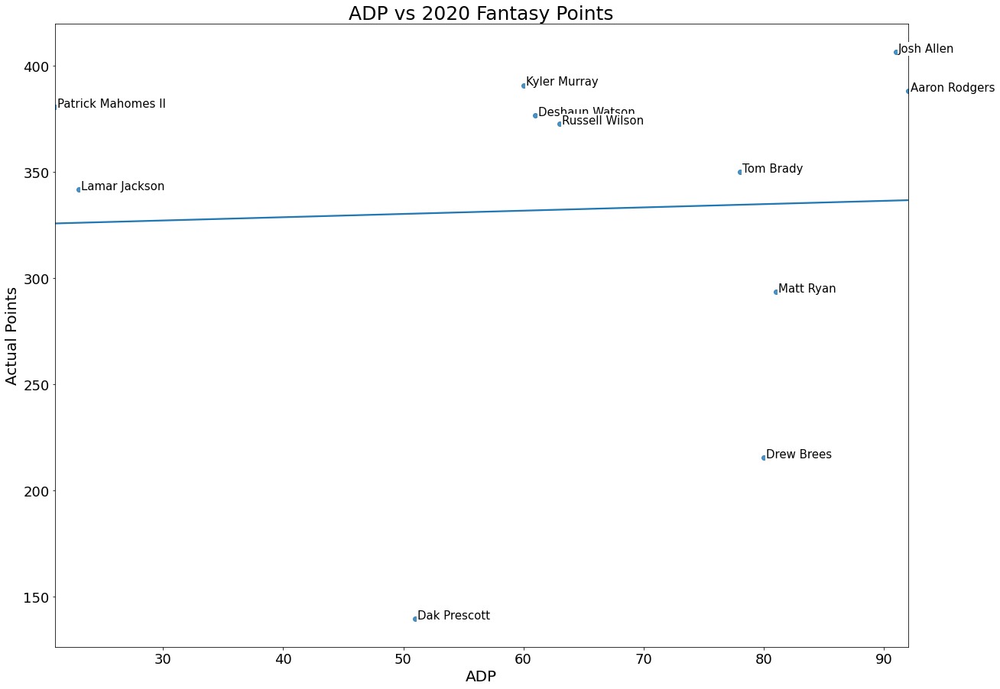

In [789]:
adp_plot_hist(adp_2020_df, 'Quarterback', '2020');

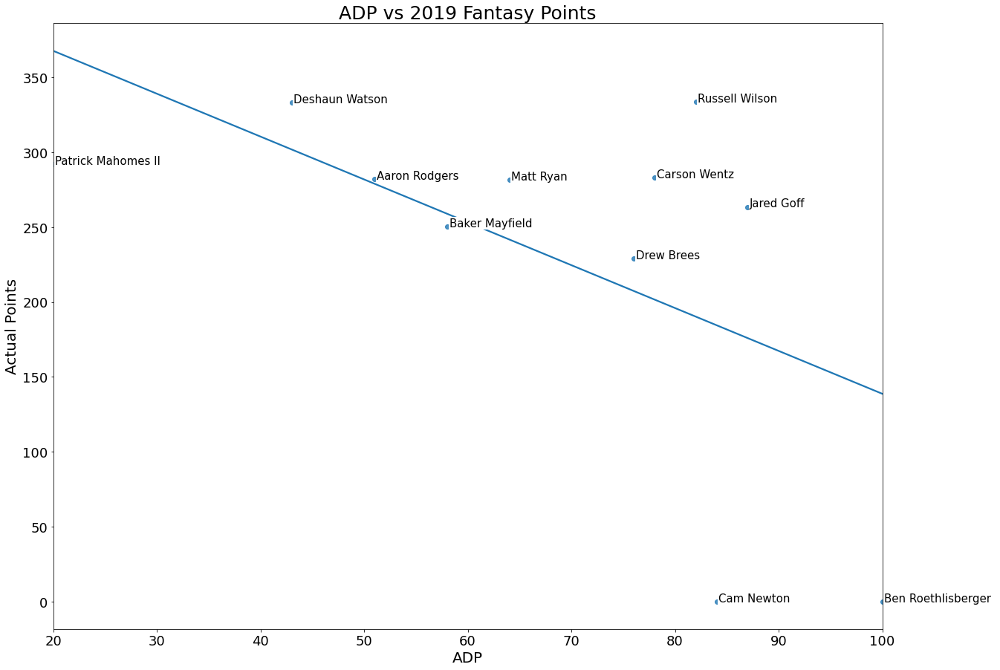

In [790]:
adp_plot_hist(adp_2019_df, 'Quarterback', '2019');

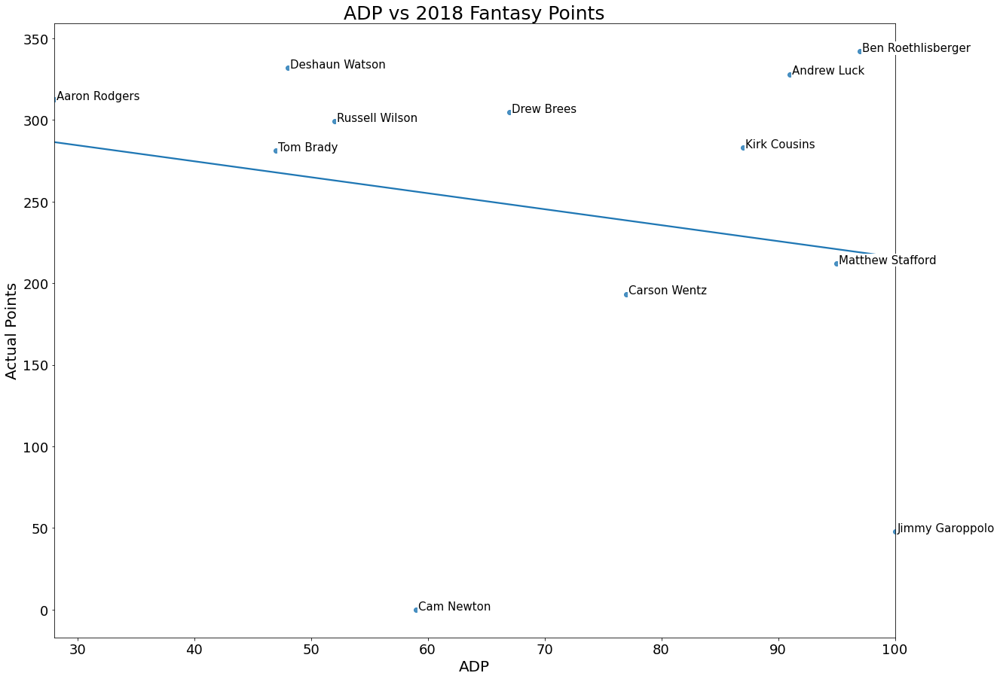

In [791]:
adp_plot_hist(adp_2018_df, 'Quarterback', '2018');

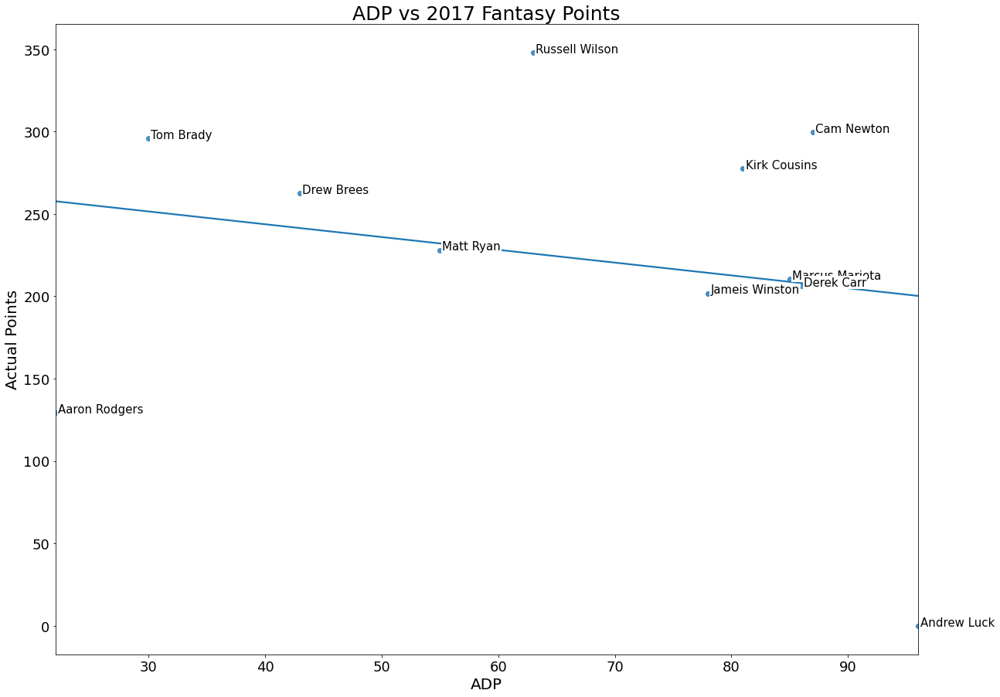

In [792]:
adp_plot_hist(adp_2017_df, 'Quarterback', '2017');

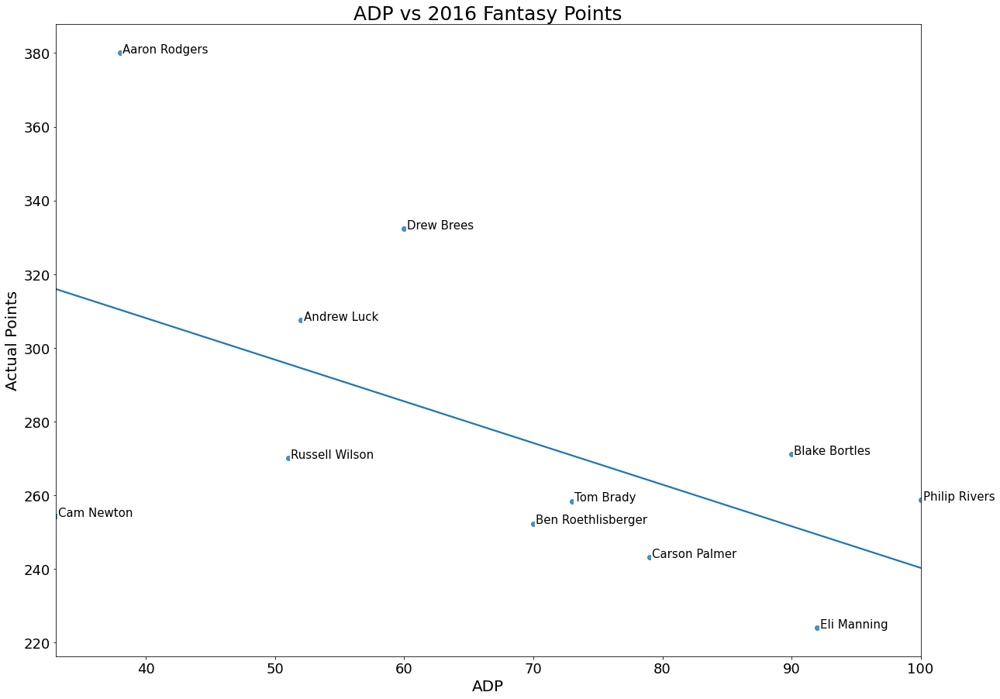

In [793]:
adp_plot_hist(adp_2016_df, 'Quarterback', '2016');

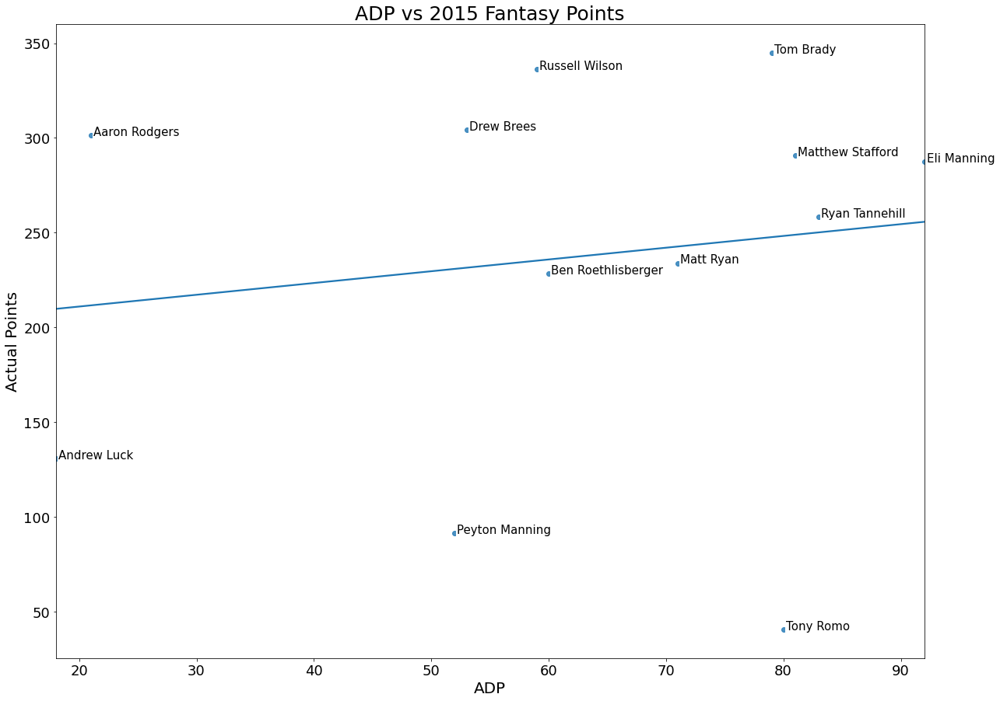

In [794]:
adp_plot_hist(adp_2015_df, 'Quarterback', '2015');

#### Running Backs

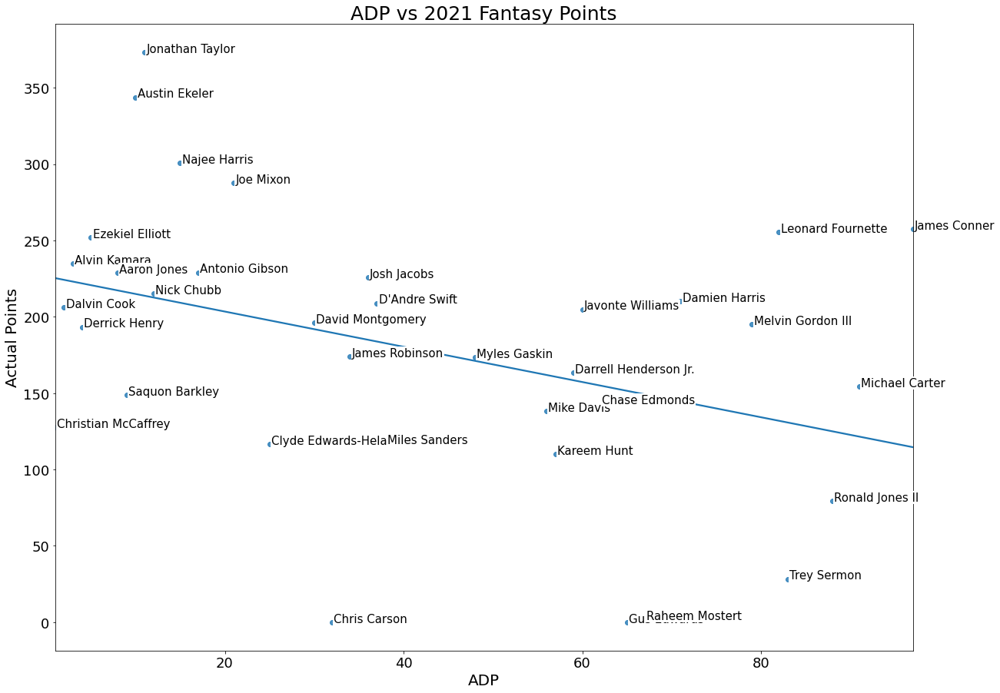

In [795]:
adp_plot_hist(adp_2021_df, 'Running Back', '2021');

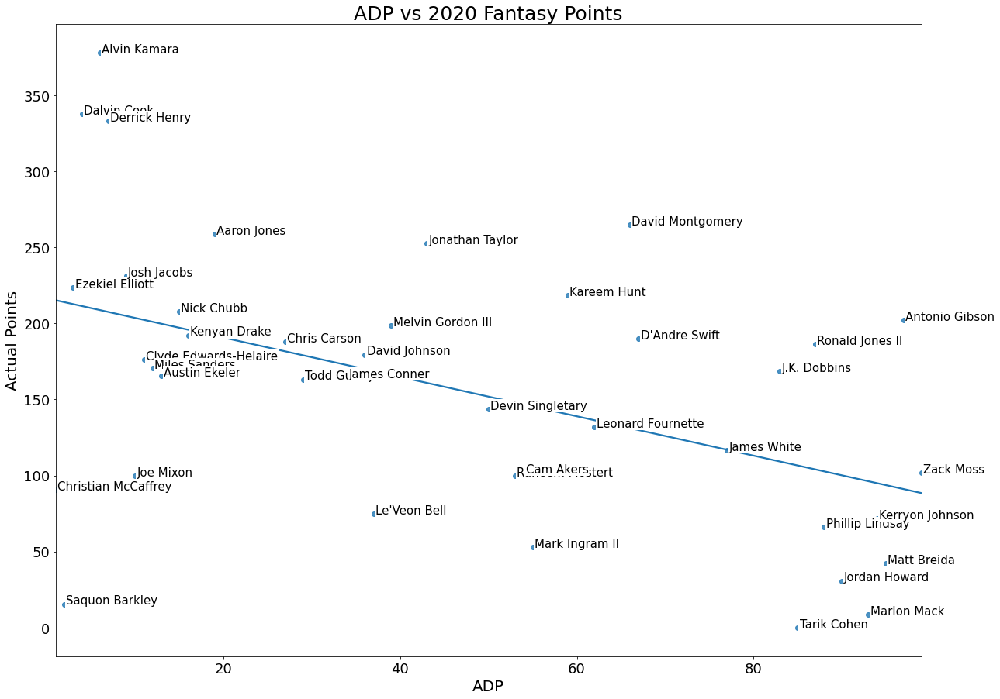

In [796]:
adp_plot_hist(adp_2020_df, 'Running Back', '2020');

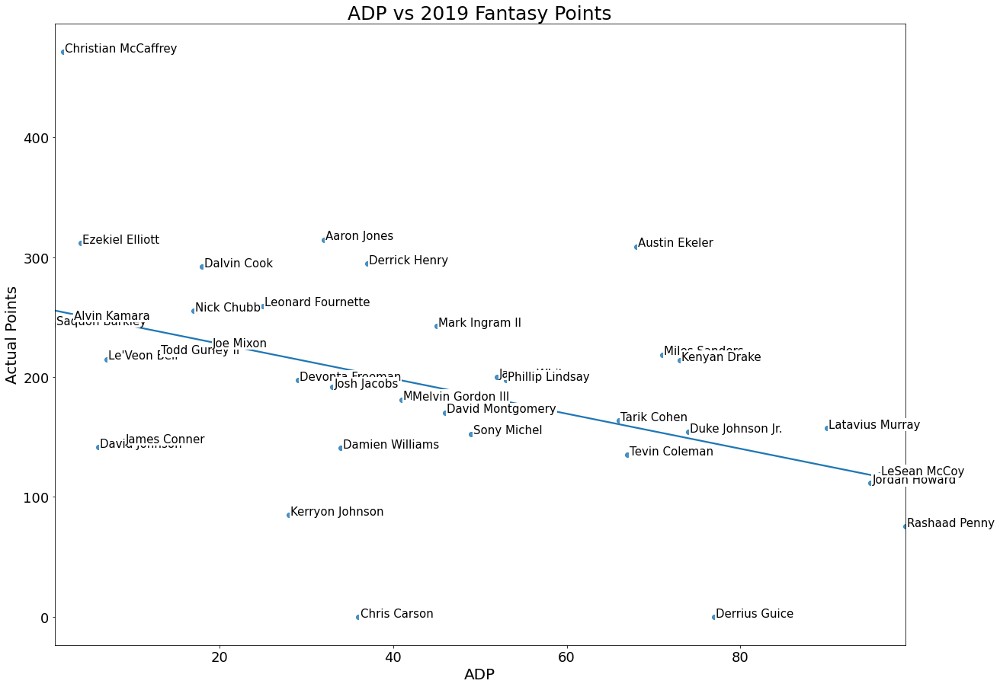

In [797]:
adp_plot_hist(adp_2019_df, 'Running Back', '2019');

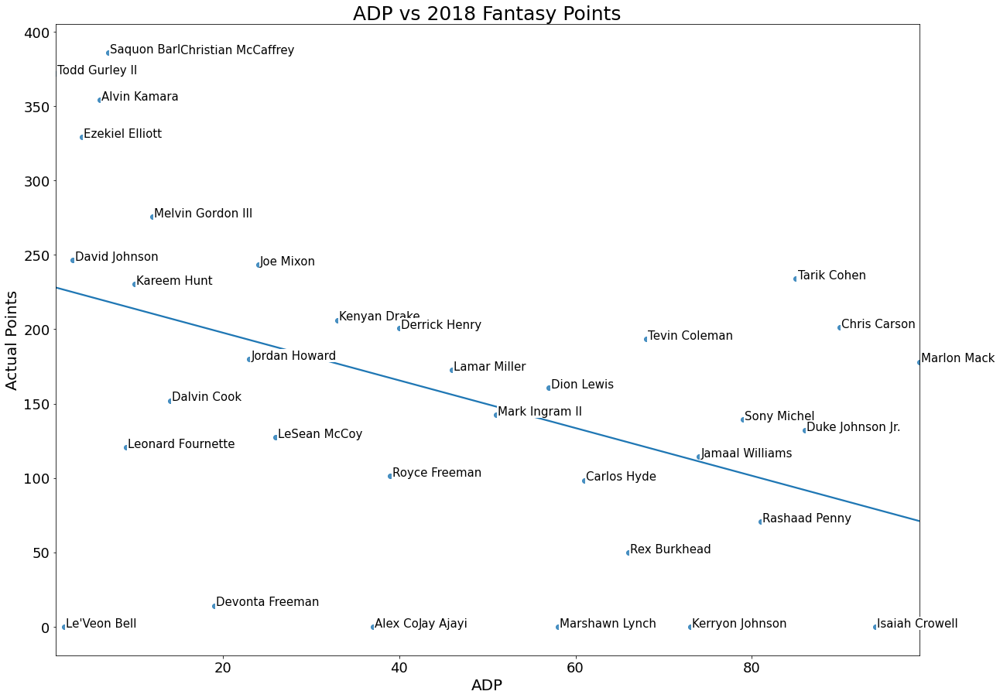

In [798]:
adp_plot_hist(adp_2018_df, 'Running Back', '2018');

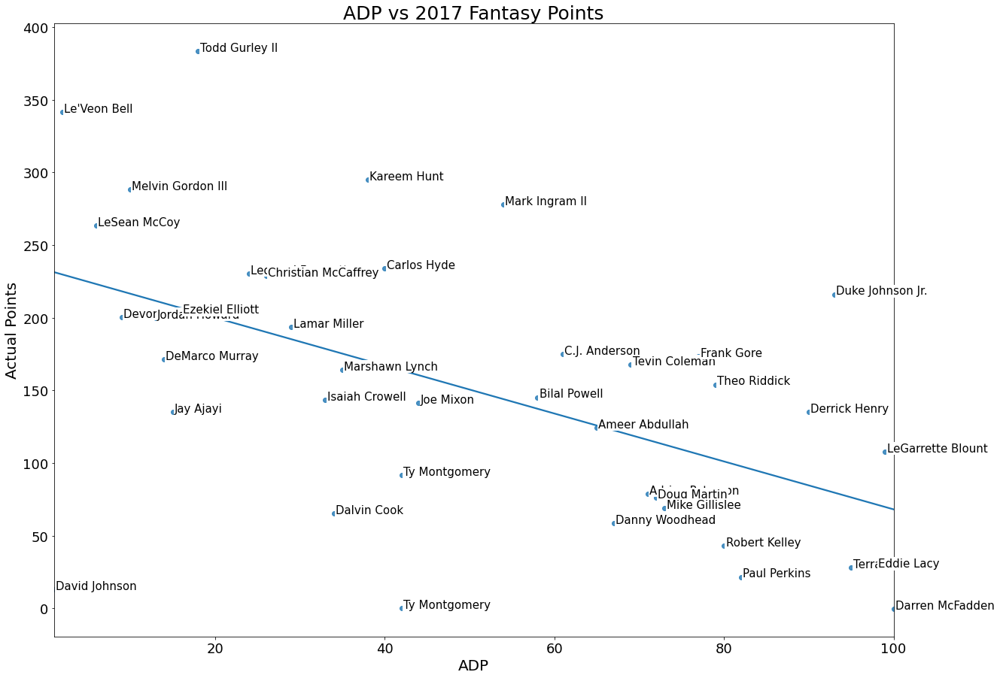

In [799]:
adp_plot_hist(adp_2017_df, 'Running Back', '2017');

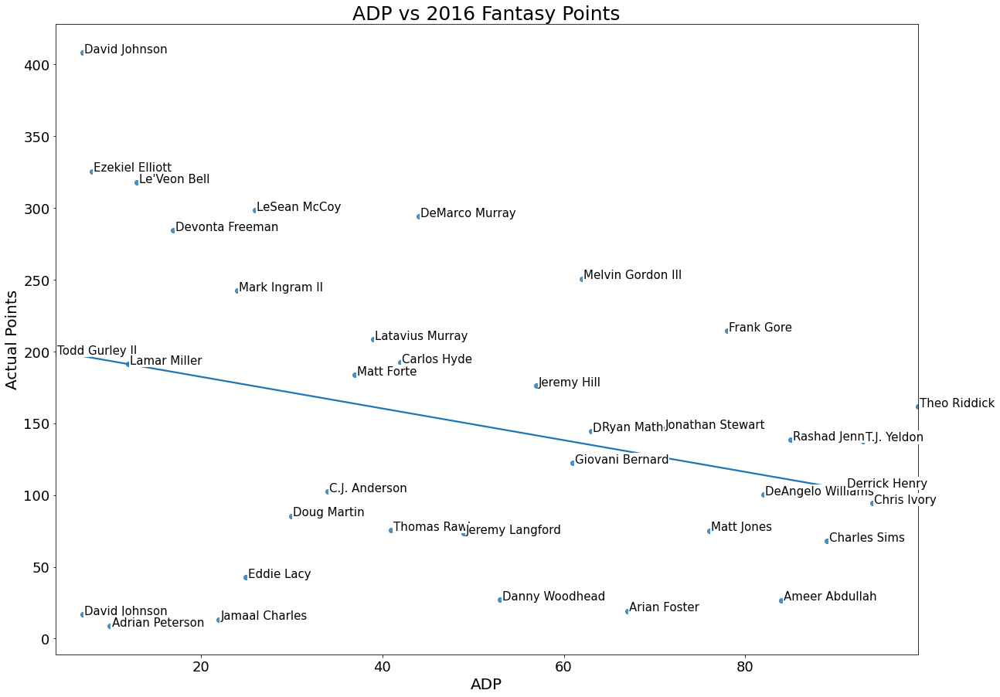

In [800]:
adp_plot_hist(adp_2016_df, 'Running Back', '2016');

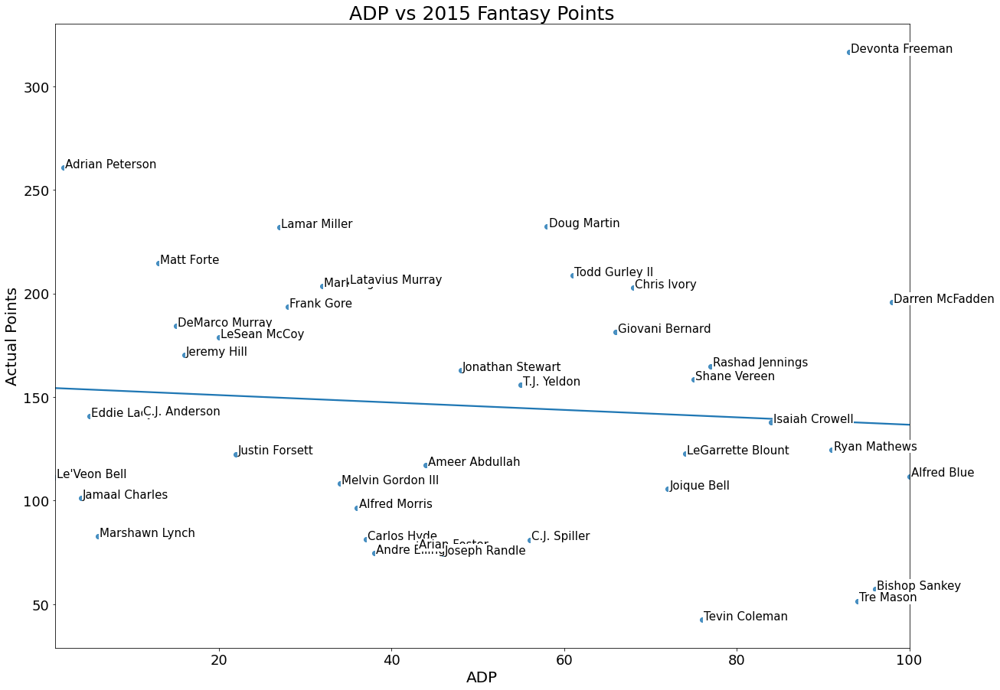

In [801]:
adp_plot_hist(adp_2015_df, 'Running Back', '2015');

#### Wide Receivers

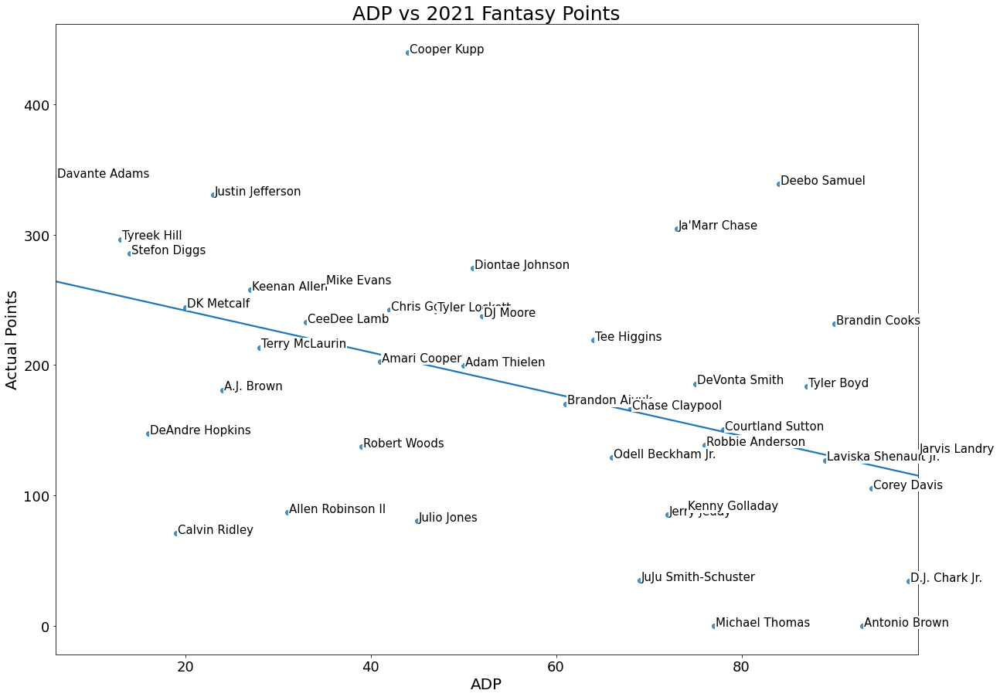

In [802]:
adp_plot_hist(adp_2021_df, 'Wide Receiver', '2021');

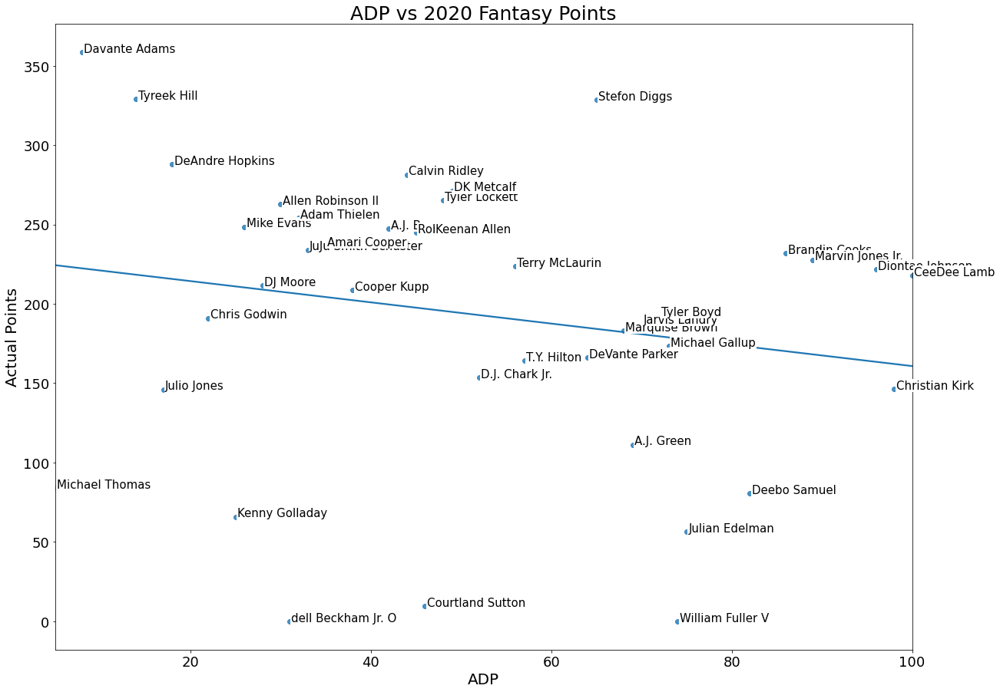

In [803]:
adp_plot_hist(adp_2020_df, 'Wide Receiver', '2020');

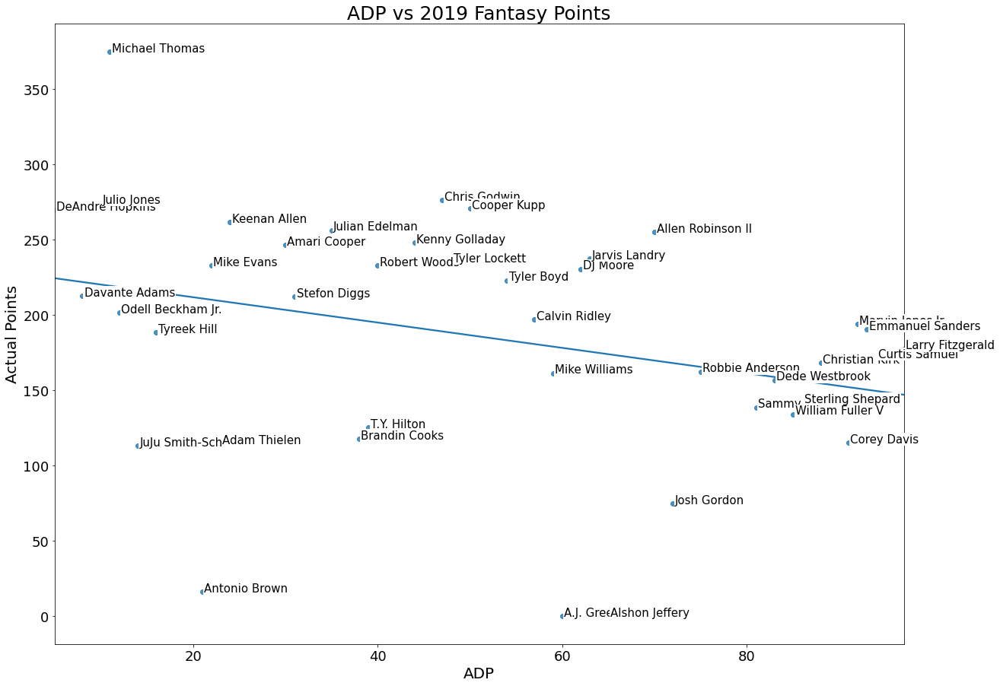

In [804]:
adp_plot_hist(adp_2019_df, 'Wide Receiver', '2019');

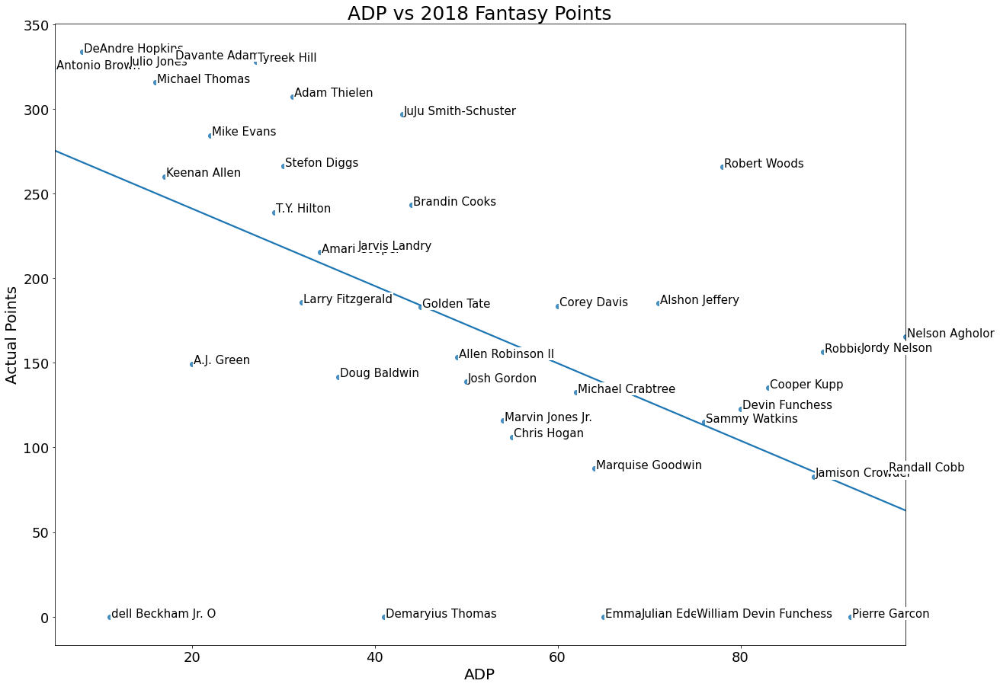

In [805]:
adp_plot_hist(adp_2018_df, 'Wide Receiver', '2018');

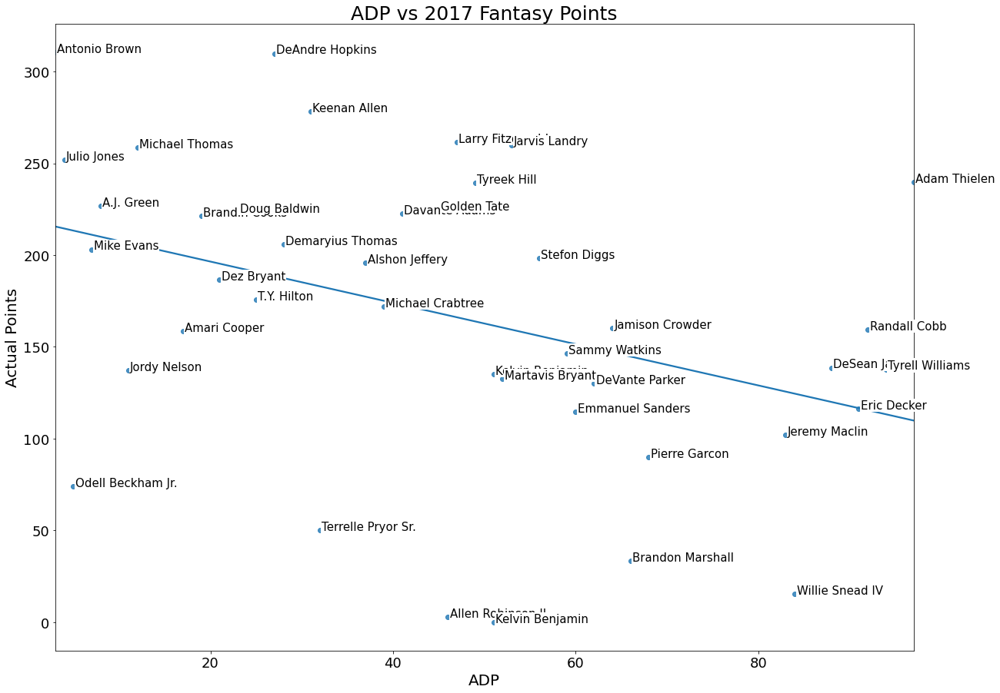

In [806]:
adp_plot_hist(adp_2017_df, 'Wide Receiver', '2017');

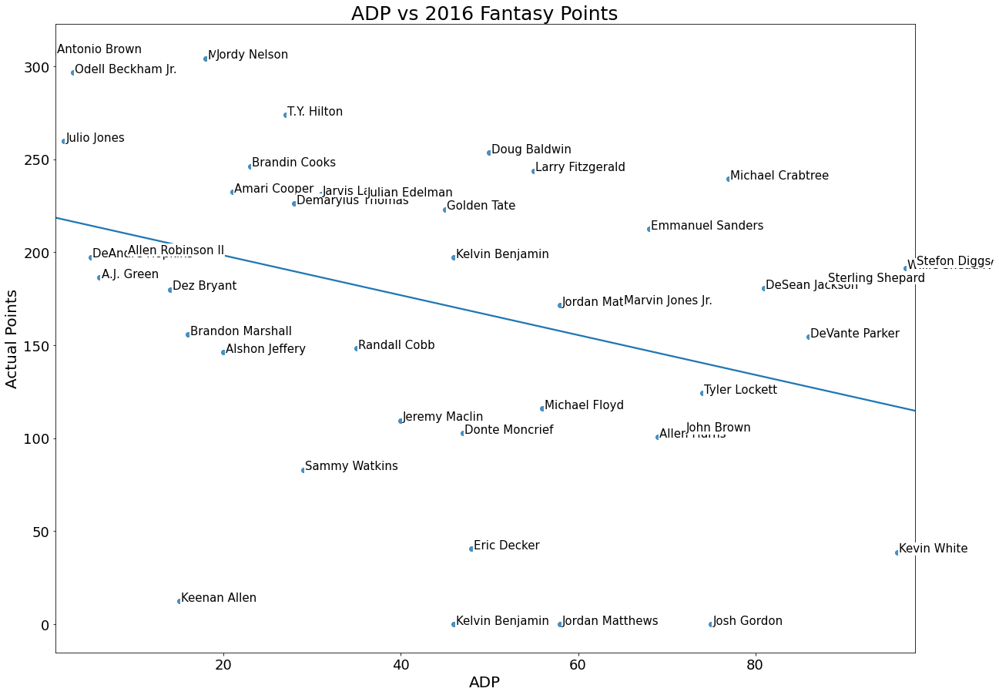

In [807]:
adp_plot_hist(adp_2016_df, 'Wide Receiver', '2016');

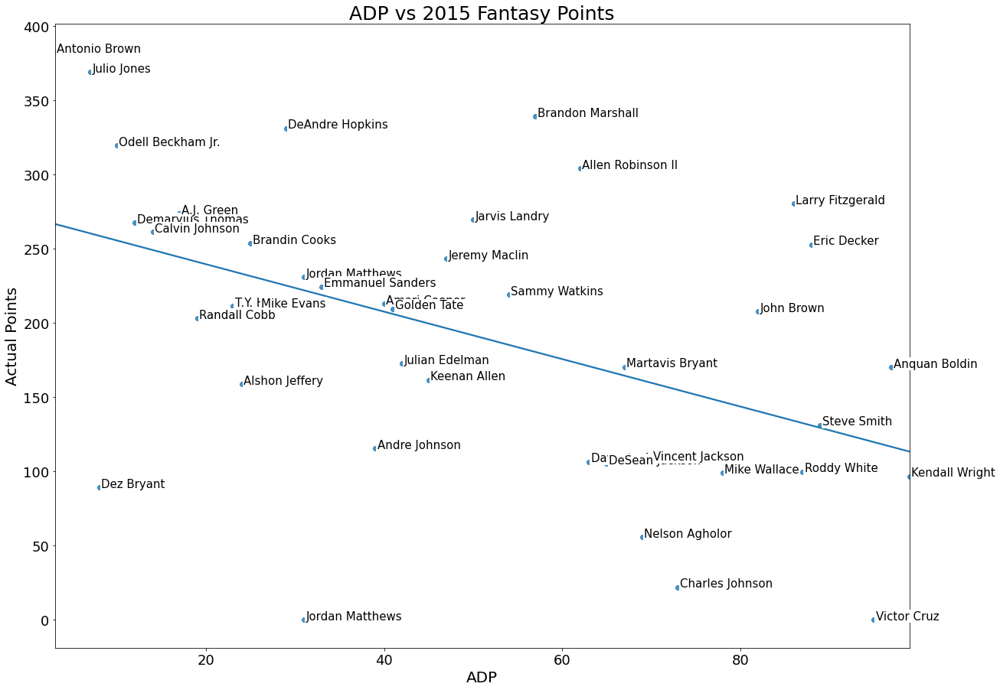

In [808]:
adp_plot_hist(adp_2015_df, 'Wide Receiver', '2015');

#### Tight Ends

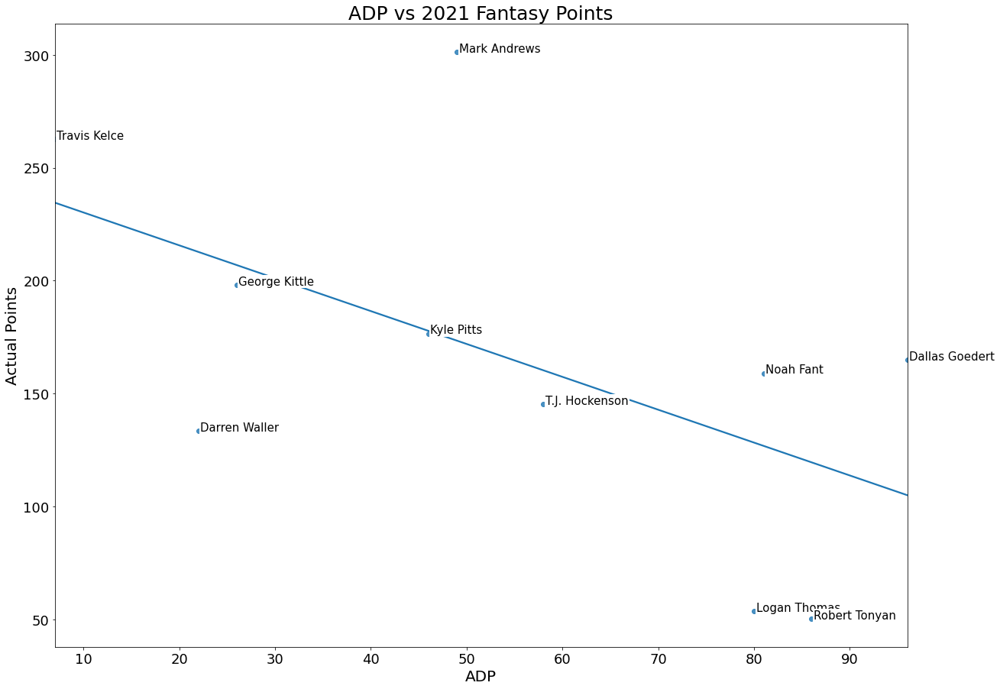

In [809]:
adp_plot_hist(adp_2021_df, 'Tight End', '2021');

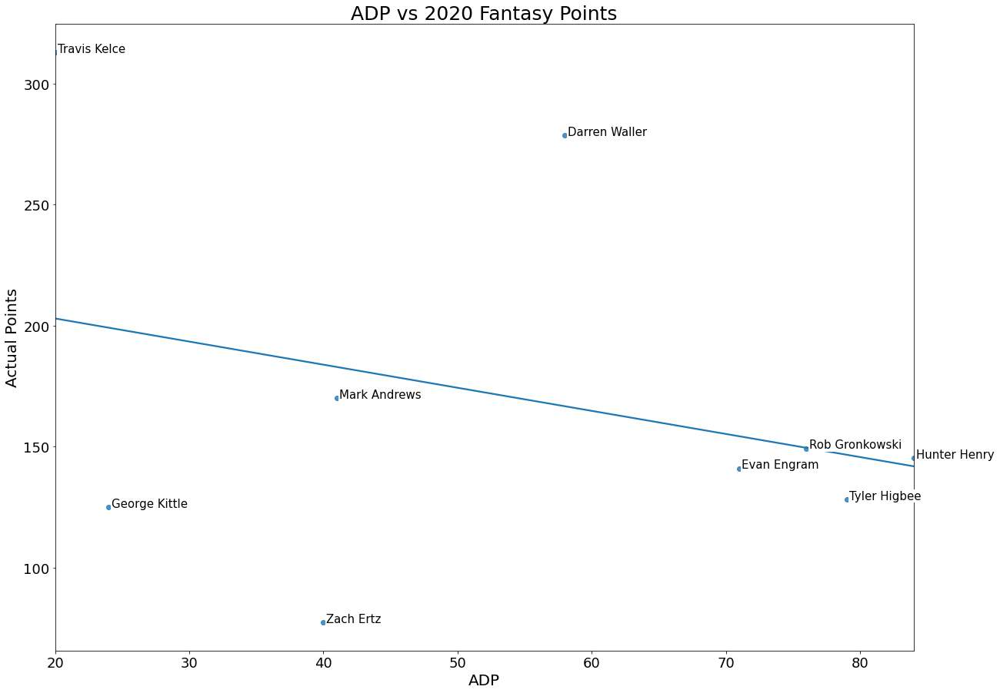

In [810]:
adp_plot_hist(adp_2020_df, 'Tight End', '2020');

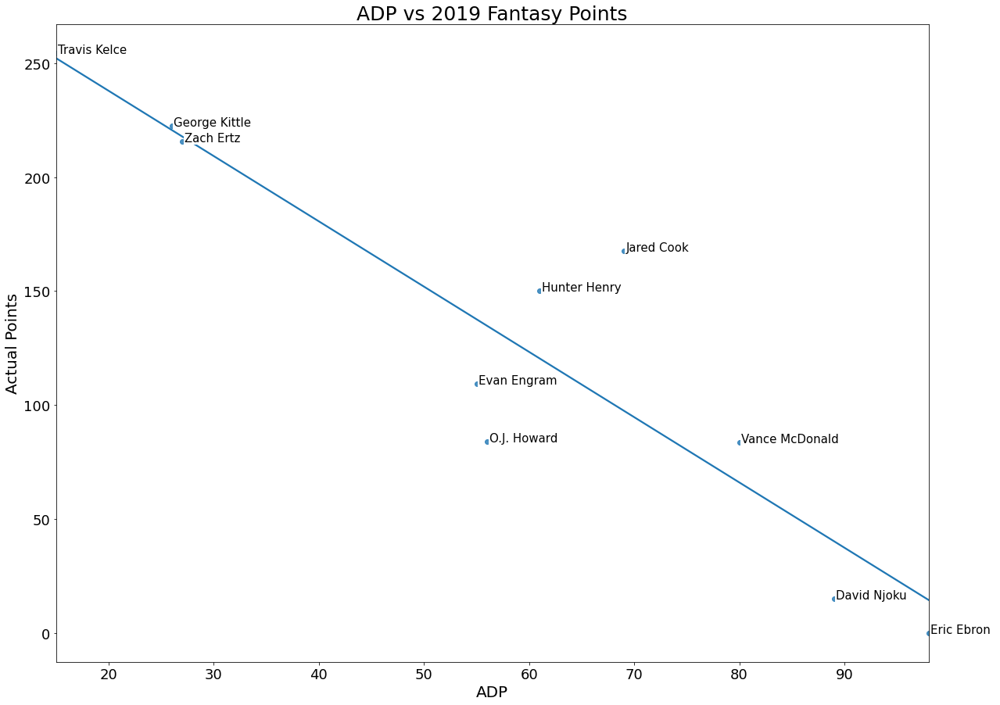

In [811]:
adp_plot_hist(adp_2019_df, 'Tight End', '2019');

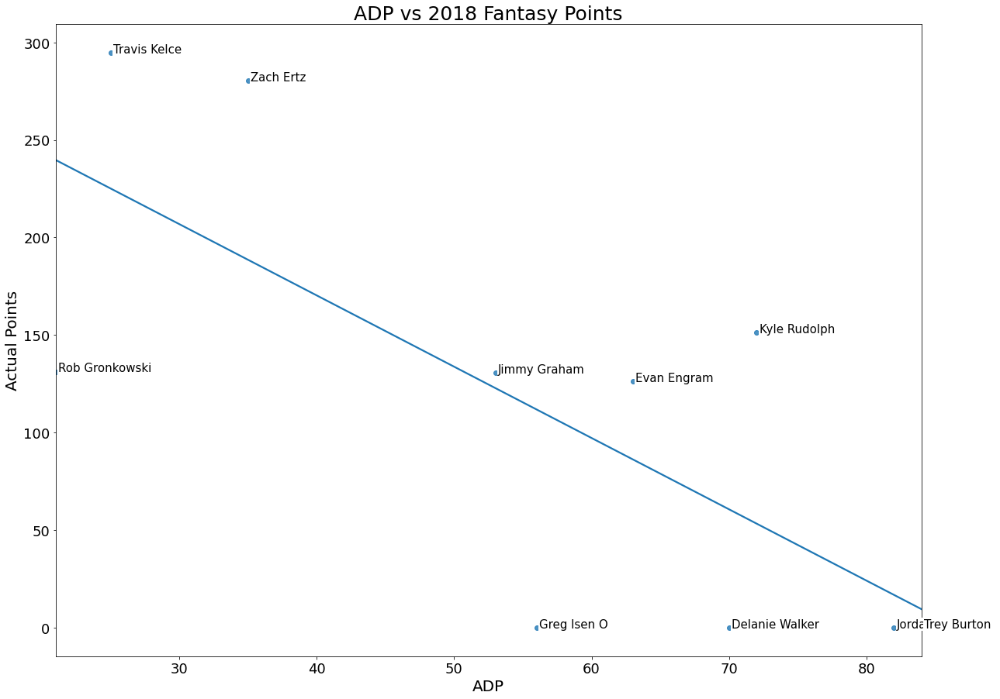

In [812]:
adp_plot_hist(adp_2018_df, 'Tight End', '2018');

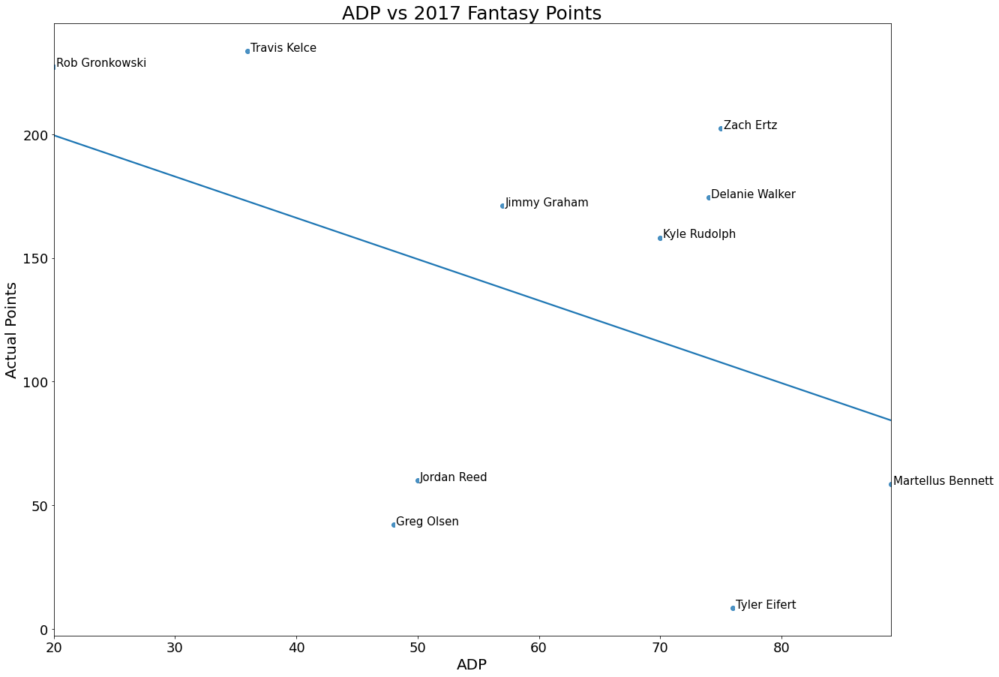

In [813]:
adp_plot_hist(adp_2017_df, 'Tight End', '2017');

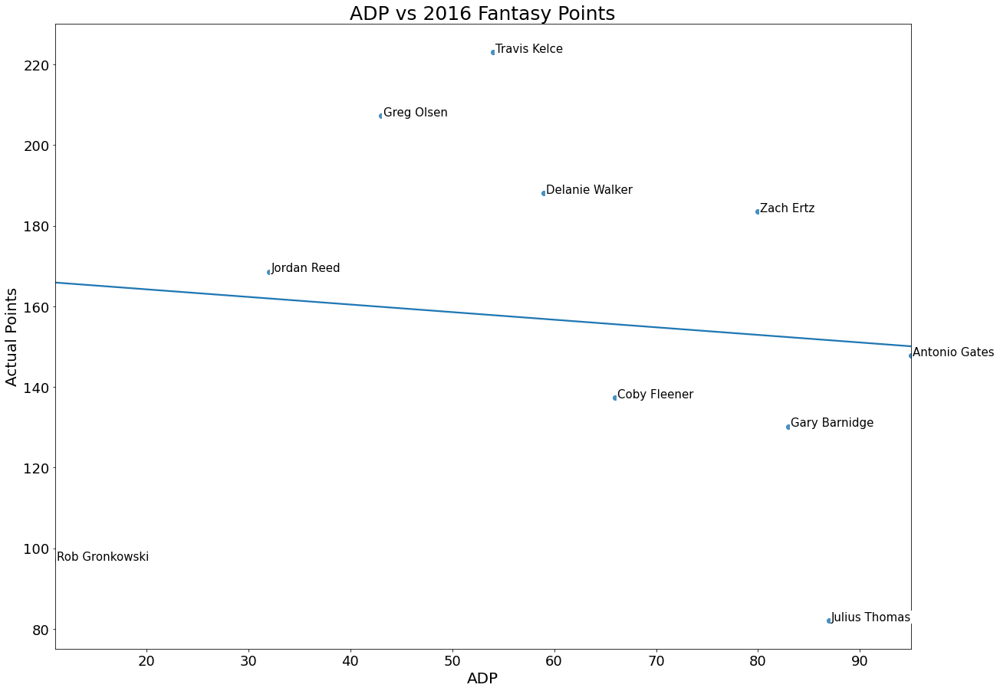

In [814]:
adp_plot_hist(adp_2016_df, 'Tight End', '2016');

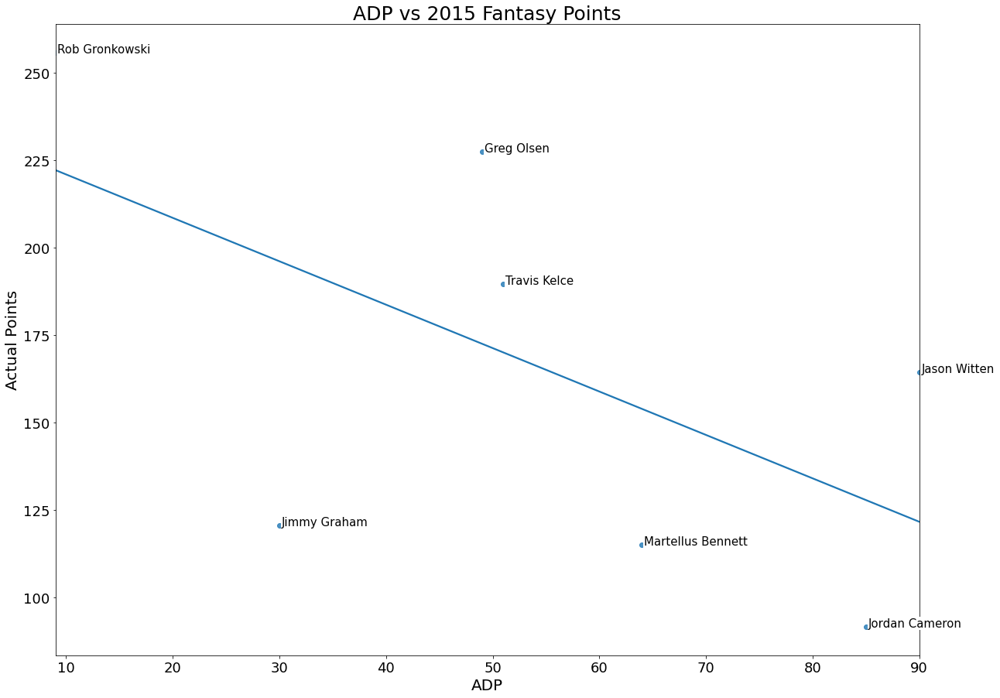

In [815]:
adp_plot_hist(adp_2015_df, 'Tight End', '2015');

#### Kickers

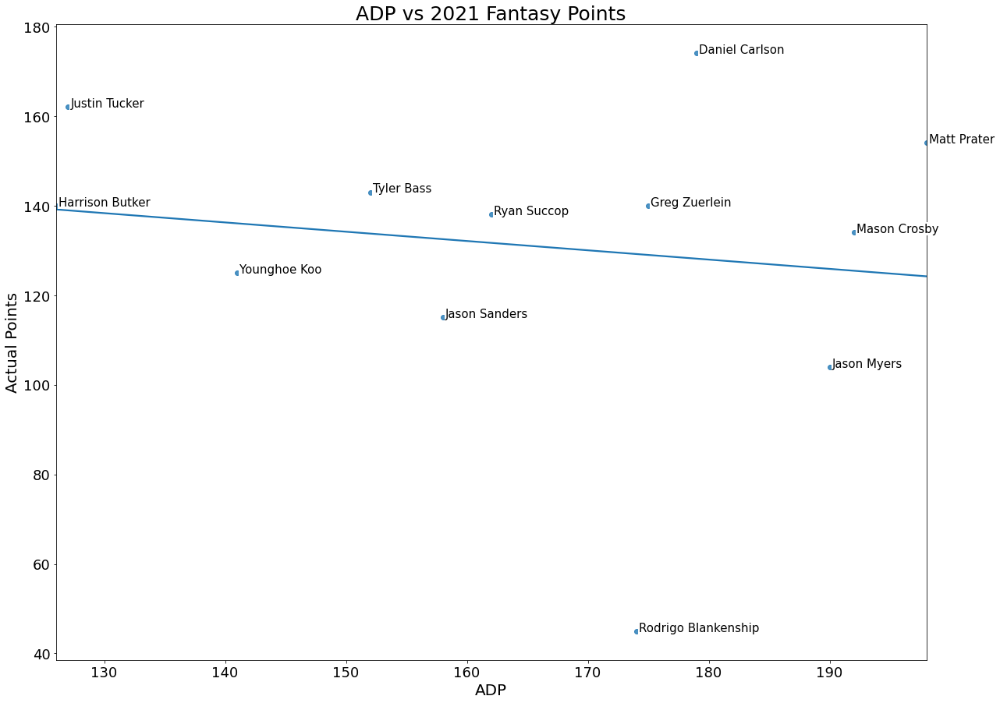

In [816]:
adp_plot_hist(adp_2021_k, 'Kicker', '2021');

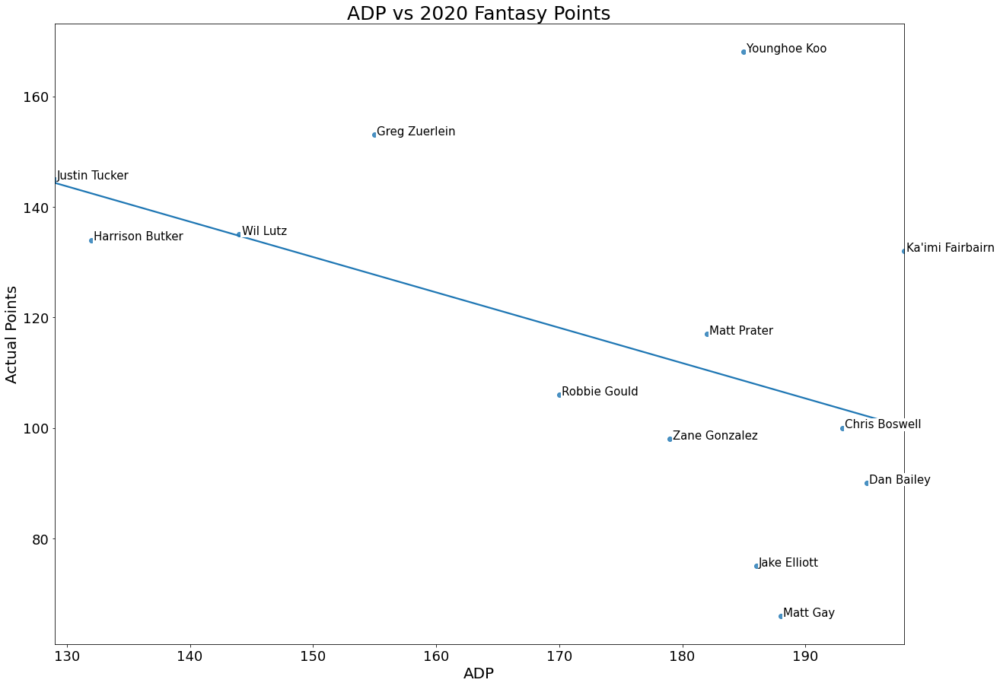

In [817]:
adp_plot_hist(adp_2020_k, 'Kicker', '2020');

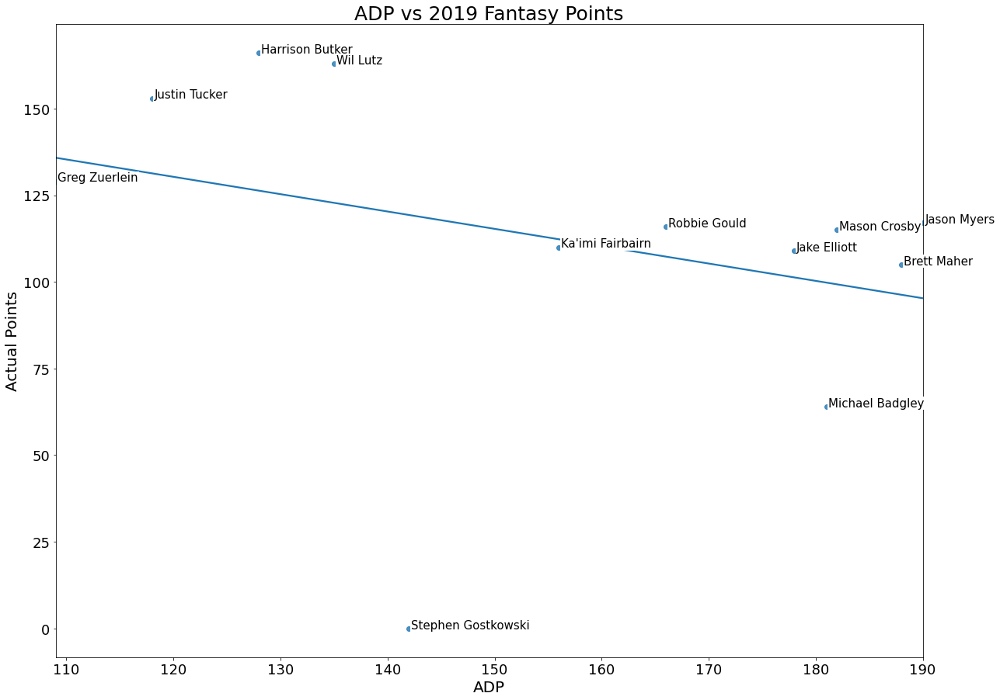

In [818]:
adp_plot_hist(adp_2019_k, 'Kicker', '2019');

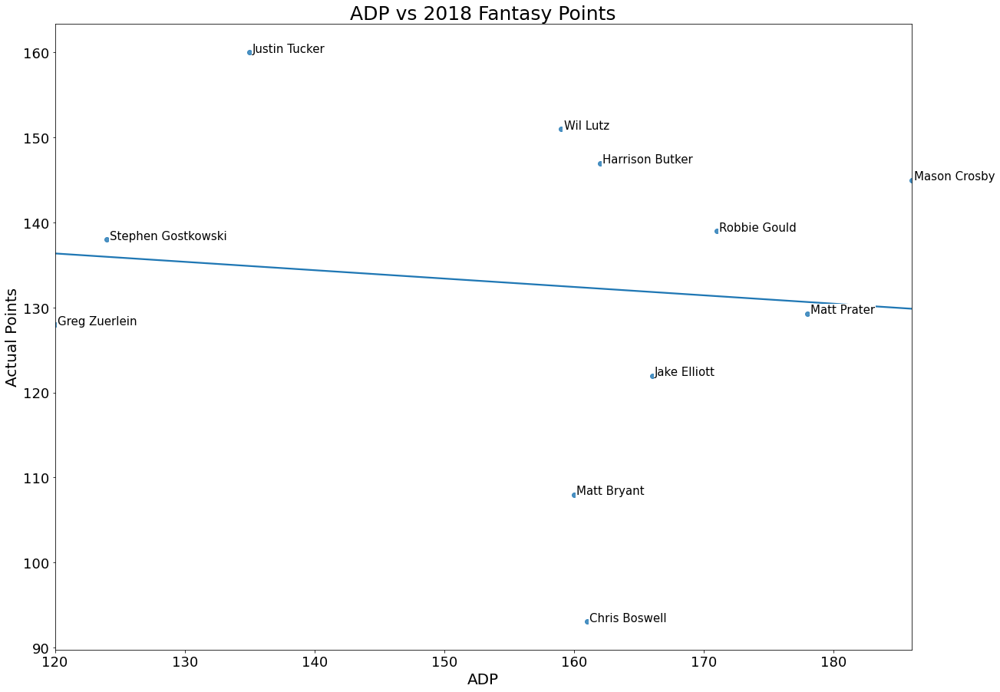

In [819]:
adp_plot_hist(adp_2018_k, 'Kicker', '2018');

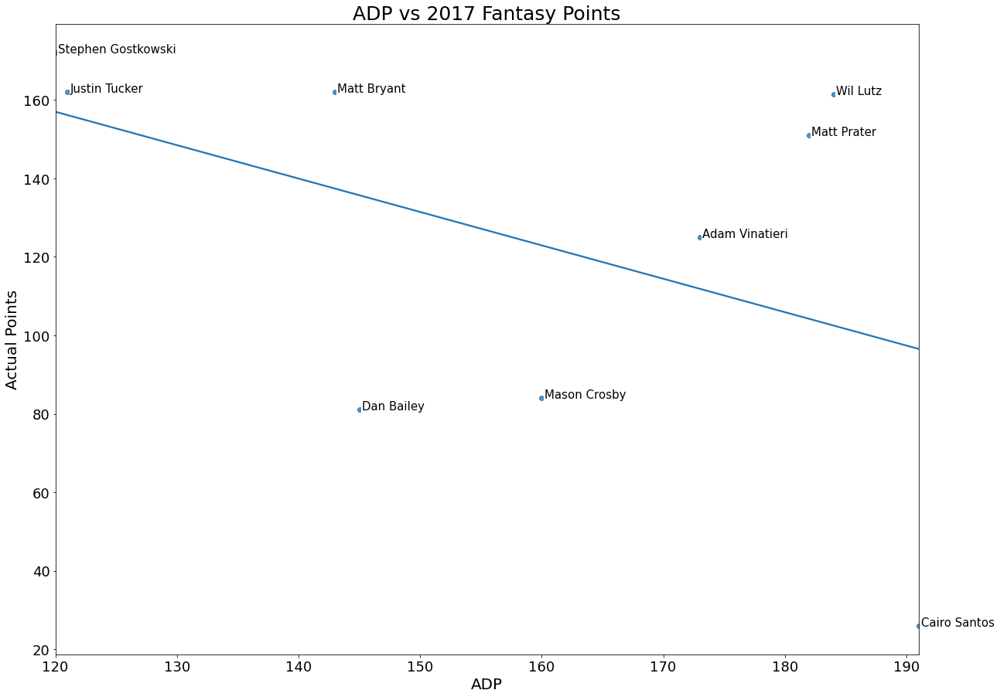

In [820]:
adp_plot_hist(adp_2017_k, 'Kicker', '2017');

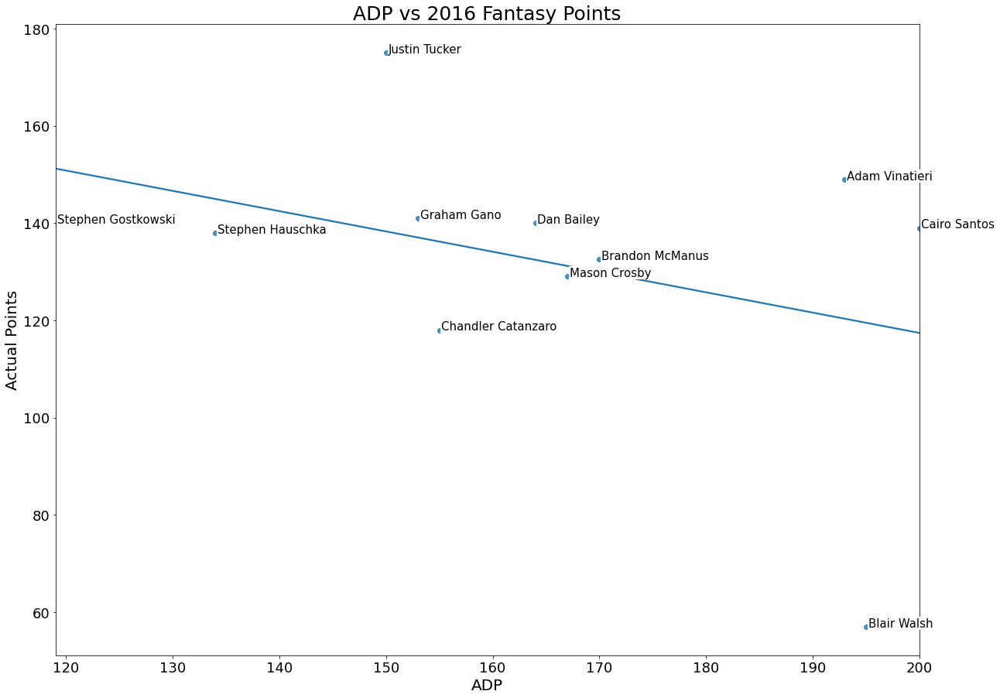

In [821]:
adp_plot_hist(adp_2016_k, 'Kicker', '2016');

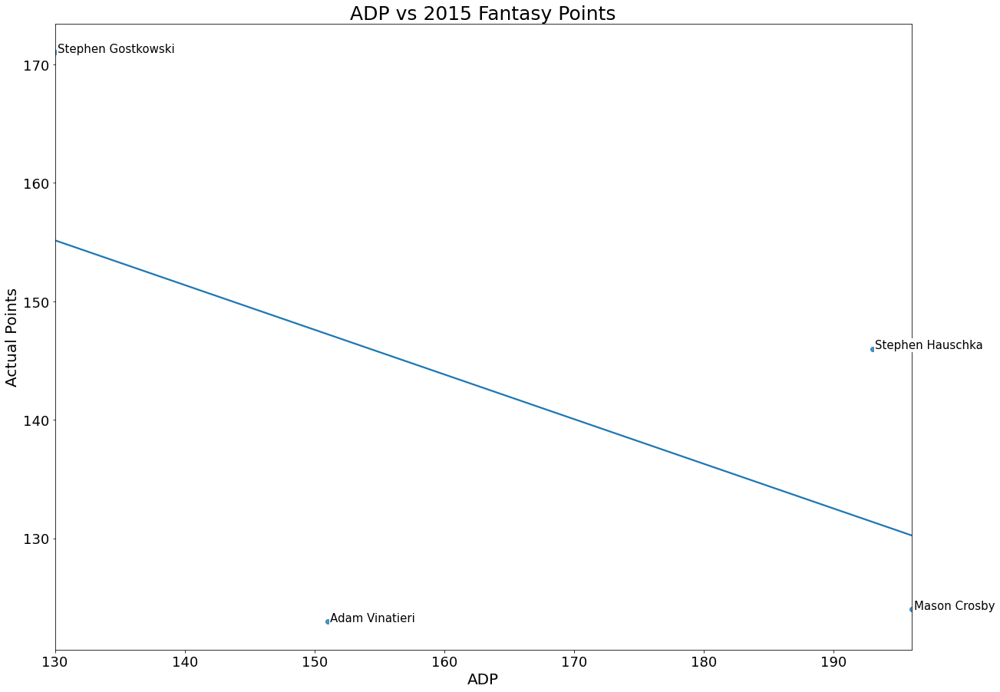

In [822]:
adp_plot_hist(adp_2015_k, 'Kicker', '2015');

#### Defense

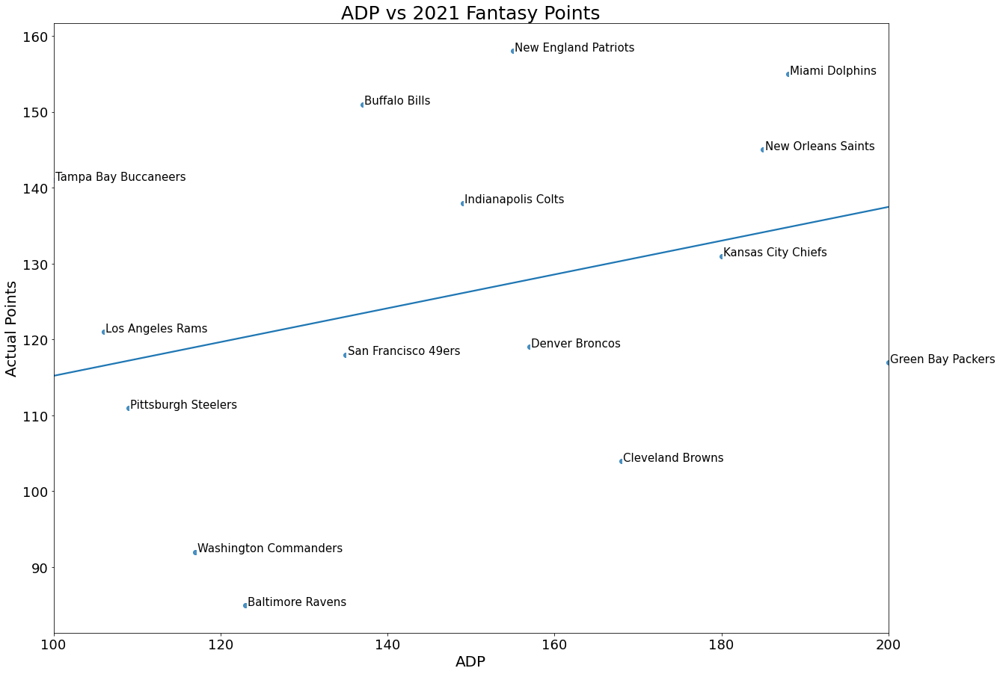

In [823]:
adp_plot_hist(adp_2021_k, 'Defense', '2021');

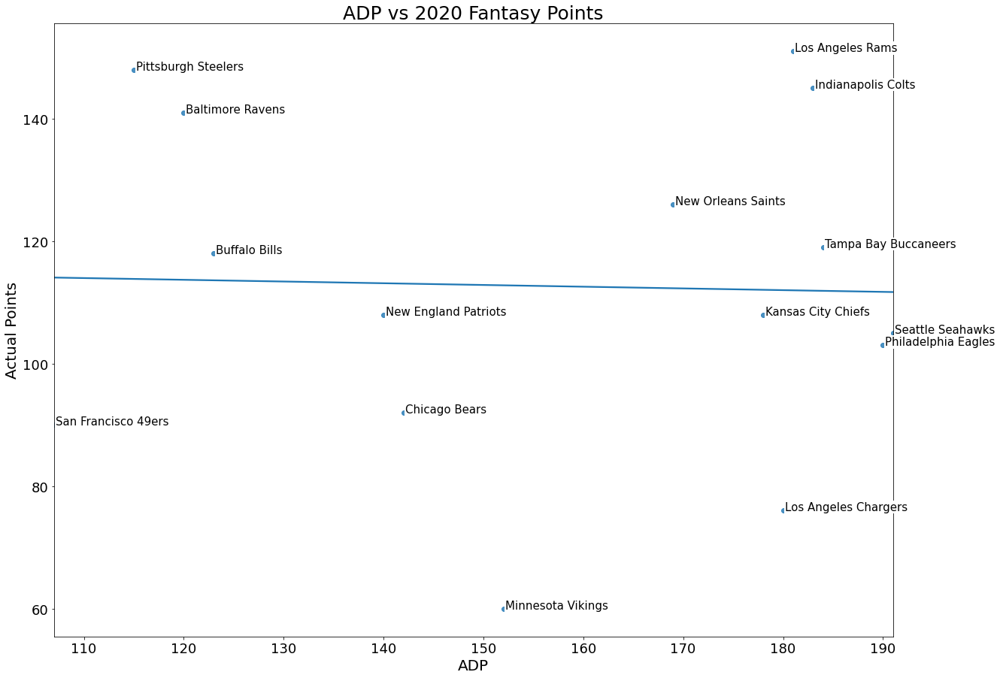

In [824]:
adp_plot_hist(adp_2020_k, 'Defense', '2020');

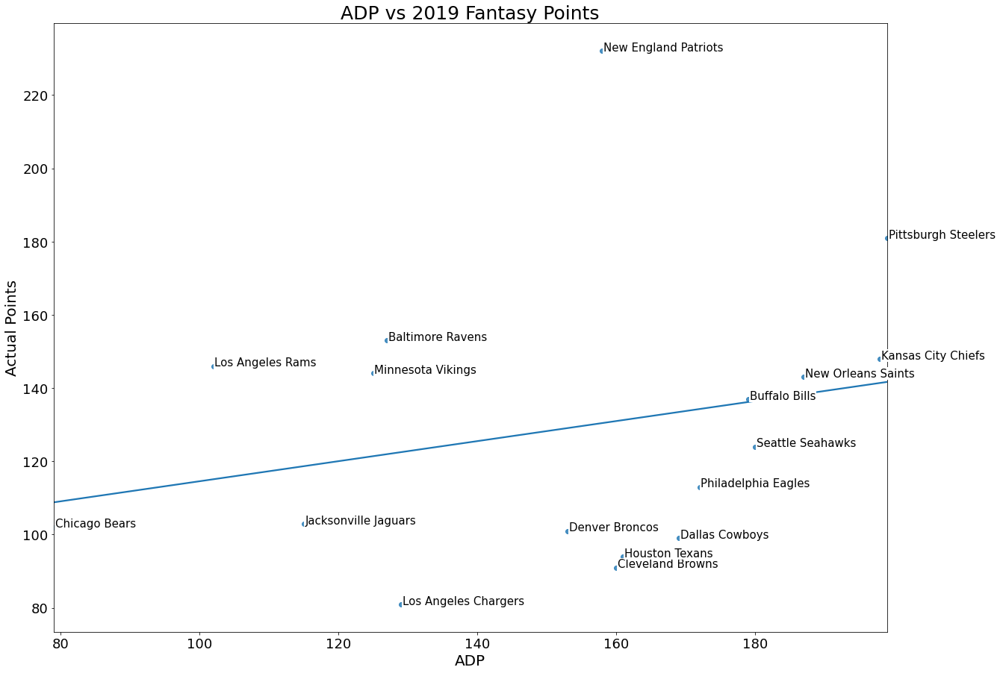

In [825]:
adp_plot_hist(adp_2019_k, 'Defense', '2019');

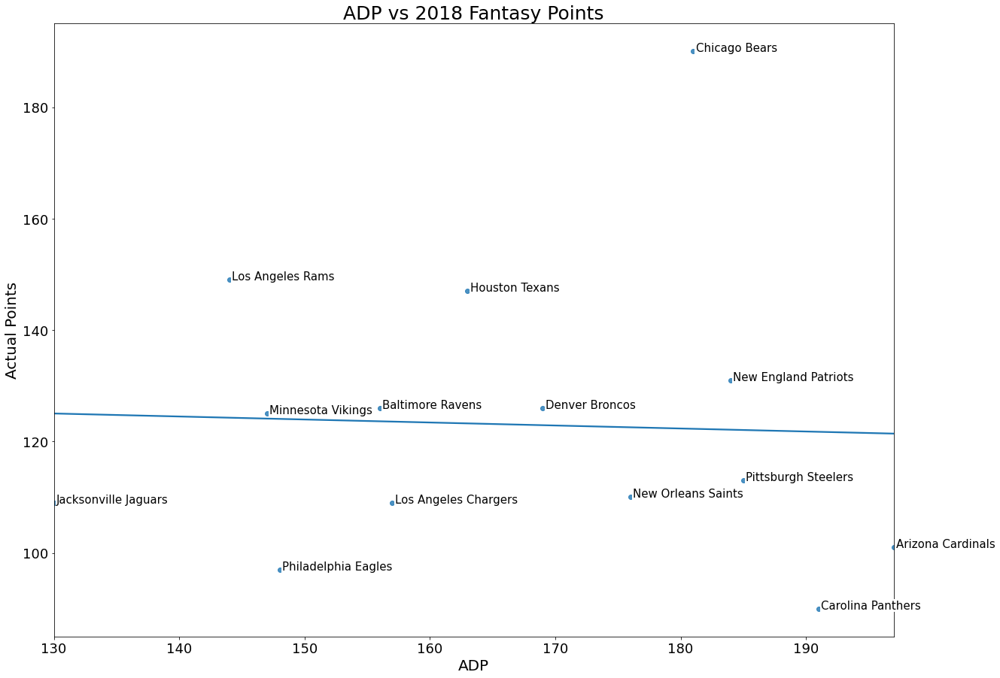

In [826]:
adp_plot_hist(adp_2018_k, 'Defense', '2018');

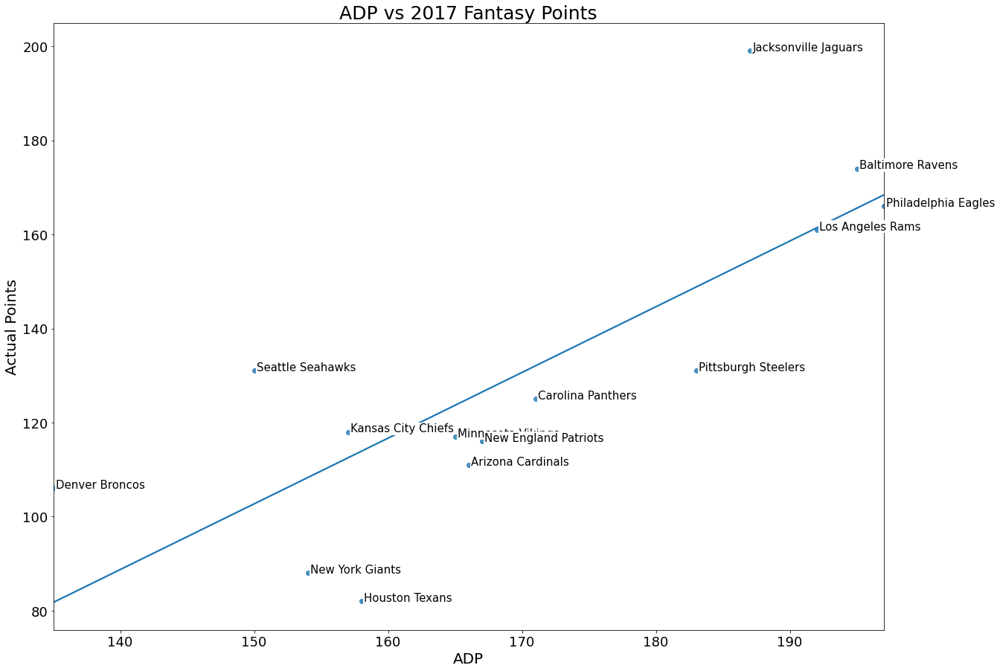

In [827]:
adp_plot_hist(adp_2017_k, 'Defense', '2017');

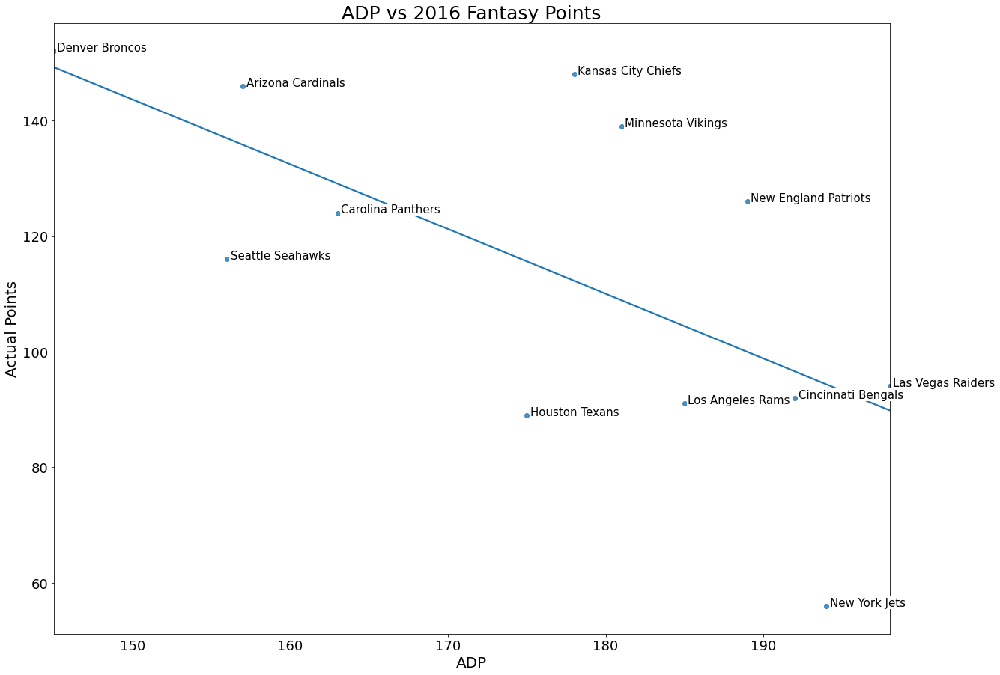

In [828]:
adp_plot_hist(adp_2016_k, 'Defense', '2016');

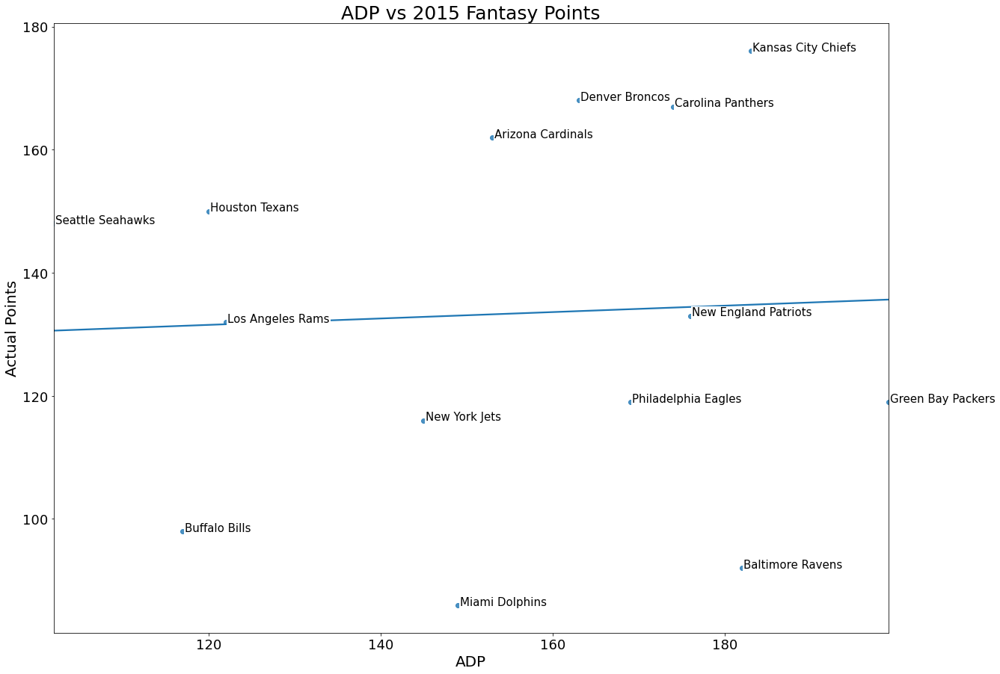

In [829]:
adp_plot_hist(adp_2015_k, 'Defense', '2015');

### Historical Fantasy Points by Round

In [646]:
adp_2015_k

,Player,POS,ADP,Rank,FPTS
0,Le'Veon Bell,RB,1.0,47.0,111.2
1,Adrian Peterson,RB,2.0,2.0,260.7
2,Antonio Brown,WR,3.0,1.0,382.2
3,Jamaal Charles,RB,4.0,51.0,101.1
4,Eddie Lacy,RB,5.0,32.0,140.6
...,...,...,...,...,...
199,Mason Crosby,K,196.0,16.0,124.0
200,Montee Ball,RB,197.0,0.0,0.0
201,Jay Ajayi,RB,198.0,84.0,42.7
202,Green Bay Packers,DST,199.0,14.0,119.0


### Discussion on EDA

## SARIMAX Modeling

### Create Individual Time Series

In [647]:
def ts_lists(ts, exog_ts):   
    '''
    Create lists of ts of fantasy points, player name, and ts of player snaps
        
    Input:
        ts : time series data of player fantasy points.
        exog_ts : exogenous time series containing player snap data.
        
    Output:
        Returns lists containing:
        - time series of fantasy points for each player
        - name of each player
        - time series of snaps for each player
    '''
    player_list = []
    for col in ts.columns:
        player = ts[col].squeeze()
        player_list.append(player)
     
    player_list_names = []
    for col in ts.columns:
        player = col
        player_list_names.append(player)
    
    player_list_snaps = []
    for col in exog_ts.columns:
        player = exog_ts[col].squeeze()
        player_list_snaps.append(player)  
    return player_list, player_list_names, player_list_snaps    

In [648]:
# Create quarterback time series lists
qb_list, qb_list_names, qb_list_snaps = ts_lists(qb_ts, qb_snap_ts)
qb_list_names

['Aaron Rodgers',
 'Baker Mayfield',
 'Dak Prescott',
 'Derek Carr',
 'Jameis Winston',
 'Josh Allen',
 'Kirk Cousins',
 'Kyler Murray',
 'Lamar Jackson',
 'Matt Ryan',
 'Matthew Stafford',
 'Patrick Mahomes II',
 'Russell Wilson',
 'Ryan Tannehill',
 'Tom Brady']

In [649]:
# Create remaining positions time series lists
wr_list, wr_list_names, wr_list_snaps = ts_lists(wr_ts, wr_snap_ts)
rb_list, rb_list_names, rb_list_snaps = ts_lists(rb_ts, rb_snap_ts)
te_list, te_list_names, te_list_snaps = ts_lists(te_ts, te_snap_ts)
te_list_names

['Dallas Goedert',
 'Dalton Schultz',
 'Darren Waller',
 'David Njoku',
 'Evan Engram',
 'George Kittle',
 'Gerald Everett',
 'Hunter Henry',
 'Irv Smith Jr.',
 'Mark Andrews',
 'Mike Gesicki',
 'Noah Fant',
 'T.J. Hockenson',
 'Travis Kelce',
 'Tyler Higbee',
 'Zach Ertz']

### Seasonal Decompostion

In [650]:
def decomposition_plot(ts):
    decomposition = sm.tsa.seasonal_decompose(ts, model='additive', period=16)

    #Gather the trend, seasonality, and residuals
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

    # Plot gathered statistics
    plt.figure(figsize=(12,8))
    plt.subplot(411)
    plt.plot(ts, label='Original', color='blue')
    plt.legend(loc='best')
    plt.subplot(412)
    plt.plot(trend, label='Trend', color='blue')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal,label='Seasonality', color='blue')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals', color='blue')
    plt.legend(loc='best')
    plt.tight_layout();
    return decomposition_plot

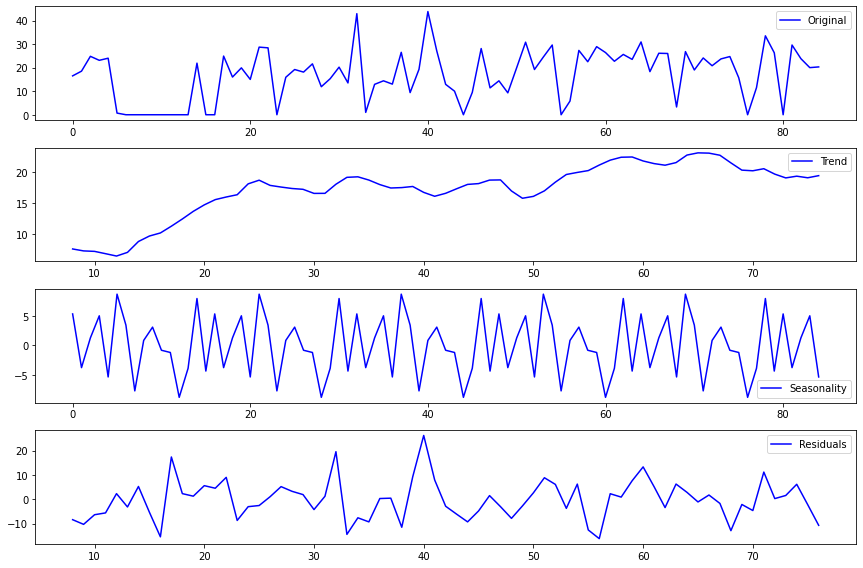

In [651]:
#Decomposition plot of Aaron Rodgers
decomposition_plot(qb_list[0]);

In [652]:
qb_ts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85 entries, 0 to 84
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Aaron Rodgers       85 non-null     float64
 1   Baker Mayfield      85 non-null     float64
 2   Dak Prescott        85 non-null     float64
 3   Derek Carr          85 non-null     float64
 4   Jameis Winston      85 non-null     float64
 5   Josh Allen          85 non-null     float64
 6   Kirk Cousins        85 non-null     float64
 7   Kyler Murray        85 non-null     float64
 8   Lamar Jackson       85 non-null     float64
 9   Matt Ryan           85 non-null     float64
 10  Matthew Stafford    85 non-null     float64
 11  Patrick Mahomes II  85 non-null     float64
 12  Russell Wilson      85 non-null     float64
 13  Ryan Tannehill      85 non-null     float64
 14  Tom Brady           85 non-null     float64
dtypes: float64(15)
memory usage: 10.1 KB


### Stationarity Check

In [653]:
def stationarity_check(ts):
    
    # Calculate rolling statistics
    roll_mean = ts.rolling(window=8, center=False).mean()
    roll_std = ts.rolling(window=8, center=False).std()
    
    # Perform the Dickey Fuller test
    dftest = adfuller(ts) 
    
    # Plot rolling statistics:
    fig = plt.figure(figsize=(12,6))
    orig = plt.plot(ts, color='blue',label='Original')
    mean = plt.plot(roll_mean, color='red', label='Rolling Mean')
    std = plt.plot(roll_std, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Print Dickey-Fuller test results
    print('Results of Dickey-Fuller Test: \n')

    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', 
                                             '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    
    return None

In [654]:
# Get decomposition for stationarity check
decomposition = sm.tsa.seasonal_decompose(qb_list[0], model='additive', period=16)
residual = decomposition.resid
ts_log_decompose = residual
ts_log_decompose.dropna(inplace=True)

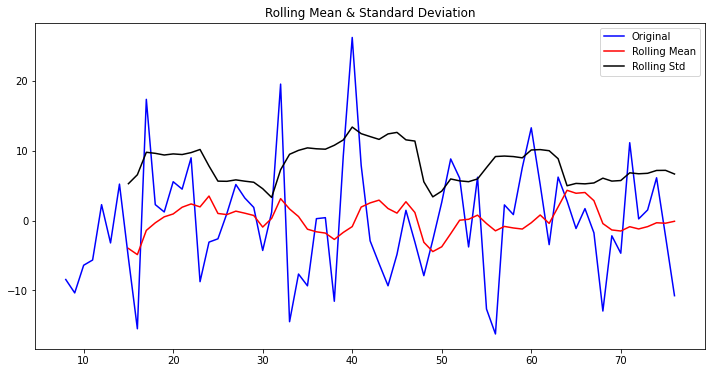

Results of Dickey-Fuller Test: 

Test Statistic                 -5.403261
p-value                         0.000003
#Lags Used                      5.000000
Number of Observations Used    63.000000
Critical Value (1%)            -3.538695
Critical Value (5%)            -2.908645
Critical Value (10%)           -2.591897
dtype: float64


In [655]:
stationarity_check(ts_log_decompose)

The p-value is <0.05, which means we accept the null hypothesis that the residuals are stationary. We can move on to check our autocorrelation and partial autocorrelation plots.

### Autocorrelation and Partial Autocorrelation

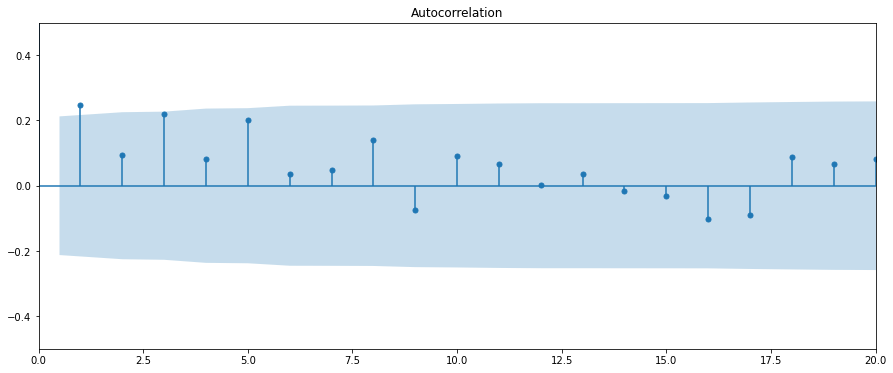

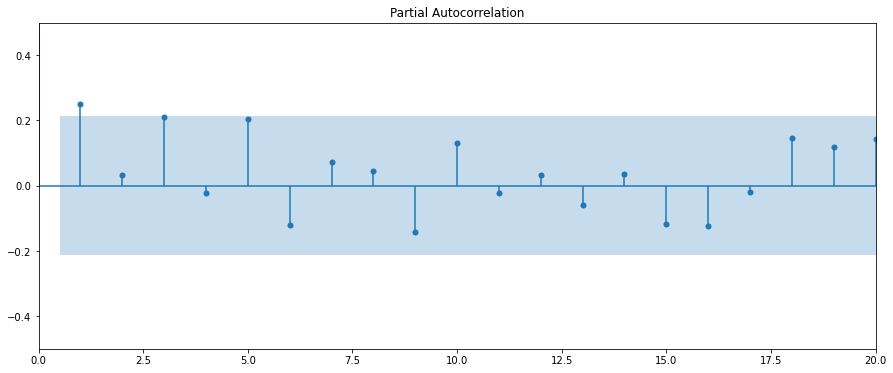

In [656]:
plot_acf(qb_list[0]); plt.xlim(0,20); plt.ylim(-0.5,0.5);plt.show()
plot_pacf(qb_list[0]); plt.xlim(0,20); plt.ylim(-0.5,0.5);plt.show()

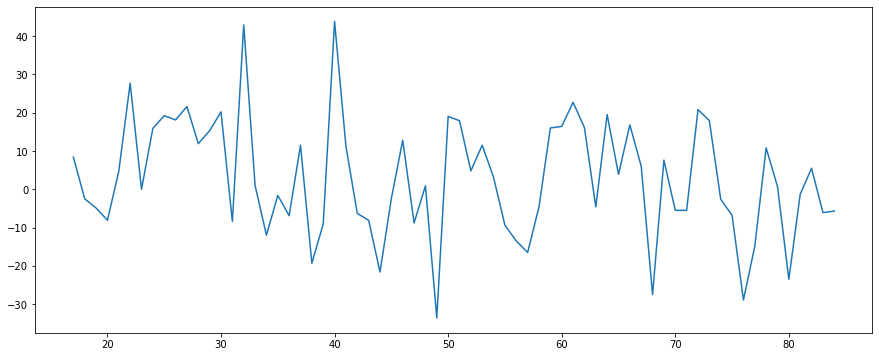

In [657]:
qb_list[0].diff(periods=17).plot();

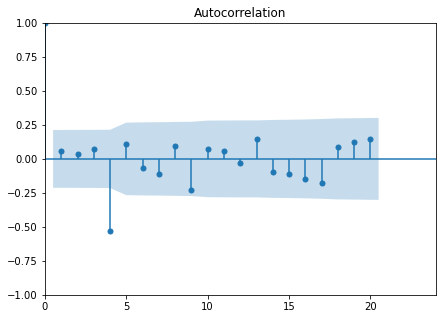

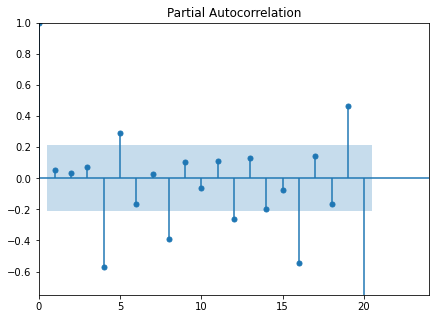

In [658]:
rcParams['figure.figsize']=7,5
plot_acf(qb_list[0].diff(periods=4).bfill()); plt.xlim(0,24); plt.show()
plot_pacf(qb_list[0].diff(periods=4).bfill()); plt.xlim(0,24); plt.ylim(-0.75,1);plt.show()

### Gridsearch for SARIMAX Model

Next, I am going to conduct gridsearch to find optimal values for (p,d,q) and (P,D,Q,s) ranked by lowest AIC. This will provide optimal parameters for each of my players for Sarimax modeling. 

In [659]:
def gridsearch(ts, player_name, player_snaps):
    '''
    Create dataframe of best parameters based on lowest AIC from SARIMAX gridsearch
        
    Input:
        ts : list of time series data containing player fantasy points.
        player_name : list of player names for each time series
        player_snaps :  list of exogenous time series containing player snap data.
        
    Output:
        returns dataframe containing:
        - player name
        - optimal pdq parameter
        - optimal pdqs parameter
        - AIC score
    '''
    # Define the p, d and q parameters to take any value between 0 and 2
    p = d = q = range(0, 2)

    # Generate all different combinations of p, q and q triplets
    pdq = list(itertools.product(p, d, q))

    # Generate all different combinations of seasonal p, q and q triplets
    pdqs = [(x[0], x[1], x[2], 0) for x in list(itertools.product(p, d, q))]
    
    # Run a grid with pdq and seasonal pdq parameters calculated above and get the best AIC value
    ans = []
    for df, name, snaps in zip(ts, player_name, player_snaps):
            for comb in pdq:
                for combs in pdqs:
                    try:
                        mod = sm.tsa.statespace.SARIMAX(df,
                                                        exog=snaps,
                                                        order=comb,
                                                        seasonal_order=combs,
                                                        enforce_stationarity=False,
                                                        enforce_invertibility=False)

                        output = mod.fit()
                        ans.append([name, comb, combs, output.aic])
                    except:
                        continue
                        
    # Find the parameters with minimal AIC value
    ans_df = pd.DataFrame(ans, columns=['name', 'pdq', 'pdqs', 'aic'])            
    #Return the best set of parameters based on AIC
    best_para = ans_df.loc[ans_df.groupby("name")["aic"].idxmin()]
    return best_para

In [660]:
# Perform gridsearch function for all postions and save as pos_gs
qb_gs = gridsearch(qb_list, qb_list_names, qb_list_snaps)
wr_gs = gridsearch(wr_list, wr_list_names, wr_list_snaps)
rb_gs = gridsearch(rb_list, rb_list_names, rb_list_snaps)
te_gs = gridsearch(te_list, te_list_names, te_list_snaps)
qb_gs

,name,pdq,pdqs,aic
3,Aaron Rodgers,"(0, 1, 1)","(0, 0, 0, 0)",564.916297
13,Baker Mayfield,"(1, 0, 1)","(0, 0, 0, 0)",510.911836
19,Dak Prescott,"(0, 1, 1)","(0, 0, 0, 0)",573.703541
27,Derek Carr,"(0, 1, 1)","(0, 0, 0, 0)",532.572588
33,Jameis Winston,"(0, 0, 1)","(0, 0, 0, 0)",523.348882
43,Josh Allen,"(0, 1, 1)","(0, 0, 0, 0)",557.924810
51,Kirk Cousins,"(0, 1, 1)","(0, 0, 0, 0)",533.511544
57,Kyler Murray,"(0, 0, 1)","(0, 0, 0, 0)",520.353682
67,Lamar Jackson,"(0, 1, 1)","(0, 0, 0, 0)",552.386860
75,Matt Ryan,"(0, 1, 1)","(0, 0, 0, 0)",558.654653


### Best Parameters SARIMAX Model

Now that we have our optimal parameters for each zip code from our gridsearch, we will use the to build a sarimax model for each zip code.  Following are 3 functions we will use to build, evaluate and test each model, and forecast predictions for each of our top 10 zip codes.

#### Functions for Modeling

In [661]:
# Define function to build SARIMAX model, print summary and output diagnostic plots
def sarimax(ts, exog, order, seasonal_order):
    '''
    Input: 
    ts : Time series data.
    exog : Exogenous time series data (player snaps)
    order : (p, d, q) values for ARIMA.
    seasonal_order : Seasonal (P, D, Q, s) values for SARIMAX.
        
    Output:
    Prints model output summary.
    Plots model diagnostics.
    
    Returns: 
    Model output.
    '''
    # Sarimax model
    SARIMAX = sm.tsa.statespace.SARIMAX(ts,
                                        exog=exog,
                                        order=order, 
                                        seasonal_order=seasonal_order, 
                                        enforce_stationarity=False, 
                                        enforce_invertibility=False)
                                            
    # Fit the model and print results
    output = SARIMAX.fit()
    
    # Print output summary
    print(output.summary().tables[1])
    output.plot_diagnostics(figsize=(15,18));
    
    return output

In [662]:
def ose_forecast(ts, output, exog, player =''):
    '''
    Plot forecast with real and predicted data.
    
    Input:
        ts : Time series.
        output : SARIMAX model output.
        exog : exogenous time series (player snaps)
        player : Name of player for plot title. 
        
    Output:
        Prints RMSE.
        Plots real vs. model predicted plot.
    '''
    # Get predictions starting from 2021 week 1 and calculate confidence intervals
    pred = output.get_prediction(start=70, exog=exog, dynamic=False)
        
    # Get the real and predicted values
    ts_forecasted = pred.predicted_mean
    ts_truth = ts[70:].values
    
    # Calc RMSE
    mse = mean_squared_error(ts_truth, ts_forecasted)
    rmse = np.sqrt(mse)

    # Print RMSE
    print('The RMSE of our forecasts is {}'.format(round(rmse, 2)))

    # Confidence Intervals
    pred_conf = pred.conf_int()

    ### Plot real vs predicted w/ confidence intervals ###

    rcParams['figure.figsize'] = 15, 6

    # Plot observed values
    ax = ts[25:].plot(label='observed')

    # Plot predicted values
    ts_forecasted.plot(ax=ax, label='one-step ahead forecast', alpha=0.5)

    # Plot the range for confidence intervals
    ax.fill_between(pred_conf.index,
                    pred_conf.iloc[:, 0],
                    pred_conf.iloc[:, 1], color='g', alpha=.3)
        
    # Title
    ax.set_title(player)

    # Set axes labels
    ax.set_xlabel('Game Date')
    ax.set_ylabel('PPR Fantasy Points')
    plt.legend()

    return plt.show()

In [663]:
qb_snap_ts.describe()

,snaps_Aaron Rodgers,snaps_Baker Mayfield,snaps_Dak Prescott,snaps_Derek Carr,snaps_Jameis Winston,snaps_Josh Allen,snaps_Kirk Cousins,snaps_Kyler Murray,snaps_Lamar Jackson,snaps_Matt Ryan,snaps_Matthew Stafford,snaps_Patrick Mahomes II,snaps_Russell Wilson,snaps_Ryan Tannehill,snaps_Tom Brady
count,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000
mean,52.388235,45.411765,54.647059,59.011765,35.658824,45.011765,60.541176,34.988235,38.611765,61.447059,53.647059,47.423529,59.000000,39.635294,64.176471
std,27.355288,30.727797,28.663776,19.816115,33.503572,31.148070,20.237608,34.228050,33.116711,19.236935,24.896790,31.651892,21.067352,31.634011,18.135847
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50.000000,0.000000,55.000000,56.000000,0.000000,0.000000,57.000000,0.000000,0.000000,59.000000,56.000000,0.000000,57.000000,0.000000,61.000000
50%,62.000000,60.000000,66.000000,63.000000,35.000000,61.000000,65.000000,46.000000,54.000000,66.000000,61.000000,61.000000,63.000000,55.000000,68.000000
75%,70.000000,69.000000,71.000000,68.000000,67.000000,68.000000,71.000000,67.000000,68.000000,71.000000,68.000000,70.000000,70.000000,64.000000,74.000000
max,90.000000,83.000000,99.000000,92.000000,95.000000,87.000000,91.000000,88.000000,98.000000,91.000000,84.000000,98.000000,84.000000,100.000000,87.000000


In [664]:
# Forecast 5 year predictions - Home Sale Values #

def dynamic_forecast(ts, model_output, exog, steps, player='', save_fig=False):
    '''
    Plots dynamic forecast for specified games in 2022 Season
    
    Inputs: 
        ts : Time series data.
        model_output : Output results from model.
        exog : Exogenous time series data (player snaps).
        steps: games to forcast into the future.
        player: Name of player for plots.
        save_fig : True or False
            
    Outputs:
        Prints : Time series plot with one step ahead forecast.
        Returns : Dictionary of predictions.
    '''
    # Get forecast and confidence interval for steps ahead in future
    future = model_output.get_forecast(steps=steps, exog=exog, dynamic=True)
    future_conf = future.conf_int()
    
    ### Plot forecast ###
    
    # Observed
    ax = ts.plot(label='Observed', figsize=(12, 6))
    # Predicted
    future.predicted_mean.plot(ax=ax, label='dynamic forecast', alpha=0.9)

    # Confidence Intervals
    ax.fill_between(future_conf.index,
                    future_conf.iloc[:, 0],
                    future_conf.iloc[:, 1], color='k', alpha=.25)
    
    # Title
    ax.set_title(f"1 Year Forecast for {player}")
    
    # x & y-labels
    ax.set_xlabel('Game Date')
    ax.set_ylabel('Fantasy Points')
    
    # Legend
    ax.legend()
    
    if save_fig:
        plt.savefig(f'./images/dynamic_forecast_{player}.jpeg')
    
    # Print plot
    plt.show()

    # Forecast prediction for n-years into the future
    forecast = future.predicted_mean
    total = future.predicted_mean.sum()
    mean = future.predicted_mean.mean()
    maximum = future_conf.iloc[:,1].sum()
    minimum = future_conf.iloc[:,0].sum()
    
    # Create dictionary of predictions
    predictions = {}
    predictions['forecast'] = forecast.round(0)
    predictions['total points'] = total.round(0)
    predictions['mean pts/g'] = mean.round(0)
    predictions['minimum'] = minimum.round(0)
    predictions['maximum'] = maximum.round(0)
   
    return predictions

#### Aaron Rodgers

                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
snaps_Aaron Rodgers     0.3009      0.037      8.070      0.000       0.228       0.374
ma.L1                  -0.9681      0.053    -18.318      0.000      -1.072      -0.865
sigma2                 52.0669      6.946      7.496      0.000      38.453      65.680


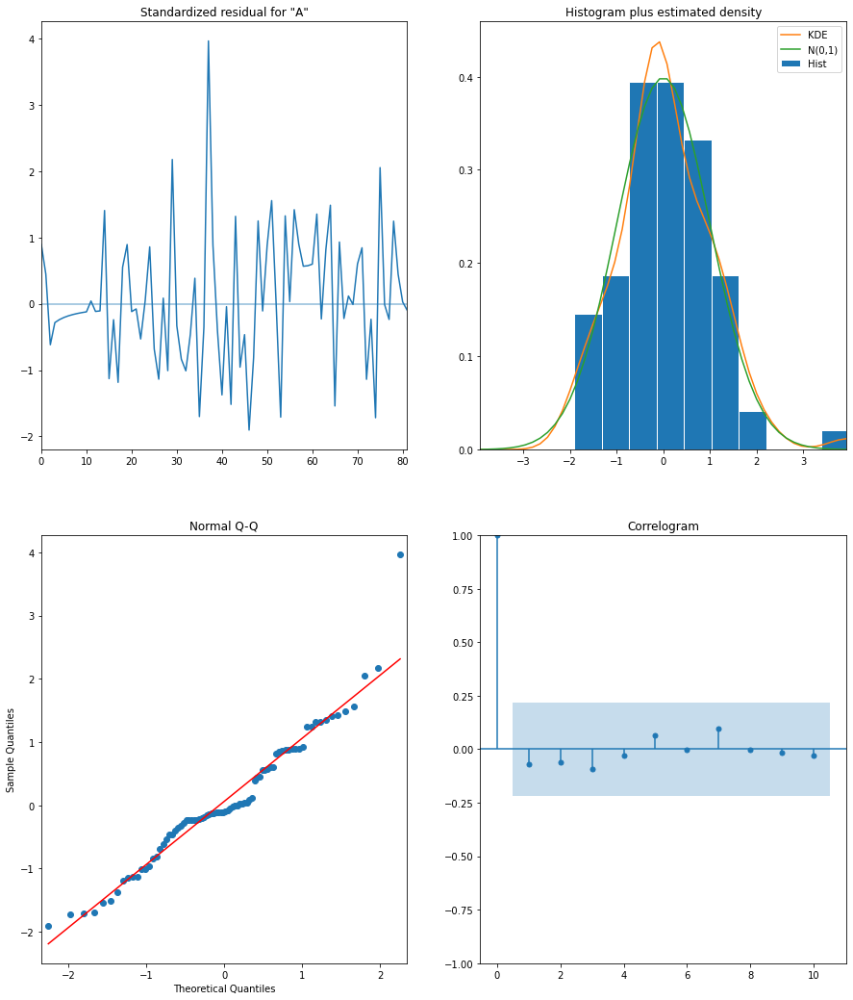

In [665]:
 AR_output = sarimax(qb_list[0], qb_list_snaps[0], qb_gs.iloc[0]['pdq'], seasonal_order=qb_gs.iloc[0]['pdqs'])

The RMSE of our forecasts is 6.31


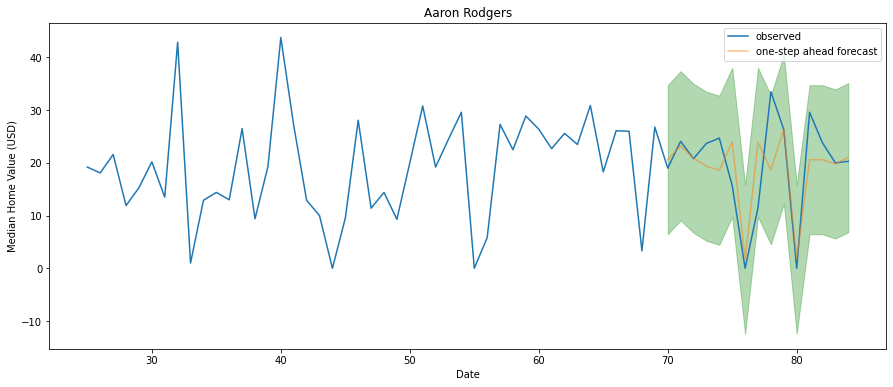

In [666]:
ose_forecast(qb_list[0], AR_output, qb_list_snaps[0][70:], player ='Aaron Rodgers')

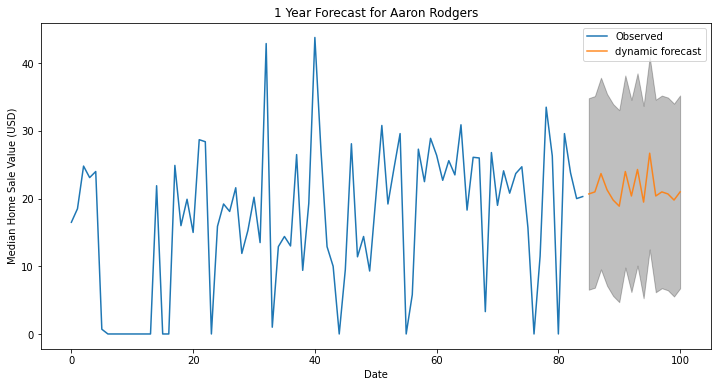

{'forecast': 85     21.0
 86     21.0
 87     24.0
 88     21.0
 89     20.0
 90     19.0
 91     24.0
 92     20.0
 93     24.0
 94     19.0
 95     27.0
 96     20.0
 97     21.0
 98     21.0
 99     20.0
 100    21.0
 Name: predicted_mean, dtype: float64,
 'total points': 343.0,
 'mean pts/g': 21.0,
 'minimum': 116.0,
 'maximum': 570.0}

In [667]:
dynamic_forecast(qb_list[0], AR_output, qb_list_snaps[0][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Aaron Rodgers', save_fig=False)

#### Baker Mayfield

                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
snaps_Baker Mayfield     0.2471      0.004     58.787      0.000       0.239       0.255
ar.L1                    0.7752      0.110      7.079      0.000       0.561       0.990
ma.L1                   -1.0000    152.846     -0.007      0.995    -300.572     298.572
sigma2                  23.7580   3631.662      0.007      0.995   -7094.168    7141.684


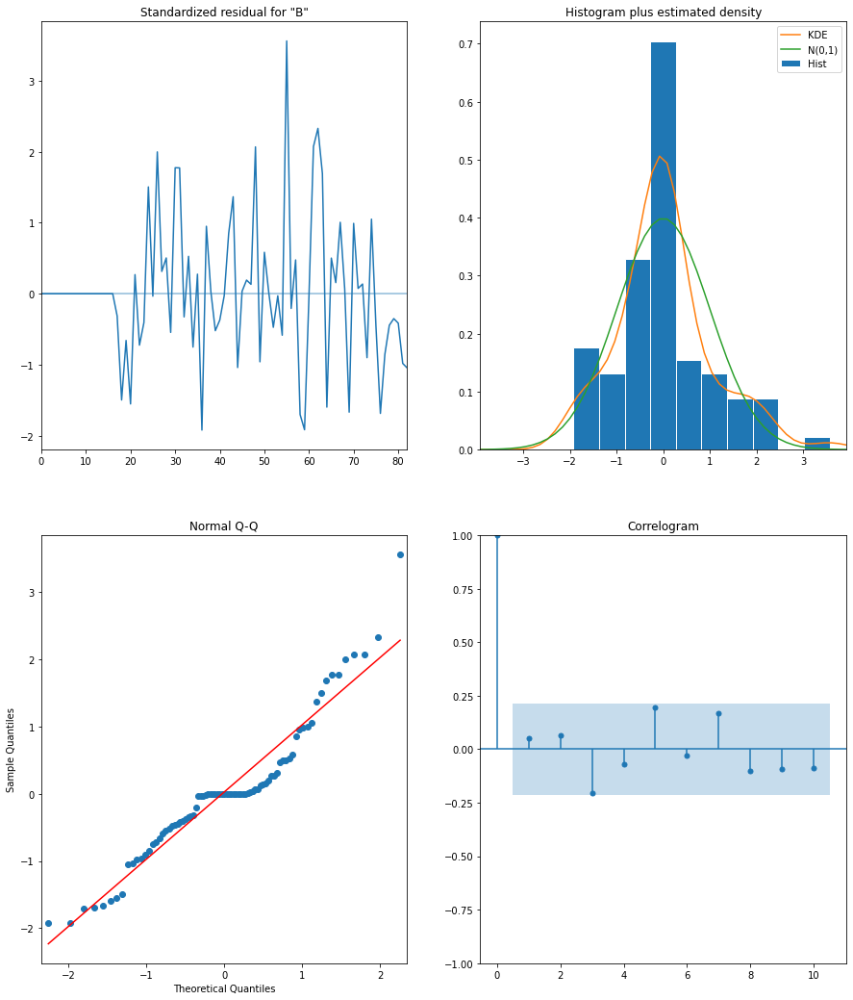

In [668]:
BM_output = sarimax(qb_list[1], qb_list_snaps[1], qb_gs.iloc[1]['pdq'], seasonal_order=qb_gs.iloc[1]['pdqs'])

The RMSE of our forecasts is 4.4


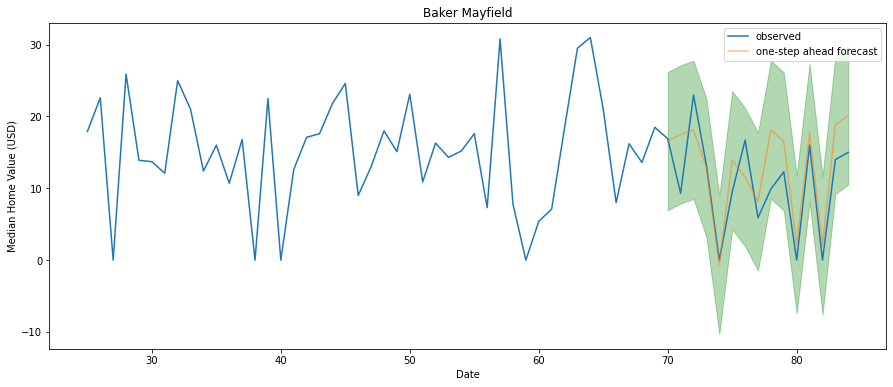

In [669]:
ose_forecast(qb_list[1], BM_output, qb_list_snaps[1][70:], player ='Baker Mayfield')

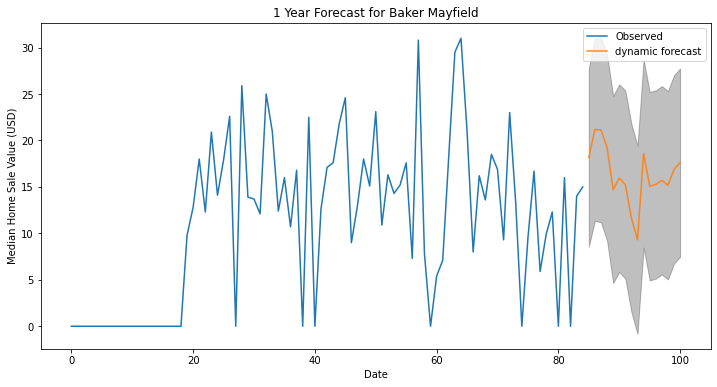

{'forecast': 85     18.0
 86     21.0
 87     21.0
 88     19.0
 89     15.0
 90     16.0
 91     15.0
 92     12.0
 93      9.0
 94     19.0
 95     15.0
 96     15.0
 97     16.0
 98     15.0
 99     17.0
 100    18.0
 Name: predicted_mean, dtype: float64,
 'total points': 261.0,
 'mean pts/g': 16.0,
 'minimum': 100.0,
 'maximum': 422.0}

In [670]:
dynamic_forecast(qb_list[1], BM_output, qb_list_snaps[1][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Baker Mayfield', save_fig=False)

#### Dak Prescott

                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
snaps_Dak Prescott     0.3003      0.059      5.108      0.000       0.185       0.416
ma.L1                 -0.9505      0.055    -17.148      0.000      -1.059      -0.842
sigma2                58.2459      8.667      6.720      0.000      41.259      75.233


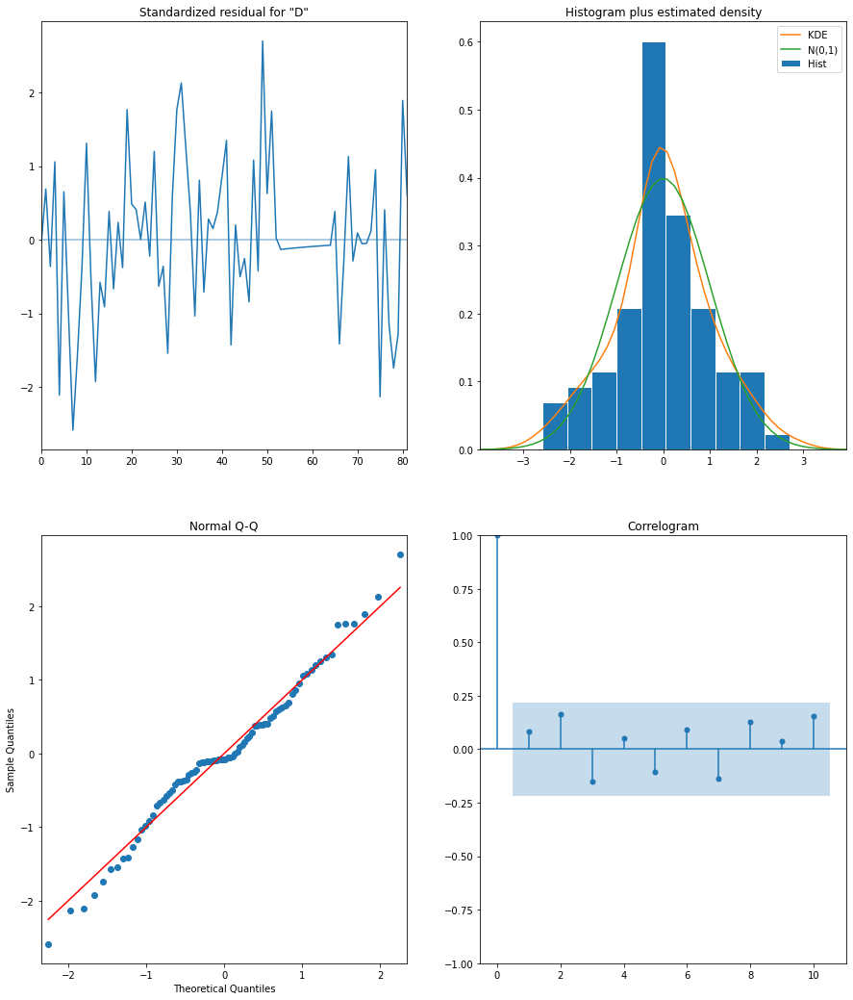

In [671]:
DP_output = sarimax(qb_list[2], qb_list_snaps[2], qb_gs.iloc[2]['pdq'], seasonal_order=qb_gs.iloc[2]['pdqs'])

The RMSE of our forecasts is 8.14


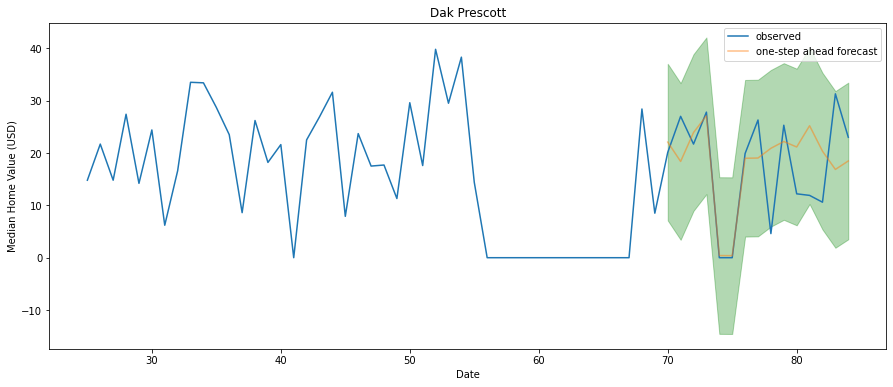

In [672]:
ose_forecast(qb_list[2], DP_output, qb_list_snaps[2][70:], player ='Dak Prescott')

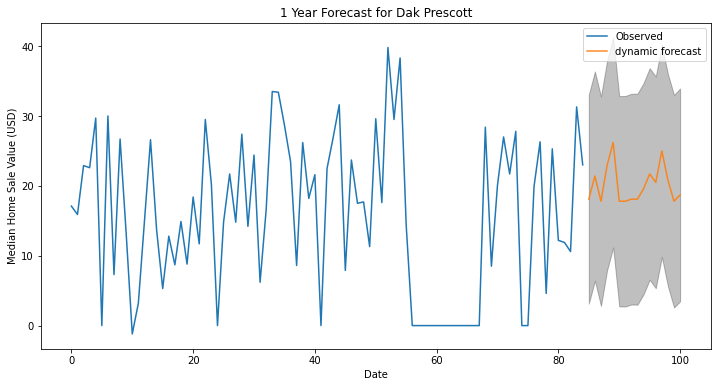

{'forecast': 85     18.0
 86     21.0
 87     18.0
 88     23.0
 89     26.0
 90     18.0
 91     18.0
 92     18.0
 93     18.0
 94     20.0
 95     22.0
 96     20.0
 97     25.0
 98     21.0
 99     18.0
 100    19.0
 Name: predicted_mean, dtype: float64,
 'total points': 322.0,
 'mean pts/g': 20.0,
 'minimum': 81.0,
 'maximum': 564.0}

In [673]:
dynamic_forecast(qb_list[2], DP_output, qb_list_snaps[2][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Dak Prescott', save_fig=False)


#### Patrick Mahomes II

                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
snaps_Patrick Mahomes II     0.3219      0.023     13.819      0.000       0.276       0.368
ar.L1                        0.1926      0.094      2.054      0.040       0.009       0.376
ma.L1                       -1.0000   1079.753     -0.001      0.999   -2117.277    2115.277
sigma2                      45.6639   4.93e+04      0.001      0.999   -9.66e+04    9.67e+04


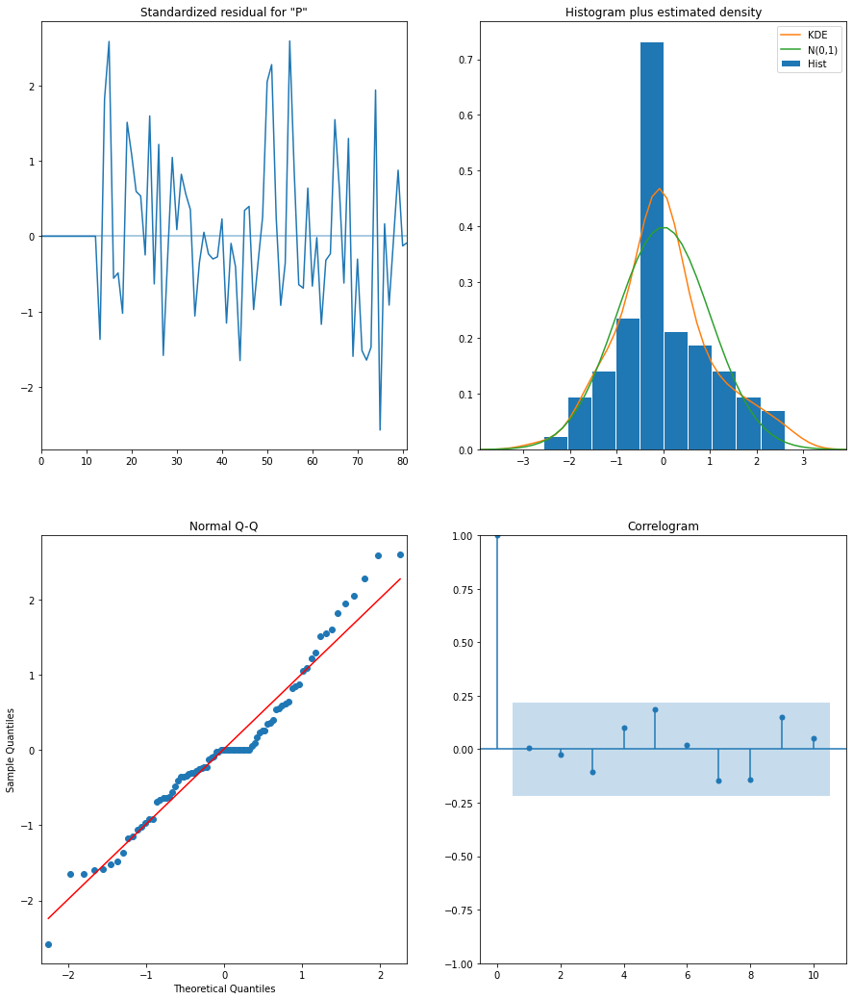

In [674]:
PM_output = sarimax(qb_list[11], qb_list_snaps[11], qb_gs.iloc[11]['pdq'], seasonal_order=qb_gs.iloc[11]['pdqs'])

The RMSE of our forecasts is 8.6


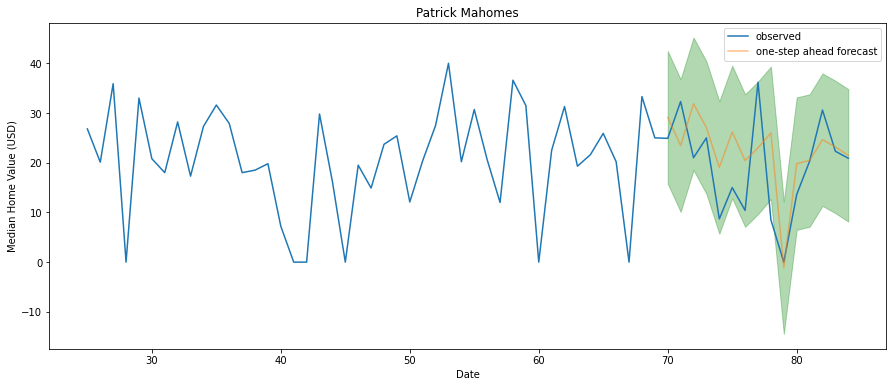

In [675]:
ose_forecast(qb_list[11], PM_output, qb_list_snaps[11][70:], player ='Patrick Mahomes')

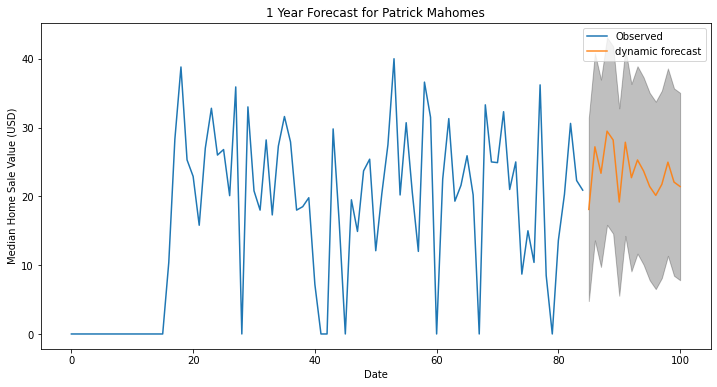

{'forecast': 85     18.0
 86     27.0
 87     23.0
 88     29.0
 89     28.0
 90     19.0
 91     28.0
 92     23.0
 93     25.0
 94     24.0
 95     21.0
 96     20.0
 97     22.0
 98     25.0
 99     22.0
 100    21.0
 Name: predicted_mean, dtype: float64,
 'total points': 377.0,
 'mean pts/g': 24.0,
 'minimum': 159.0,
 'maximum': 594.0}

In [676]:
dynamic_forecast(qb_list[11], PM_output, qb_list_snaps[11][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Patrick Mahomes', save_fig=False)


#### Josh Allen

                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
snaps_Josh Allen     0.3116      0.029     10.645      0.000       0.254       0.369
ma.L1               -0.9378      0.042    -22.344      0.000      -1.020      -0.856
sigma2              48.1732      6.348      7.588      0.000      35.730      60.616


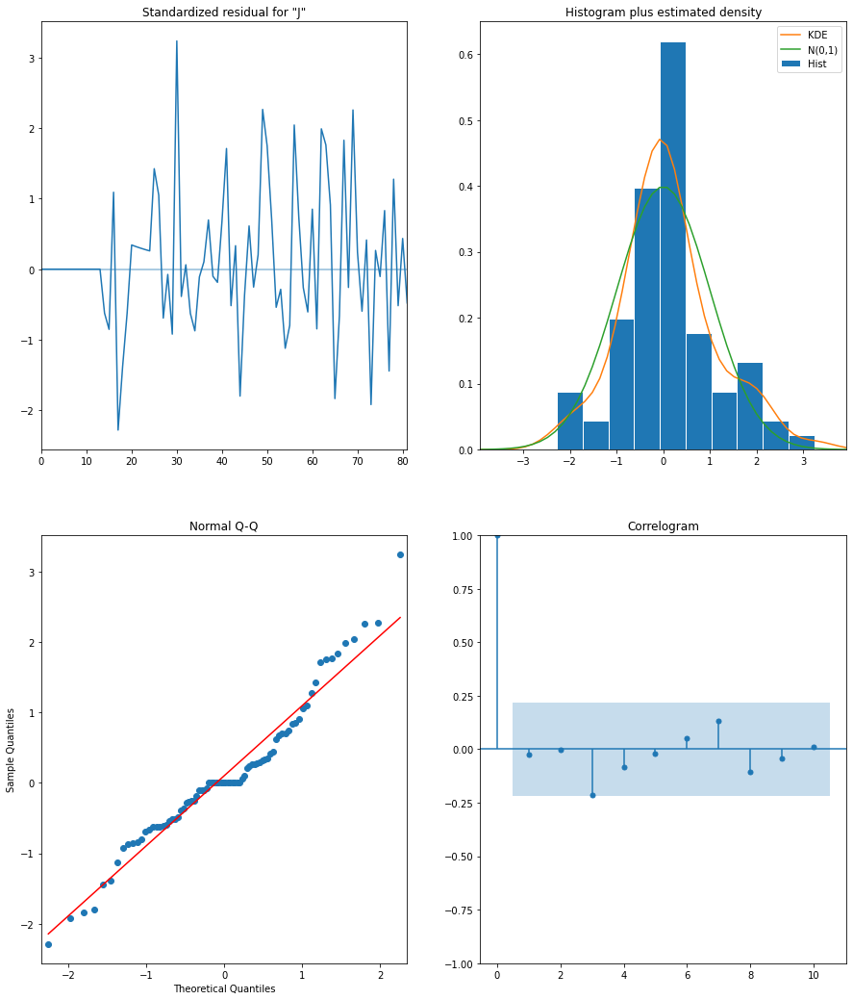

In [677]:
JA_output = sarimax(qb_list[5], qb_list_snaps[5],  qb_gs.iloc[5]['pdq'], seasonal_order=qb_gs.iloc[5]['pdqs'])

The RMSE of our forecasts is 7.6


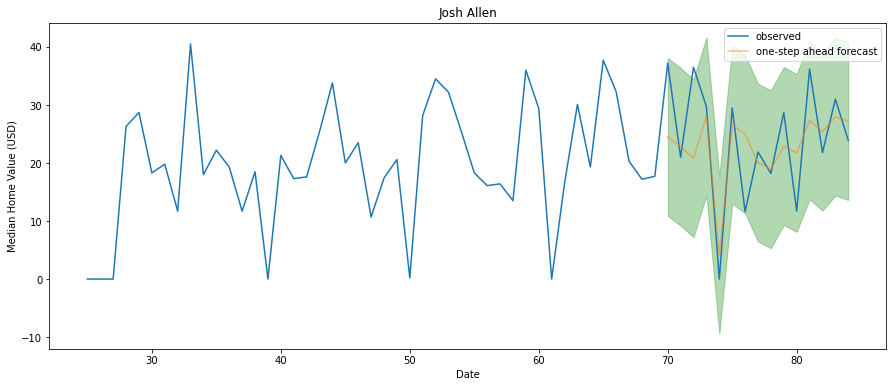

In [678]:
ose_forecast(qb_list[5], JA_output, qb_list_snaps[5][70:], player ='Josh Allen')

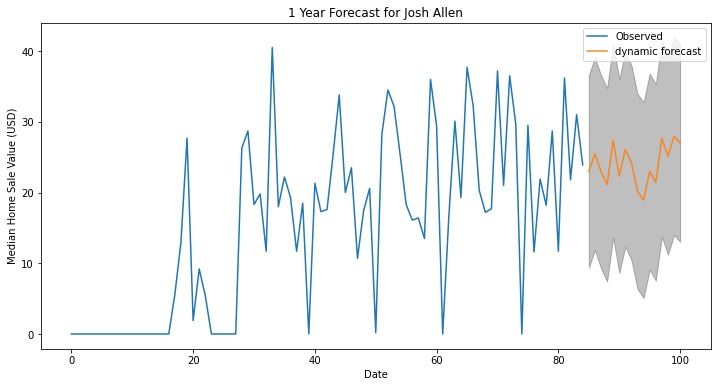

{'forecast': 85     23.0
 86     25.0
 87     23.0
 88     21.0
 89     27.0
 90     22.0
 91     26.0
 92     24.0
 93     20.0
 94     19.0
 95     23.0
 96     21.0
 97     28.0
 98     25.0
 99     28.0
 100    27.0
 Name: predicted_mean, dtype: float64,
 'total points': 384.0,
 'mean pts/g': 24.0,
 'minimum': 163.0,
 'maximum': 605.0}

In [679]:
dynamic_forecast(qb_list[5], JA_output, qb_list_snaps[5][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Josh Allen', save_fig=False)


#### Kirk Cousins

                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
snaps_Kirk Cousins     0.2924      0.060      4.855      0.000       0.174       0.410
ma.L1                 -1.0000    288.734     -0.003      0.997    -566.907     564.907
sigma2                34.7995      1e+04      0.003      0.997   -1.97e+04    1.97e+04


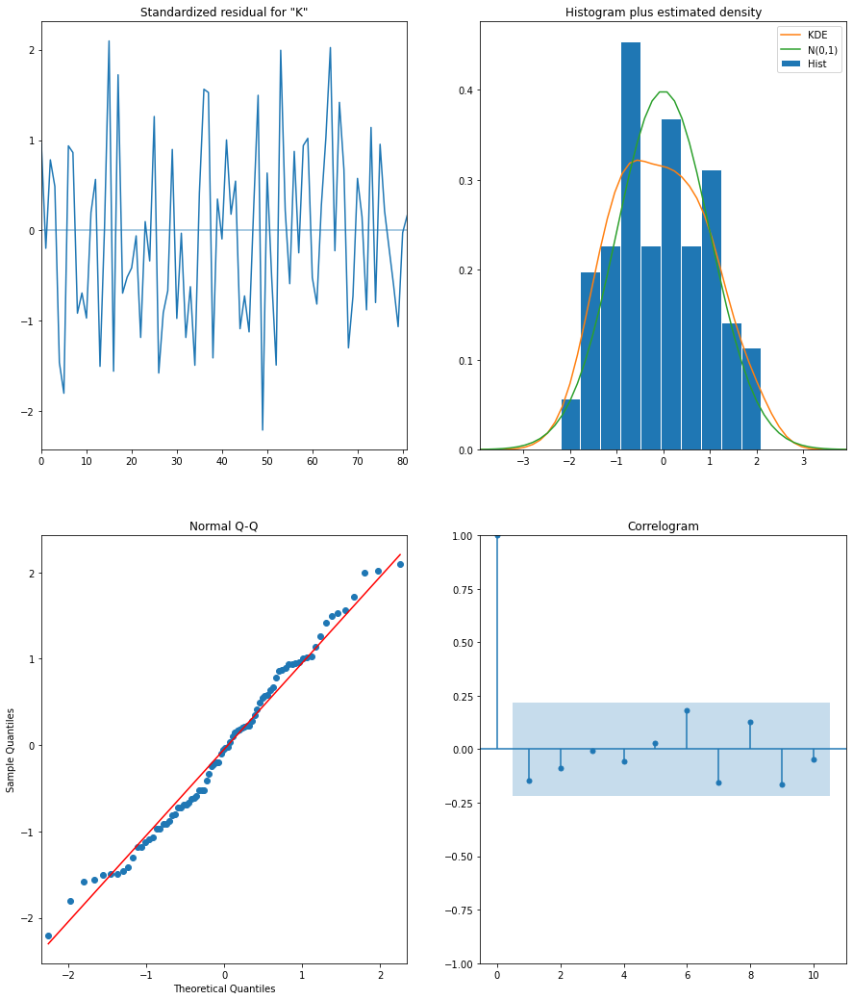

In [680]:
KC_output = sarimax(qb_list[6], qb_list_snaps[6],  qb_gs.iloc[6]['pdq'], seasonal_order=qb_gs.iloc[6]['pdqs'])

The RMSE of our forecasts is 4.4


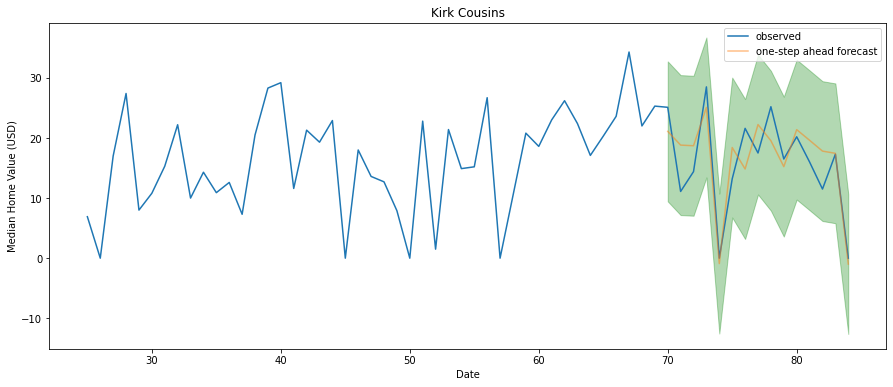

In [681]:
ose_forecast(qb_list[6], KC_output, qb_list_snaps[6][70:], player ='Kirk Cousins')

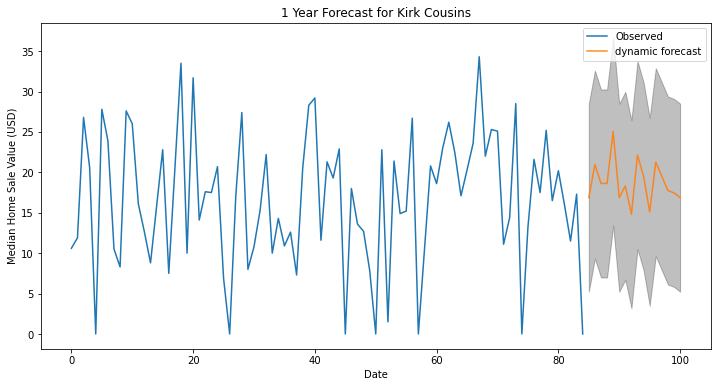

{'forecast': 85     17.0
 86     21.0
 87     19.0
 88     19.0
 89     25.0
 90     17.0
 91     18.0
 92     15.0
 93     22.0
 94     20.0
 95     15.0
 96     21.0
 97     20.0
 98     18.0
 99     17.0
 100    17.0
 Name: predicted_mean, dtype: float64,
 'total points': 300.0,
 'mean pts/g': 19.0,
 'minimum': 114.0,
 'maximum': 486.0}

In [682]:
dynamic_forecast(qb_list[6], KC_output, qb_list_snaps[6][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Kirk Cousins', save_fig=False)


#### Derrick Henry

                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
snaps_Derrick Henry     0.4341      0.132      3.284      0.001       0.175       0.693
ma.L1                  -1.0220      0.078    -13.162      0.000      -1.174      -0.870
sigma2                 89.3663     15.500      5.766      0.000      58.987     119.746


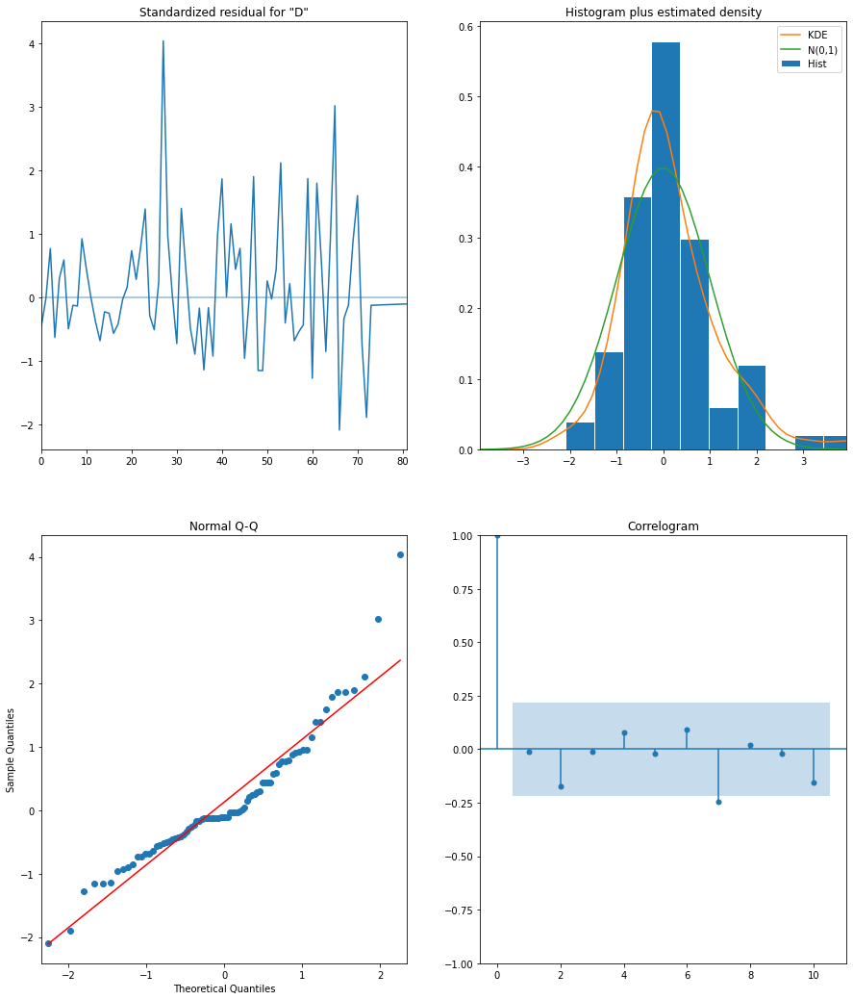

In [683]:
DH_output = sarimax(rb_list[9], rb_list_snaps[9], rb_gs.iloc[9]['pdq'], rb_gs.iloc[9]['pdqs'])

The RMSE of our forecasts is 6.93


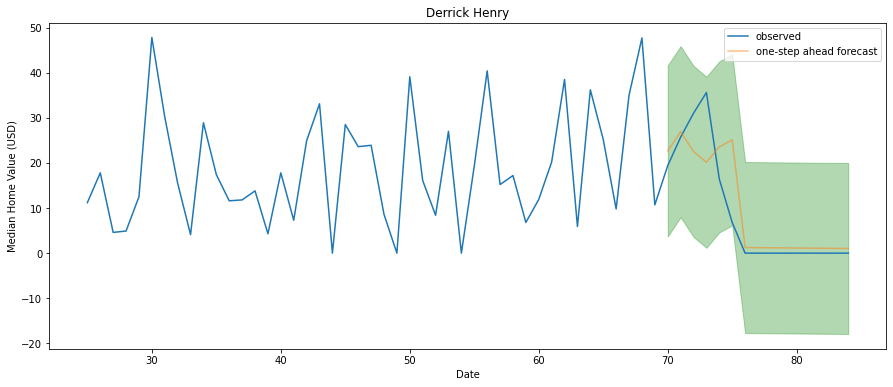

In [684]:
ose_forecast(rb_list[9], DH_output, rb_list_snaps[9][70:], player ='Derrick Henry')

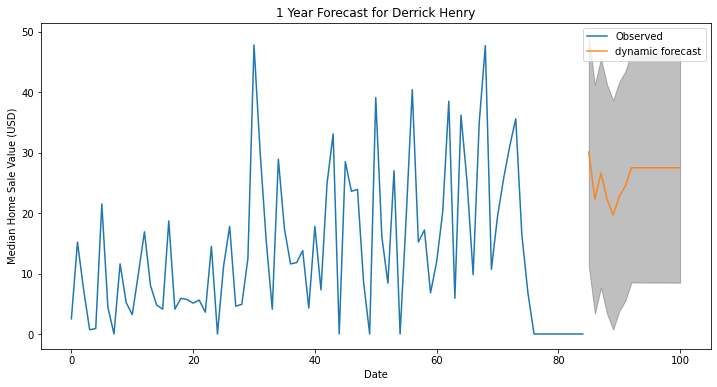

{'forecast': 85     30.0
 86     22.0
 87     27.0
 88     22.0
 89     20.0
 90     23.0
 91     24.0
 92     27.0
 93     27.0
 94     27.0
 95     27.0
 96     27.0
 97     27.0
 98     27.0
 99     27.0
 100    27.0
 Name: predicted_mean, dtype: float64,
 'total points': 416.0,
 'mean pts/g': 26.0,
 'minimum': 112.0,
 'maximum': 719.0}

In [685]:
dynamic_forecast(rb_list[9], DH_output, rb_list_snaps[9][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Derrick Henry', save_fig=False)

#### Christian McCaffrey

                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
snaps_Christian McCaffrey     0.4190      0.059      7.082      0.000       0.303       0.535
ma.L1                        -0.9147      0.036    -25.477      0.000      -0.985      -0.844
sigma2                       54.6830      5.289     10.339      0.000      44.317      65.050


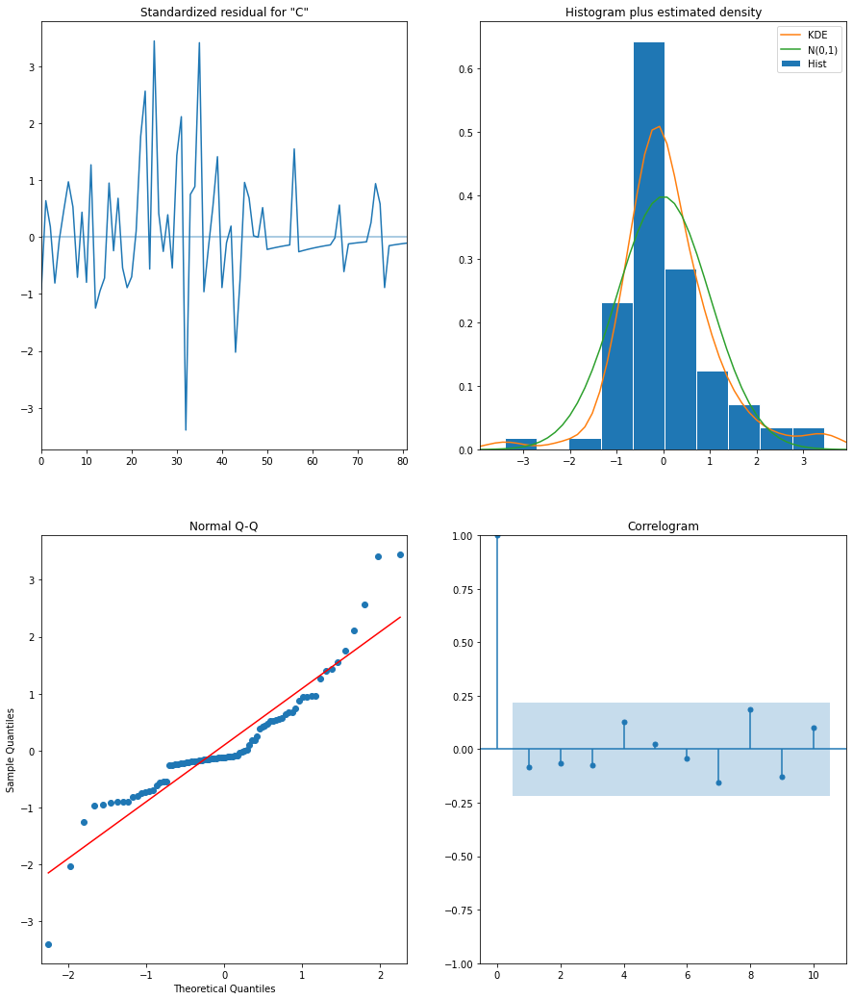

In [686]:
CM_output = sarimax(rb_list[4], rb_list_snaps[4], rb_gs.iloc[4]['pdq'], rb_gs.iloc[4]['pdqs'])

The RMSE of our forecasts is 3.07


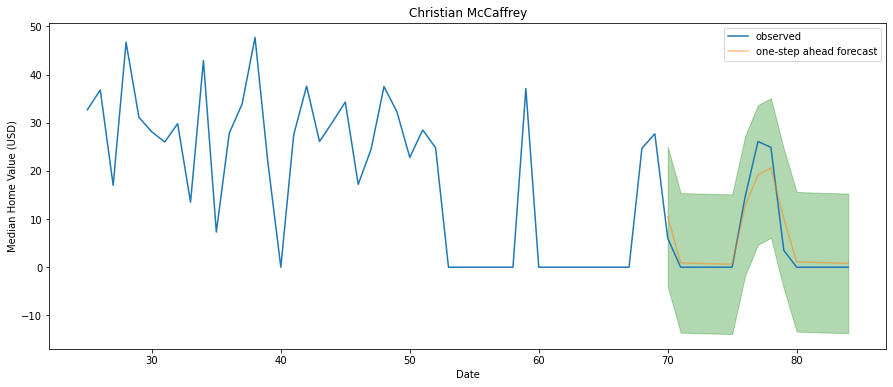

In [687]:
ose_forecast(rb_list[4], CM_output, rb_list_snaps[4][70:], player ='Christian McCaffrey')

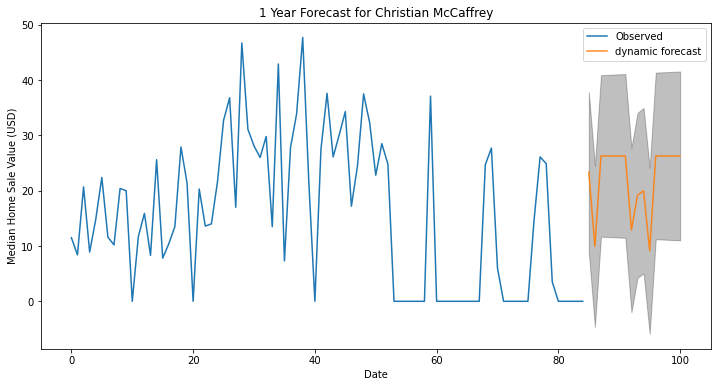

{'forecast': 85     23.0
 86     10.0
 87     26.0
 88     26.0
 89     26.0
 90     26.0
 91     26.0
 92     13.0
 93     19.0
 94     20.0
 95      9.0
 96     26.0
 97     26.0
 98     26.0
 99     26.0
 100    26.0
 Name: predicted_mean, dtype: float64,
 'total points': 357.0,
 'mean pts/g': 22.0,
 'minimum': 119.0,
 'maximum': 595.0}

In [688]:
dynamic_forecast(rb_list[4], CM_output, rb_list_snaps[4][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Christian McCaffrey', save_fig=False)


#### Alvin Kamara

                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
snaps_Alvin Kamara     0.3890      0.071      5.441      0.000       0.249       0.529
ma.L1                 -0.9466      0.063    -14.914      0.000      -1.071      -0.822
sigma2               106.8316     16.721      6.389      0.000      74.059     139.604


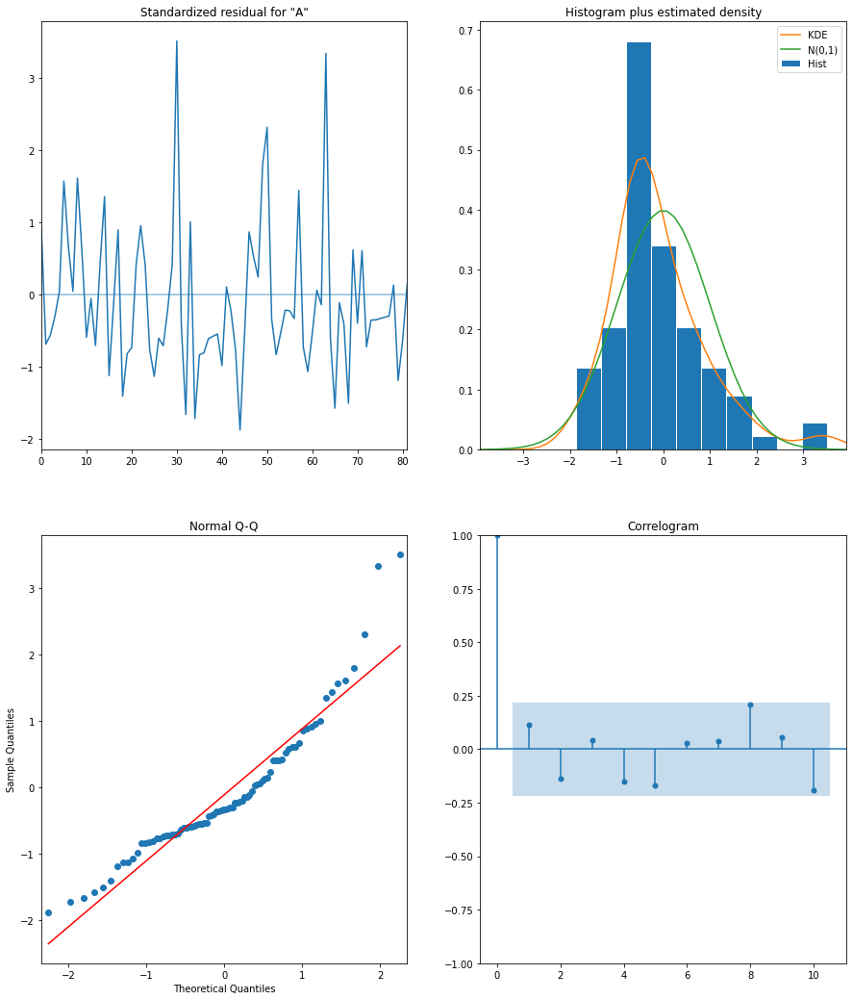

In [689]:
AK_output = sarimax(rb_list[1], rb_list_snaps[1], rb_gs.iloc[1]['pdq'], rb_gs.iloc[1]['pdqs'])

The RMSE of our forecasts is 6.67


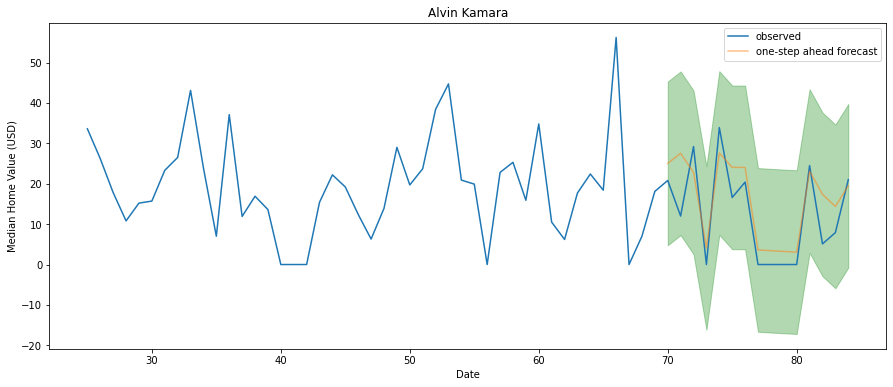

In [690]:
ose_forecast(rb_list[1], AK_output, rb_list_snaps[1][70:], player ='Alvin Kamara')

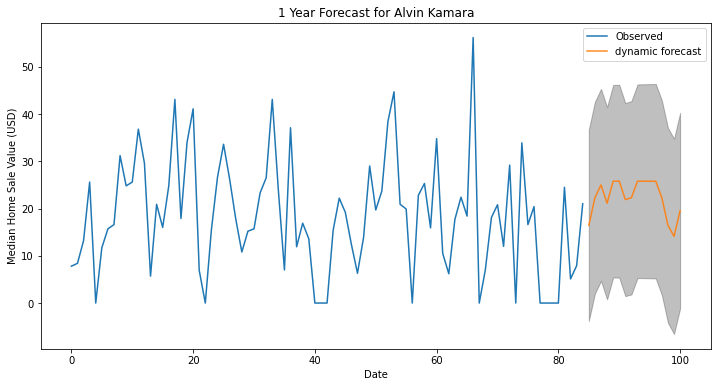

{'forecast': 85     16.0
 86     22.0
 87     25.0
 88     21.0
 89     26.0
 90     26.0
 91     22.0
 92     22.0
 93     26.0
 94     26.0
 95     26.0
 96     26.0
 97     22.0
 98     16.0
 99     14.0
 100    20.0
 Name: predicted_mean, dtype: float64,
 'total points': 356.0,
 'mean pts/g': 22.0,
 'minimum': 29.0,
 'maximum': 684.0}

In [691]:
dynamic_forecast(rb_list[1], AK_output, rb_list_snaps[1][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Alvin Kamara', save_fig=False)

#### Austin Ekeler

                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
snaps_Austin Ekeler     0.4424      0.042     10.554      0.000       0.360       0.525
ma.L1                  -1.0000    215.018     -0.005      0.996    -422.428     420.428
sigma2                 42.4134   9119.856      0.005      0.996   -1.78e+04    1.79e+04


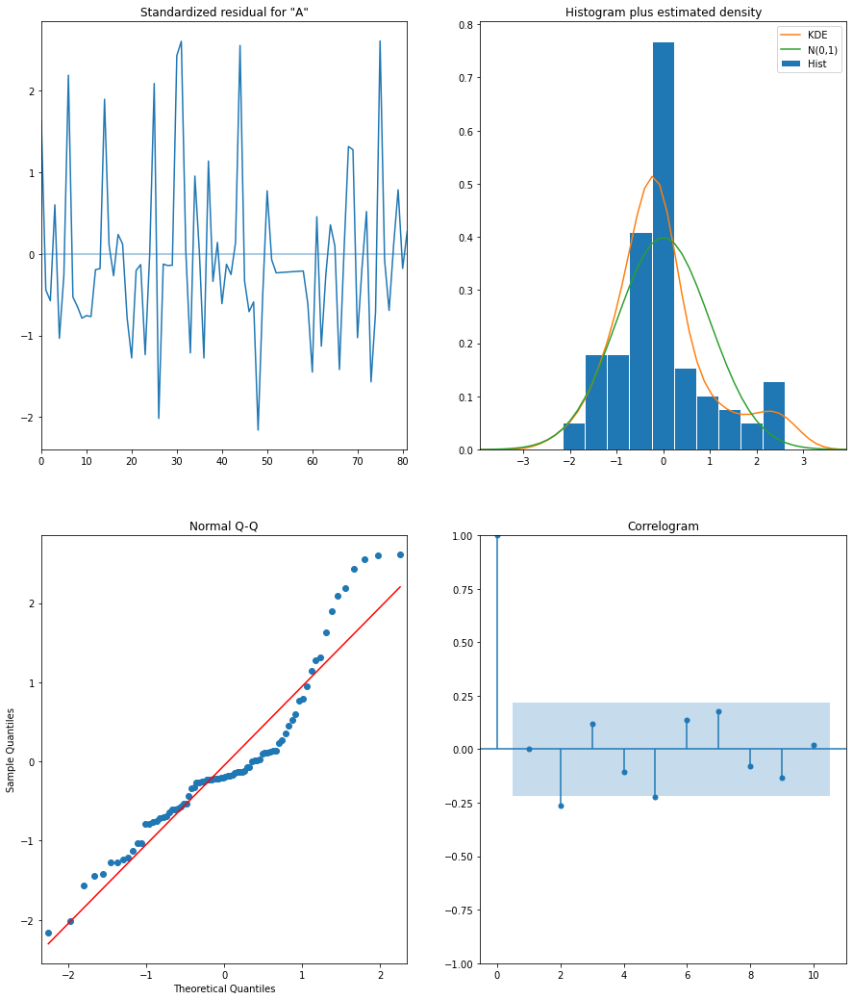

In [692]:
AE_output = sarimax(rb_list[2], rb_list_snaps[2], rb_gs.iloc[2]['pdq'], rb_gs.iloc[2]['pdqs'])

The RMSE of our forecasts is 6.71


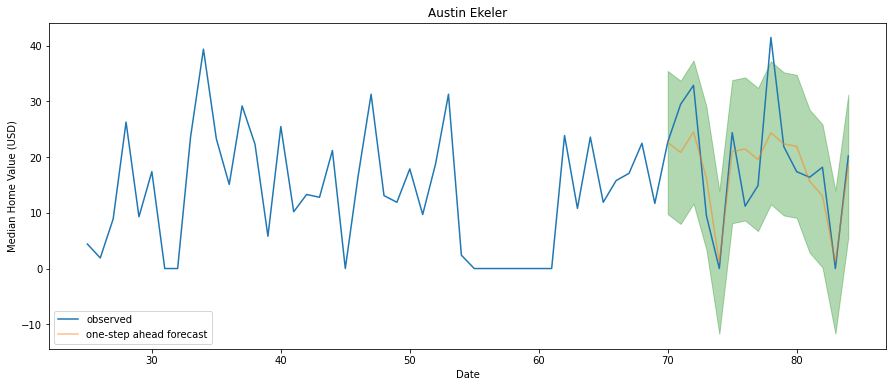

In [693]:
ose_forecast(rb_list[2], AE_output, rb_list_snaps[2][70:], player ='Austin Ekeler')

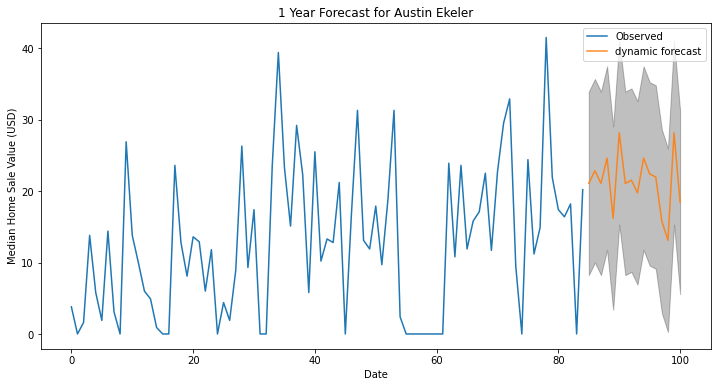

{'forecast': 85     21.0
 86     23.0
 87     21.0
 88     25.0
 89     16.0
 90     28.0
 91     21.0
 92     22.0
 93     20.0
 94     25.0
 95     22.0
 96     22.0
 97     16.0
 98     13.0
 99     28.0
 100    18.0
 Name: predicted_mean, dtype: float64,
 'total points': 341.0,
 'mean pts/g': 21.0,
 'minimum': 135.0,
 'maximum': 546.0}

In [694]:
dynamic_forecast(rb_list[2], AE_output, rb_list_snaps[2][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Austin Ekeler', save_fig=False)

#### Davante Adams

                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
snaps_Davante Adams     0.3374      0.053      6.414      0.000       0.234       0.440
ar.L1                  -0.2406      0.111     -2.173      0.030      -0.458      -0.024
ma.L1                  -0.9052      0.058    -15.507      0.000      -1.020      -0.791
sigma2                 66.8043     10.782      6.196      0.000      45.673      87.936


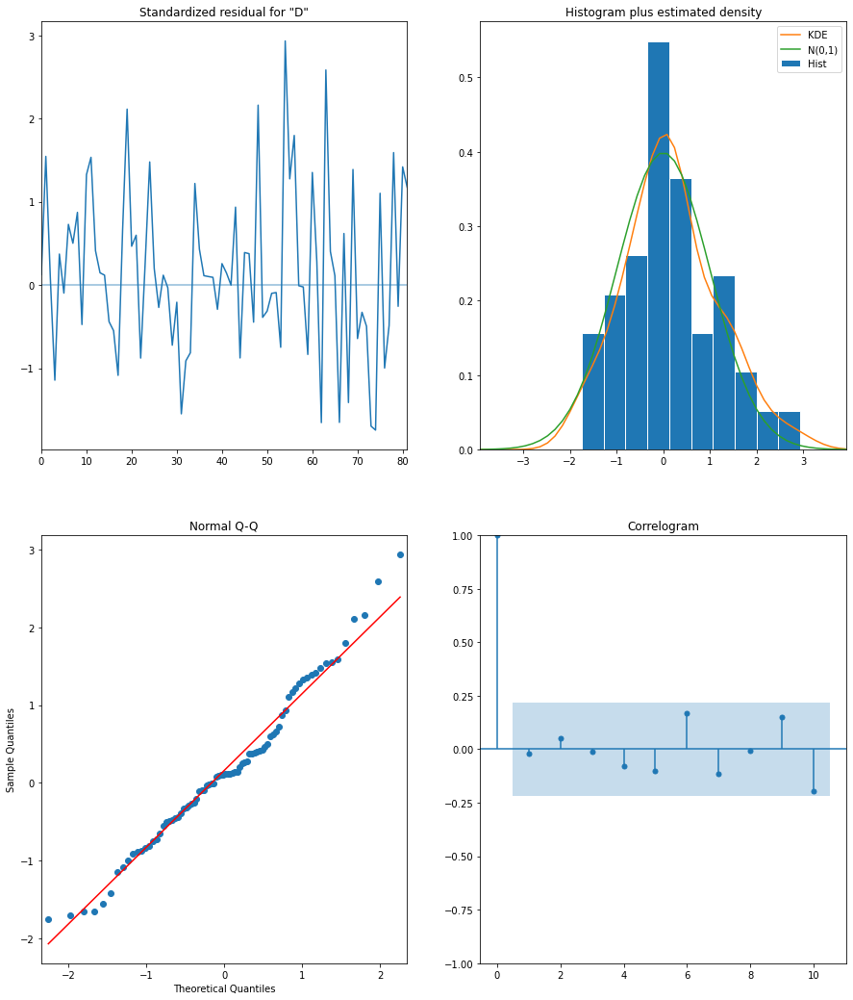

In [695]:
DA_output = sarimax(wr_list[12], wr_list_snaps[12], wr_gs.iloc[12]['pdq'], wr_gs.iloc[12]['pdqs'])

The RMSE of our forecasts is 9.3


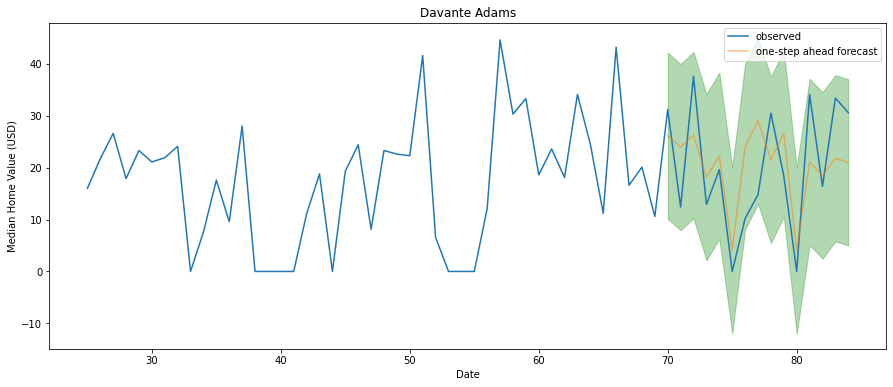

In [696]:
ose_forecast(wr_list[12], DA_output, wr_list_snaps[12][70:], player ='Davante Adams')

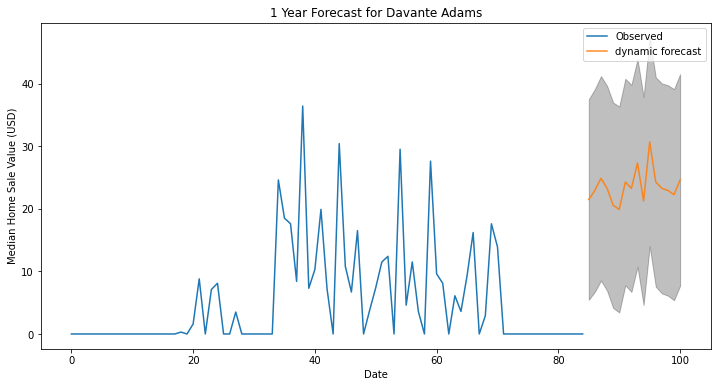

{'forecast': 85     21.0
 86     23.0
 87     25.0
 88     23.0
 89     21.0
 90     20.0
 91     24.0
 92     23.0
 93     27.0
 94     21.0
 95     31.0
 96     24.0
 97     23.0
 98     23.0
 99     22.0
 100    25.0
 Name: predicted_mean, dtype: float64,
 'total points': 377.0,
 'mean pts/g': 24.0,
 'minimum': 112.0,
 'maximum': 642.0}

In [697]:
dynamic_forecast(wr_list[9], DA_output, wr_list_snaps[12][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Davante Adams', save_fig=False)

#### Cooper Kupp

                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
snaps_Cooper Kupp     0.2574      0.052      4.953      0.000       0.156       0.359
ma.L1                -0.9131      0.058    -15.754      0.000      -1.027      -0.799
sigma2               67.1987      8.573      7.838      0.000      50.396      84.002


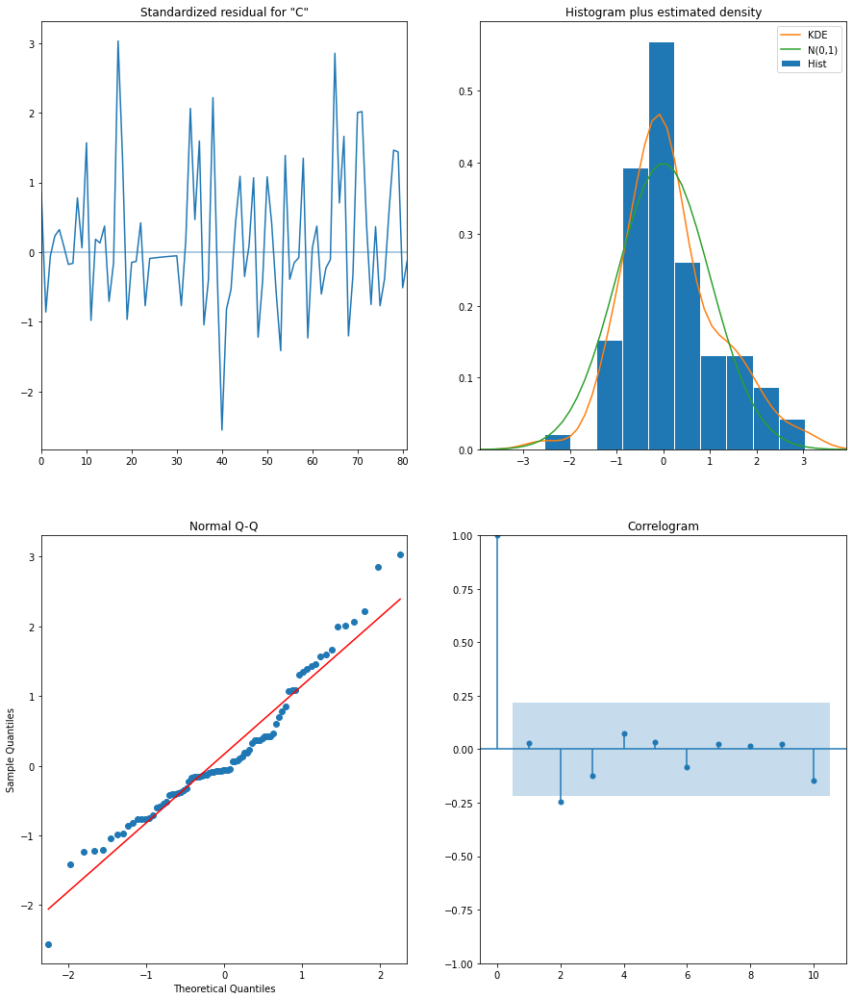

In [698]:
CK_output = sarimax(wr_list[7], wr_list_snaps[7], wr_gs.iloc[7]['pdq'], wr_gs.iloc[7]['pdqs'])

The RMSE of our forecasts is 9.18


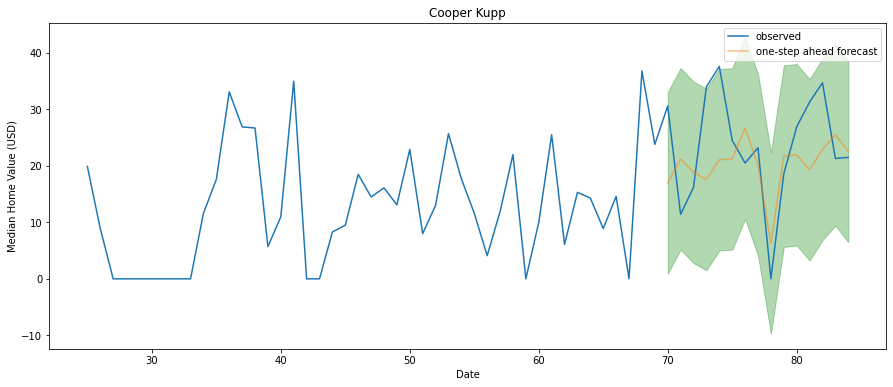

In [699]:
ose_forecast(wr_list[7], CK_output, qb_list_snaps[7][70:], player ='Cooper Kupp')

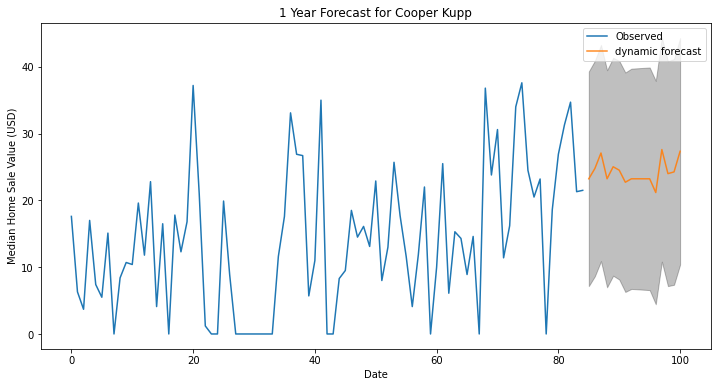

{'forecast': 85     23.0
 86     25.0
 87     27.0
 88     23.0
 89     25.0
 90     25.0
 91     23.0
 92     23.0
 93     23.0
 94     23.0
 95     23.0
 96     21.0
 97     28.0
 98     24.0
 99     24.0
 100    27.0
 Name: predicted_mean, dtype: float64,
 'total points': 388.0,
 'mean pts/g': 24.0,
 'minimum': 124.0,
 'maximum': 652.0}

In [700]:
dynamic_forecast(wr_list[7], CK_output, qb_list_snaps[7][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Cooper Kupp', save_fig=False)

#### DeAndre Hopkins

                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
snaps_DeAndre Hopkins     0.2727      0.076      3.604      0.000       0.124       0.421
ma.L1                    -1.0099      0.150     -6.721      0.000      -1.304      -0.715
sigma2                   47.5998     10.280      4.630      0.000      27.451      67.748


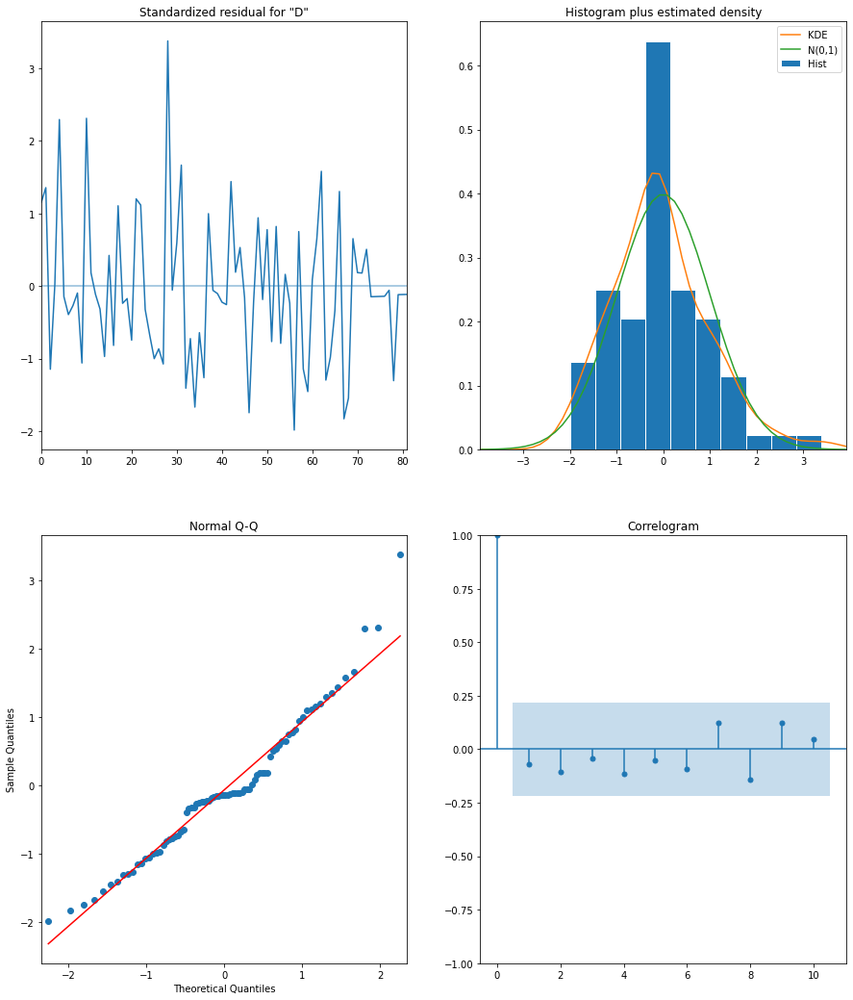

In [701]:
DH_output = sarimax(wr_list[13], wr_list_snaps[13], wr_gs.iloc[28]['pdq'], wr_gs.iloc[28]['pdqs'])

The RMSE of our forecasts is 5.2


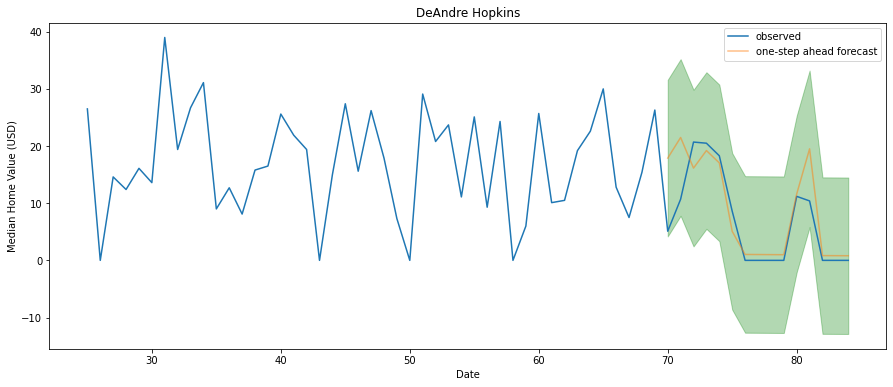

In [702]:
ose_forecast(wr_list[13], DH_output, wr_list_snaps[13][70:], player ='DeAndre Hopkins')

In [703]:
wr_list_snaps[13][-16:]

69    59.0
70    61.0
71    75.0
72    56.0
73    67.0
74    59.0
75    15.0
76     0.0
77     0.0
78     0.0
79     0.0
80    39.0
81    68.0
82     0.0
83     0.0
84     0.0
Name: snaps_DeAndre Hopkins, dtype: float64

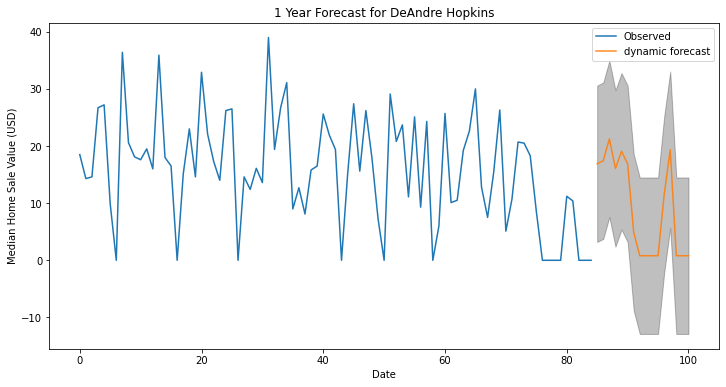

{'forecast': 85     17.0
 86     17.0
 87     21.0
 88     16.0
 89     19.0
 90     17.0
 91      5.0
 92      1.0
 93      1.0
 94      1.0
 95      1.0
 96     11.0
 97     19.0
 98      1.0
 99      1.0
 100     1.0
 Name: predicted_mean, dtype: float64,
 'total points': 149.0,
 'mean pts/g': 9.0,
 'minimum': -70.0,
 'maximum': 368.0}

In [704]:
# Keep 0s in snap count due to 6 game suspension
dynamic_forecast(wr_list[13], DH_output, wr_list_snaps[13][-16:],
                 16, player='DeAndre Hopkins', save_fig=False)


#### Tyreek Hill

                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
snaps_Tyreek Hill     0.3594      0.004     83.853      0.000       0.351       0.368
ar.L1                 0.7286      0.091      8.006      0.000       0.550       0.907
ma.L1                -1.0000    238.555     -0.004      0.997    -468.559     466.559
sigma2               97.3234   2.32e+04      0.004      0.997   -4.54e+04    4.56e+04


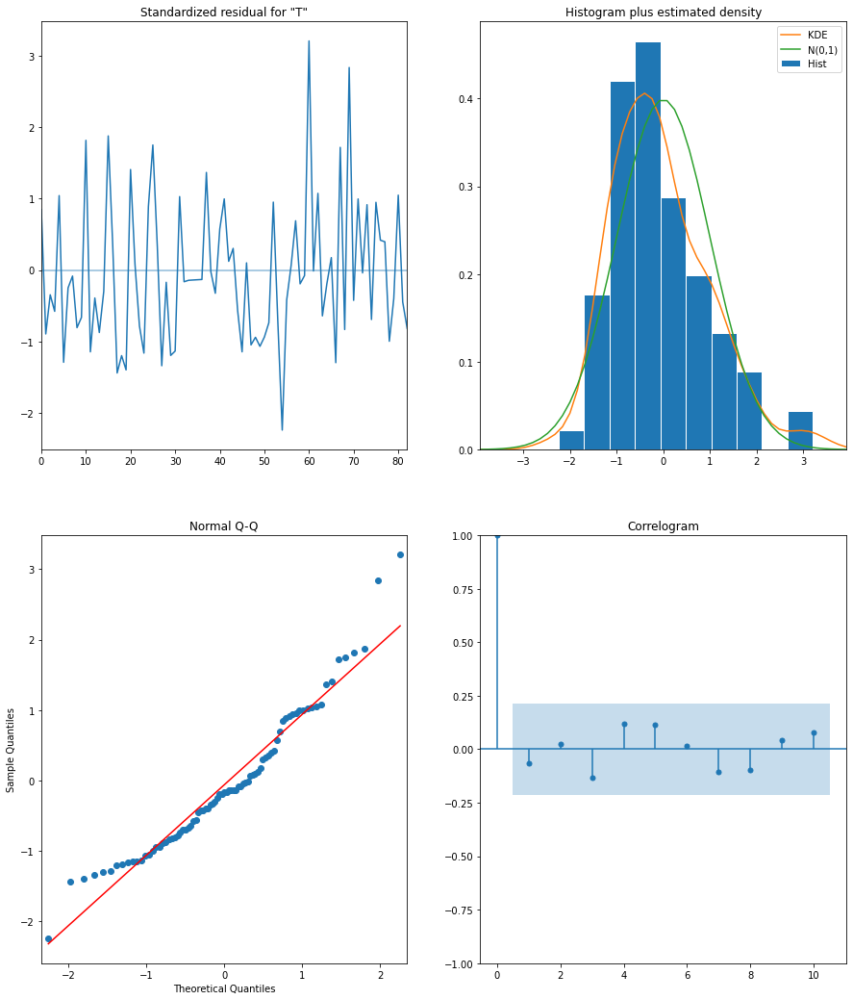

In [705]:
TH_output = sarimax(wr_list[-1], wr_list_snaps[-1], wr_gs.iloc[-1]['pdq'], wr_gs.iloc[-1]['pdqs'])

The RMSE of our forecasts is 10.12


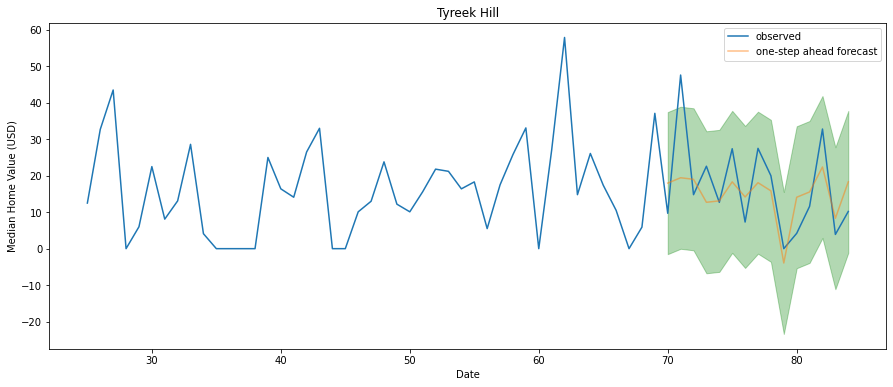

In [706]:
ose_forecast(wr_list[-1], TH_output, wr_list_snaps[-1][70:], player ='Tyreek Hill')

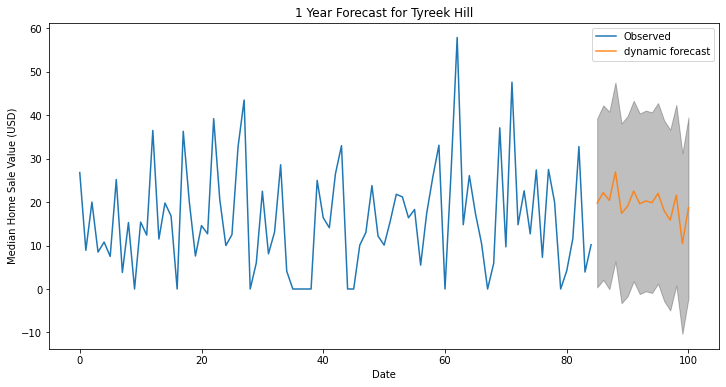

{'forecast': 85     20.0
 86     22.0
 87     20.0
 88     27.0
 89     17.0
 90     19.0
 91     23.0
 92     20.0
 93     20.0
 94     20.0
 95     22.0
 96     18.0
 97     16.0
 98     22.0
 99     10.0
 100    19.0
 Name: predicted_mean, dtype: float64,
 'total points': 315.0,
 'mean pts/g': 20.0,
 'minimum': -15.0,
 'maximum': 645.0}

In [707]:
dynamic_forecast(wr_list[-1], TH_output, wr_list_snaps[-1][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Tyreek Hill', save_fig=False)


#### Travis Kelce

In [708]:
te_list_names

['Dallas Goedert',
 'Dalton Schultz',
 'Darren Waller',
 'David Njoku',
 'Evan Engram',
 'George Kittle',
 'Gerald Everett',
 'Hunter Henry',
 'Irv Smith Jr.',
 'Mark Andrews',
 'Mike Gesicki',
 'Noah Fant',
 'T.J. Hockenson',
 'Travis Kelce',
 'Tyler Higbee',
 'Zach Ertz']

                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
snaps_Travis Kelce     0.2640      0.062      4.279      0.000       0.143       0.385
ma.L1                 -1.0000    144.601     -0.007      0.994    -284.412     282.412
sigma2                51.2469   7411.874      0.007      0.994   -1.45e+04    1.46e+04


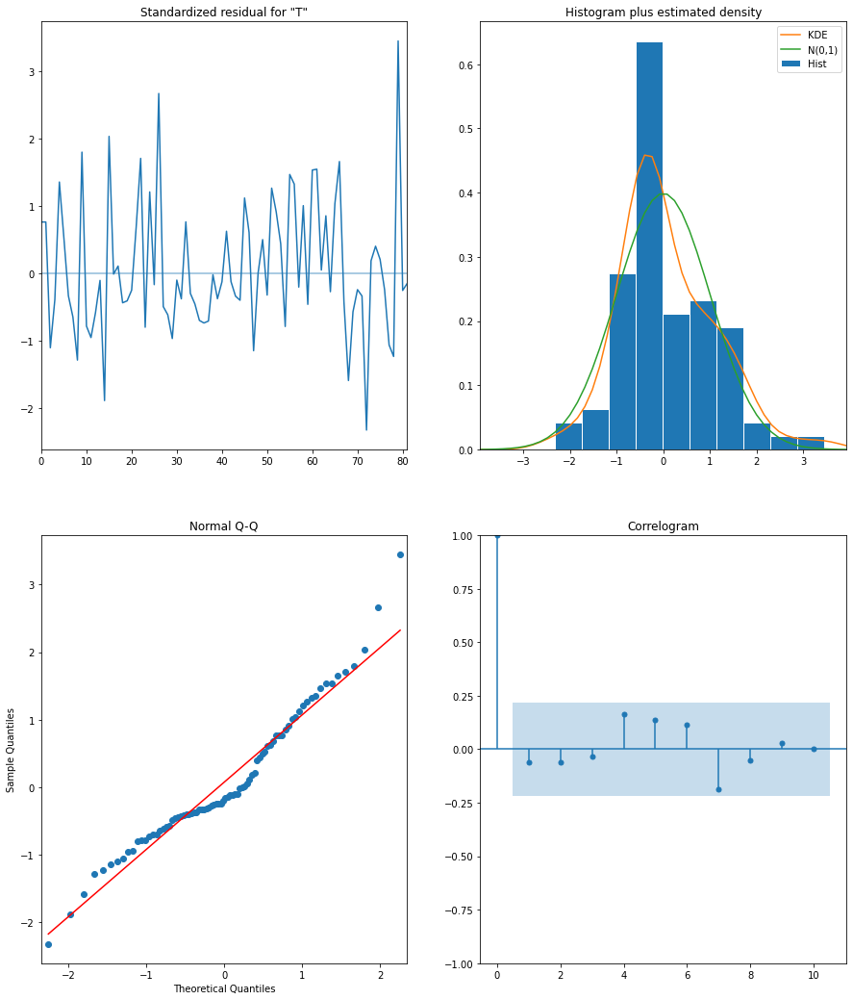

In [709]:
TK_output = sarimax(te_list[-3], te_list_snaps[-3], te_gs.iloc[-3]['pdq'], te_gs.iloc[-3]['pdqs'])


The RMSE of our forecasts is 9.01


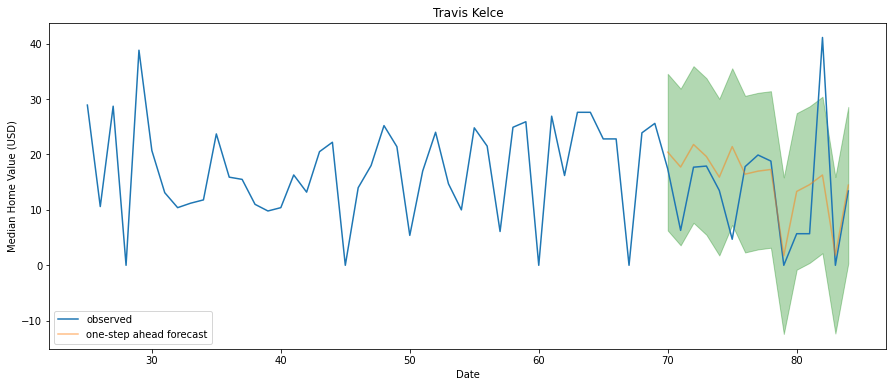

In [710]:
ose_forecast(te_list[-3], TK_output, te_list_snaps[-3][70:], player ='Travis Kelce')

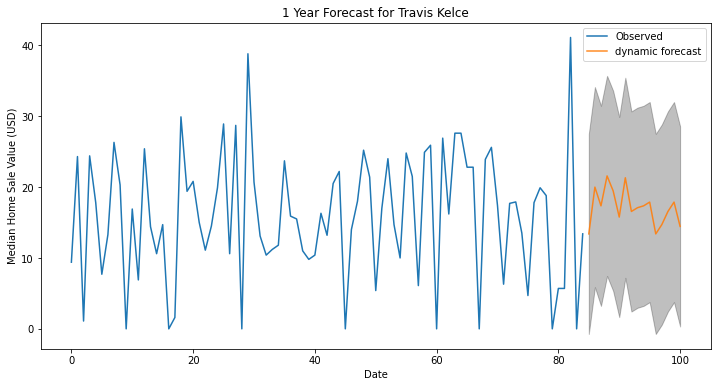

{'forecast': 85     13.0
 86     20.0
 87     17.0
 88     22.0
 89     19.0
 90     16.0
 91     21.0
 92     17.0
 93     17.0
 94     17.0
 95     18.0
 96     13.0
 97     15.0
 98     17.0
 99     18.0
 100    14.0
 Name: predicted_mean, dtype: float64,
 'total points': 275.0,
 'mean pts/g': 17.0,
 'minimum': 49.0,
 'maximum': 501.0}

In [711]:
dynamic_forecast(te_list[-3], TK_output, te_list_snaps[-3][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Travis Kelce', save_fig=False)

#### Mark Andrews

                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
snaps_Mark Andrews     0.2916      0.039      7.555      0.000       0.216       0.367
ar.L1                  0.1776      0.120      1.475      0.140      -0.058       0.414
ma.L1                 -1.0000   1776.121     -0.001      1.000   -3482.133    3480.133
sigma2                45.3616   8.06e+04      0.001      1.000   -1.58e+05    1.58e+05


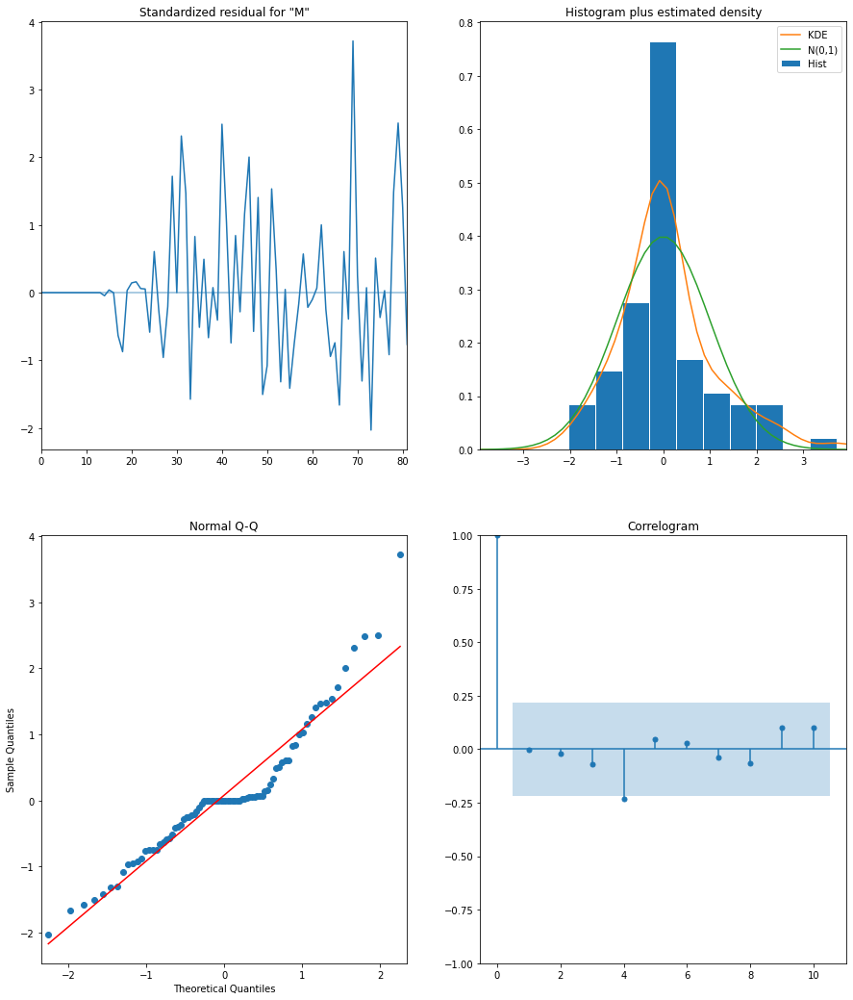

In [712]:
MA_output = sarimax(te_list[9], te_list_snaps[9], te_gs.iloc[9]['pdq'], te_gs.iloc[9]['pdqs'])

The RMSE of our forecasts is 9.93


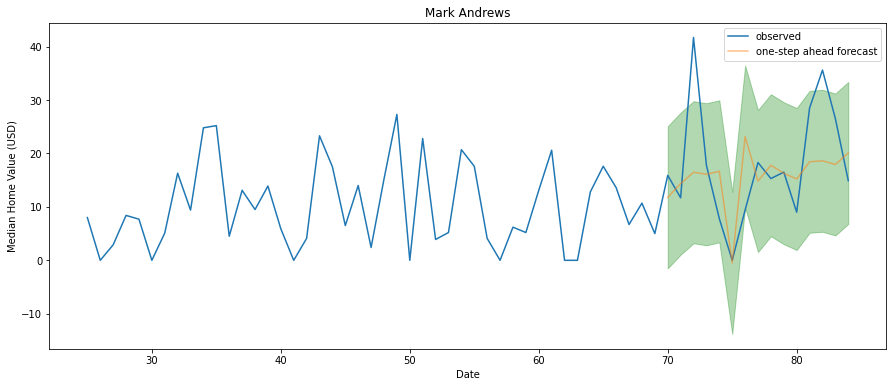

In [713]:
ose_forecast(te_list[9], MA_output, te_list_snaps[9][70:], player ='Mark Andrews')

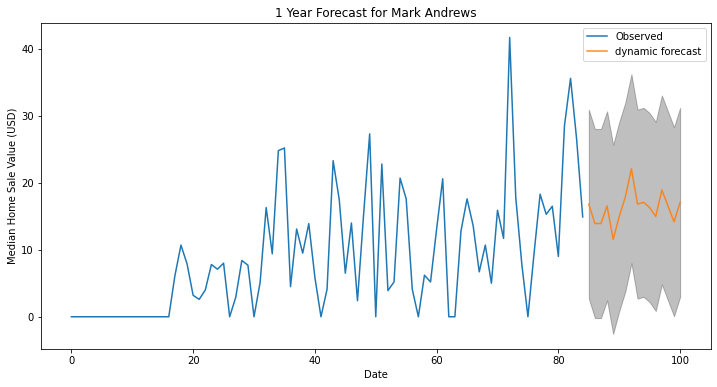

{'forecast': 85     17.0
 86     14.0
 87     14.0
 88     17.0
 89     12.0
 90     15.0
 91     18.0
 92     22.0
 93     17.0
 94     17.0
 95     16.0
 96     15.0
 97     19.0
 98     17.0
 99     14.0
 100    17.0
 Name: predicted_mean, dtype: float64,
 'total points': 260.0,
 'mean pts/g': 16.0,
 'minimum': 34.0,
 'maximum': 485.0}

In [714]:
dynamic_forecast(te_list[9], TK_output, te_list_snaps[9][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='Mark Andrews', save_fig=False)

#### George Kittle

                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
snaps_George Kittle     0.2741      0.003     89.283      0.000       0.268       0.280
ar.L1                   0.7463      0.089      8.418      0.000       0.573       0.920
ma.L1                  -1.0000    727.326     -0.001      0.999   -1426.532    1424.532
sigma2                 48.4704   3.53e+04      0.001      0.999   -6.91e+04    6.91e+04


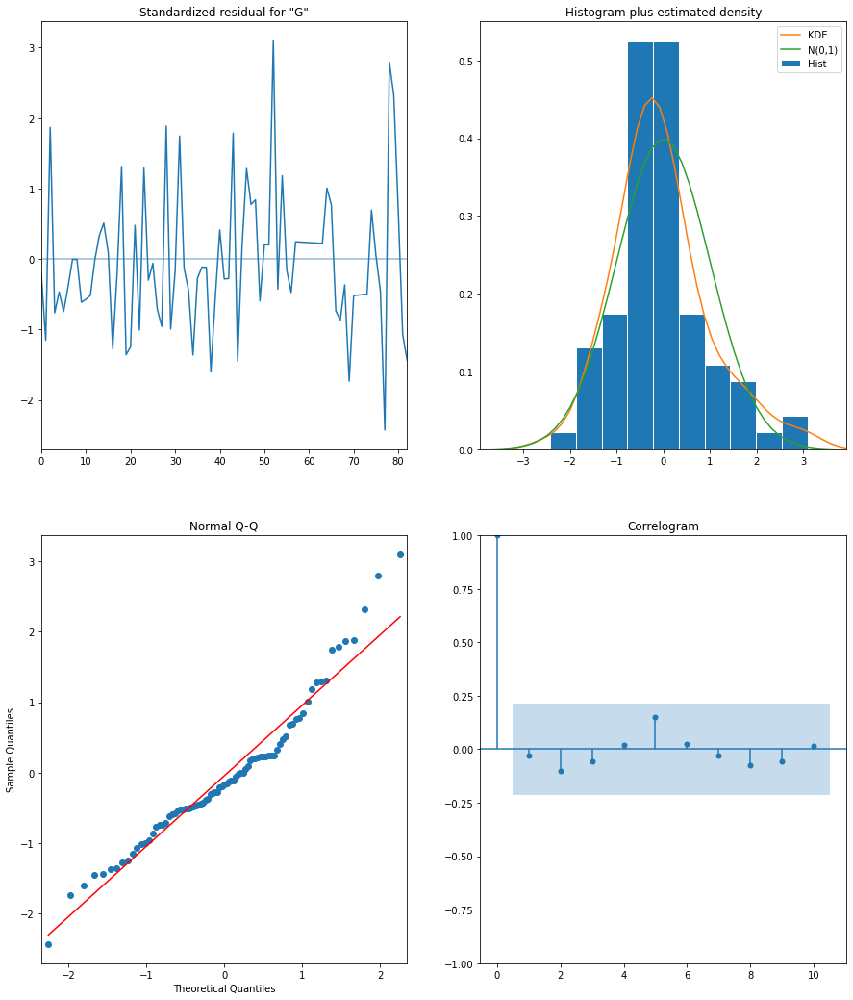

In [715]:
GK_output = sarimax(te_list[5], te_list_snaps[5], te_gs.iloc[5]['pdq'], te_gs.iloc[5]['pdqs'])

The RMSE of our forecasts is 9.52


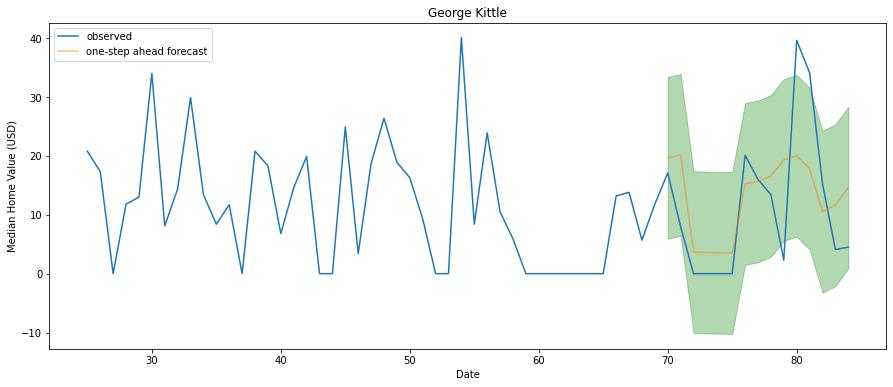

In [716]:
ose_forecast(te_list[5], GK_output, te_list_snaps[5][70:], player ='George Kittle')

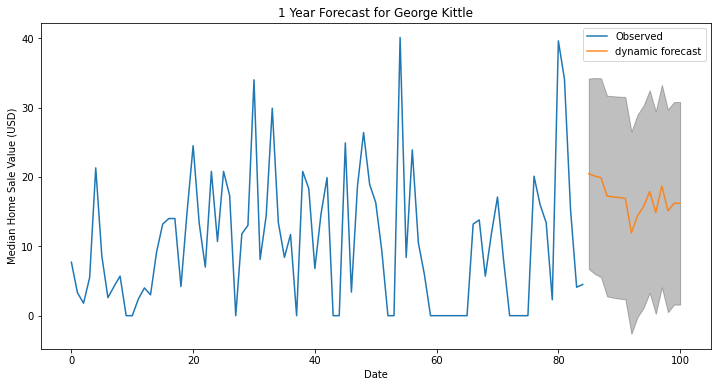

{'forecast': 85     20.0
 86     20.0
 87     20.0
 88     17.0
 89     17.0
 90     17.0
 91     17.0
 92     12.0
 93     14.0
 94     16.0
 95     18.0
 96     15.0
 97     19.0
 98     15.0
 99     16.0
 100    16.0
 Name: predicted_mean, dtype: float64,
 'total points': 270.0,
 'mean pts/g': 17.0,
 'minimum': 38.0,
 'maximum': 501.0}

In [717]:
dynamic_forecast(te_list[5], GK_output, te_list_snaps[5][-16:]
                 .replace(to_replace = 0, value = 61),
                 16, player='George Kittle', save_fig=False)

## Facebook Prophet Modeling

In [95]:
qb_fb_list = []
for col in qb_ts.columns:
    player = qb_ts[col].squeeze()
    qb_fb_list.append(player)

qb_fb_list[0]

0     16.5
1     18.5
2     24.8
3     23.1
4     24.0
      ... 
80     0.0
81    29.6
82    23.8
83    20.0
84    20.3
Name: Aaron Rodgers, Length: 85, dtype: float64

In [96]:
# Set the uncertainty interval to 95% (the Prophet default is 80%)
Model = proph(interval_width=0.95)

In [97]:
# Rename the columns [Month, AirPassengers] to [ds, y]
qb_fb_list[0] = qb_fb_list[0].reset_index().rename(columns={'Date': 'ds',
                                                     'Aaron Rodgers': 'y'})
qb_fb_list[0]

,index,y
0,0,16.5
1,1,18.5
2,2,24.8
3,3,23.1
4,4,24.0
...,...,...
80,80,0.0
81,81,29.6
82,82,23.8
83,83,20.0


In [98]:
bye = [6, 23, 44, 55, 76]
qb_fb_list[0] = qb_fb_list[0].drop(bye).fillna(0)
qb_fb_list[0]

,index,y
0,0,16.5
1,1,18.5
2,2,24.8
3,3,23.1
4,4,24.0
...,...,...
80,80,0.0
81,81,29.6
82,82,23.8
83,83,20.0


In [99]:
# Fit the timeseries to Model
Model.fit(qb_fb_list[0])

ValueError: Dataframe must have columns "ds" and "y" with the dates and values respectively.

In [ ]:
# Use make_future_dataframe() with a monthly frequency and periods = 36 for 3 years
future_dates = Model.make_future_dataframe(periods=16, freq='W')
future_dates.head()

In [ ]:
# Predict the values for future dates and take the head of forecast
forecast = Model.predict(future_dates)
forecast.head()

In [ ]:
# Use Prophet's plot method to plot the predictions
Model.plot(forecast, uncertainty=True)
plt.show()

In [ ]:
m = proph()
m.fit(qb_fb_list[0])

#%% Forecast 1 year
weeks = 16
future = m.make_future_dataframe(periods=weeks)
future.tail()

fig1 = m.plot(forecast)
plt.close()
fig2 = m.plot_components(forecast)


## Interpret Results

### Projections for 2022 Season

I am now going to make a dataframe that will contain our projected metrics based upon our sarimax model forecasting.

In [718]:
# Function to prepare time series, perform gridsearch, and project 2022 season points with optimal model parameters.
def projections(ts, exog_ts):
    '''
    Calculate projections for player:
        - Total projected points for 2022 season
        - Minimum projected points for 2022 season
        - Maximum projected points for 2022 season
        
    Input:
        ts : time series data.
        exog_ts : exogenous time series data (player snaps).
        
    Output:
        Returns dataframe with:
        - Player name
        - Projected points
        - Minimum projected points
        - Maximum projected points
    '''
    
    ### Create list of time series data ###
    
    # List of time series of player fantasy points
    player_list = []
    for col in ts.columns:
        player_name = ts[col].squeeze()
        player_list.append(player_name)
    
    # List of player names
    player_list_names = []
    for col in ts.columns:
        player_name = col
        player_list_names.append(player_name)    
            
    # List of time series of player snaps
    player_list_snaps = []
    for col in exog_ts.columns:
        player_name = exog_ts[col].squeeze()
        player_list_snaps.append(player_name)
        
        ### Gridsearch for optimal pdq, pdqs parameters ###
        
        # Define the p, d and q parameters to take any value between 0 and 2
        p = d = q = range(0, 2)
        # Generate all different combinations of p, q and q triplets
        pdq = list(itertools.product(p, d, q))
        # Generate all different combinations of seasonal p, q and q triplets
        pdqs = [(x[0], x[1], x[2], 0) for x in list(itertools.product(p, d, q))]
    
        # Run a grid with pdq and seasonal pdq parameters calculated above and get the best AIC value
        ans = []
        for df, name, snaps in zip(player_list, player_list_names, player_list_snaps):
            for comb in pdq:
                for combs in pdqs:
                    try:
                        mod = sm.tsa.statespace.SARIMAX(df,
                                                        exog=snaps,
                                                        order=comb,
                                                        seasonal_order=combs,
                                                        enforce_stationarity=False,
                                                        enforce_invertibility=False)

                        output = mod.fit()
                        ans.append([name, comb, combs, output.aic])
                    except:
                        continue

        # Find the parameters with minimal AIC value
        ans_df = pd.DataFrame(ans, columns=['name', 'pdq', 'pdqs', 'aic'])
        best_para = ans_df.loc[ans_df.groupby("name")["aic"].idxmin()]
        
        ### Optimal parameters model for projections ###
        
        # Create list to append projection metrics
        projections = []
        
        # Iterate through time series of each player
        for df, name, snaps, pdq, pdqs in zip(player_list, player_list_names, player_list_snaps, best_para['pdq'], best_para['pdqs']):
            try:                      
               
                # Plug the optimal parameter values into a new SARIMAX model
                SARIMAX = sm.tsa.statespace.SARIMAX(df,
                                                    exog=snaps,
                                                    order=pdq,
                                                    seasonal_order=pdqs,
                                                    enforce_stationarity=False,
                                                    enforce_invertibility=False)
                
                # Fit the model and print results
                output = SARIMAX.fit()
 
                # Get forecast and confidence interval for 16 games ahead in future
                forecast = output.get_forecast(steps=16, exog=snaps[-16:].replace(to_replace = 0, value = 61), dynamic=True)
                conf_int = forecast.conf_int()

                # Show prediction for end of step-period
                pred_mean = forecast.predicted_mean.sum()
                pred_mean_min = conf_int.iloc[:,0].sum()
                pred_mean_max = conf_int.iloc[:,1].sum()
        
                ### Create DataFrame ###
        
                # Initiate empty dictionary
                predicted = {}

                # Columns for df
                predicted['Player'] = name
                predicted['Projected Points'] = pred_mean.round(0)
                predicted['Min Projected Points'] = pred_mean_min.round(0)
                predicted['Max Projected Points'] = pred_mean_max.round(0)
                
                # Append to list
                projections.append(predicted)
            except:
                continue
        
    # Return in DataFrame format     
    return pd.DataFrame(projections)

In [719]:
# 2022 Quarterback projections
qb_2022_projections = projections(qb_ts, qb_snap_ts)
qb_2022_projections = qb_2022_projections.sort_values('Projected Points', ascending=False)
qb_2022_projections

,Player,Projected Points,Min Projected Points,Max Projected Points
5,Josh Allen,384.0,163.0,605.0
11,Patrick Mahomes II,377.0,159.0,594.0
0,Aaron Rodgers,343.0,116.0,570.0
7,Kyler Murray,342.0,171.0,513.0
14,Tom Brady,336.0,87.0,585.0
2,Dak Prescott,322.0,81.0,564.0
6,Kirk Cousins,300.0,114.0,486.0
12,Russell Wilson,290.0,82.0,499.0
10,Matthew Stafford,285.0,82.0,488.0
8,Lamar Jackson,280.0,30.0,529.0


In [720]:
# 2022 Running back projections
rb_2022_projections = projections(rb_ts, rb_snap_ts)
rb_2022_projections = rb_2022_projections.sort_values('Projected Points', ascending=False)
rb_2022_projections

,Player,Projected Points,Min Projected Points,Max Projected Points
9,Derrick Henry,416.0,112.0,719.0
4,Christian McCaffrey,357.0,119.0,595.0
1,Alvin Kamara,356.0,29.0,684.0
2,Austin Ekeler,341.0,135.0,546.0
6,Dalvin Cook,297.0,61.0,534.0
0,Aaron Jones,290.0,8.0,572.0
23,Nick Chubb,284.0,66.0,501.0
17,Kareem Hunt,283.0,70.0,497.0
15,Joe Mixon,277.0,93.0,460.0
8,David Montgomery,272.0,108.0,436.0


In [721]:
# 2022 Wide receiver projections
wr_2022_projections = projections(wr_ts, wr_snap_ts)

# Replace DeAndre Hopkins forecast due to 6 game suspension with forecast calculated above
wr_2022_projections['Projected Points'] = wr_2022_projections['Projected Points'].replace(to_replace = 265.0, value = 149.0)

# Sort by highest projected points
wr_2022_projections = wr_2022_projections.sort_values('Projected Points', ascending=False)
wr_2022_projections

,Player,Projected Points,Min Projected Points,Max Projected Points
12,Davante Adams,377.0,112.0,642.0
7,Cooper Kupp,371.0,106.0,635.0
38,Tyreek Hill,315.0,-15.0,645.0
15,Diontae Johnson,282.0,129.0,435.0
21,Keenan Allen,277.0,45.0,509.0
34,Stefon Diggs,262.0,13.0,510.0
28,Mike Evans,257.0,-18.0,531.0
5,Chris Godwin,253.0,21.0,485.0
1,Adam Thielen,249.0,22.0,476.0
31,Robert Woods,248.0,43.0,452.0


In [722]:
# 2022 Tight end projections
te_2022_projections = projections(te_ts, te_snap_ts)
te_2022_projections = te_2022_projections.sort_values('Projected Points', ascending=False)
te_2022_projections

,Player,Projected Points,Min Projected Points,Max Projected Points
13,Travis Kelce,275.0,49.0,501.0
9,Mark Andrews,271.0,55.0,487.0
5,George Kittle,270.0,38.0,501.0
2,Darren Waller,229.0,57.0,401.0
12,T.J. Hockenson,185.0,51.0,319.0
0,Dallas Goedert,167.0,19.0,316.0
10,Mike Gesicki,165.0,-11.0,341.0
15,Zach Ertz,160.0,-63.0,384.0
11,Noah Fant,157.0,18.0,296.0
14,Tyler Higbee,155.0,-27.0,336.0


### Barplots of 2022 Season Projections and Errors

In [833]:
# Barplot for 2022 point projection with 95% confidence intervals
def projection_barplot(df, position = '', save_fig=False):
    '''
    Plots barplot of projected fantasy points and errors
    
    Inputs: 
        df : Time series data.
        position : 'Quarterback', 'Running Back', 'Wide Receiver', 'Tight End' 
        save_fig : True or False
            
    Outputs:
        Returns : Barplot of projected fantasy points and 95% confidence interval
    '''
    # Get errors; (pred mean - lower bound of conf interval)
    errors = df['Projected Points'] - df['Min Projected Points']
    df['errors'] = errors

    # Define figure, axes, and plot
    fig, ax = plt.subplots(figsize=(16, 6))
    
    # Plot barplot of projected points with errors
    plt.rcParams.update({'font.size': 18})
    df.plot(x='Player', 
            y='Projected Points', 
            kind='bar',
            ax=ax, 
            color='none', 
            ecolor='black',
            capsize=10,
            yerr='errors', 
            legend=False)
    #Labels
    ax.set_xlabel('Player')
    ax.set_ylabel('Projected Points')
    plt.title(f'2022 {position} Projected Points w/ 95% Confidence Intervals')

    # Predicted points
    ax.scatter(x=pd.np.arange(df.shape[0]),
               marker='s', 
               s=40, 
               y=df['Projected Points'], 
               color='black')
    
    # Line to help visualize mean on the y-axis
    ax.axhline(y=df['Projected Points'].mean(), linestyle='--', color='red', linewidth=1.5)
    
    if save_fig:
        fig.savefig(f'./images/barplot_{position}.jpeg')
    
    # Rotate player labels 45 degrees
    plt.xticks(rotation = 45, size = 14)
    plt.show();

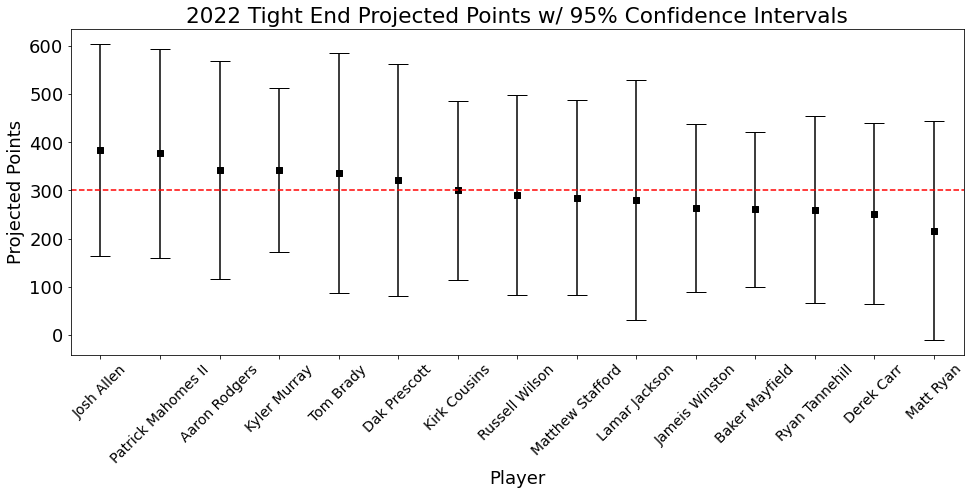

In [834]:
projection_barplot(qb_2022_projections, 'Tight End', save_fig=False)

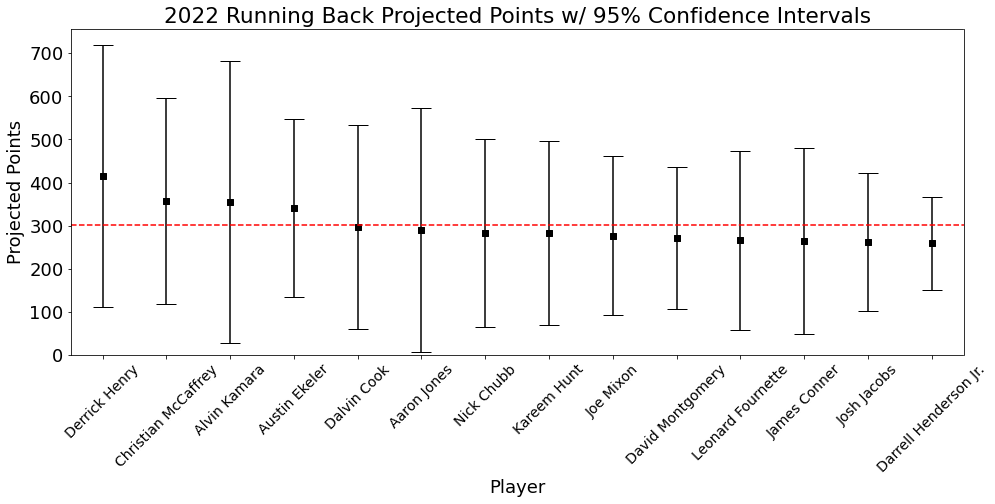

In [835]:
projection_barplot(rb_2022_projections[:14], 'Running Back', save_fig=False)

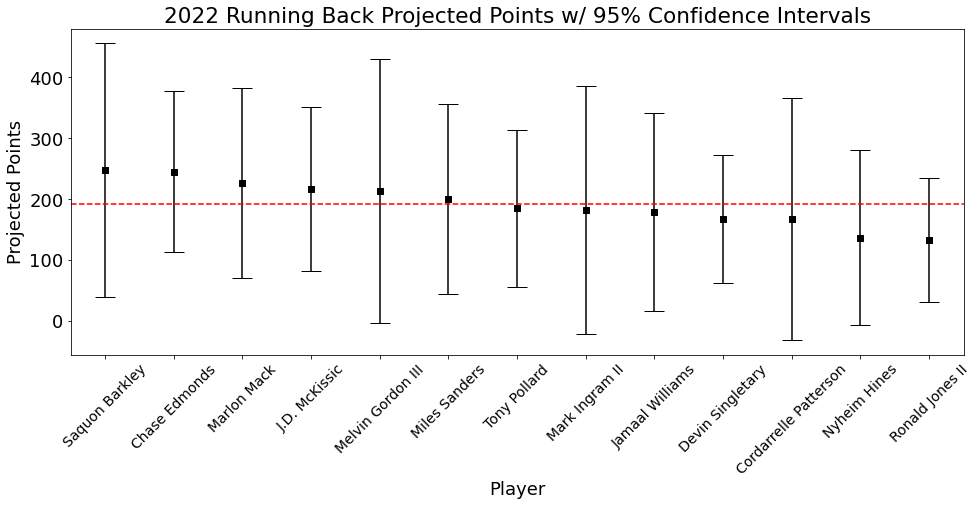

In [836]:
projection_barplot(rb_2022_projections[15:], 'Running Back', save_fig=False)

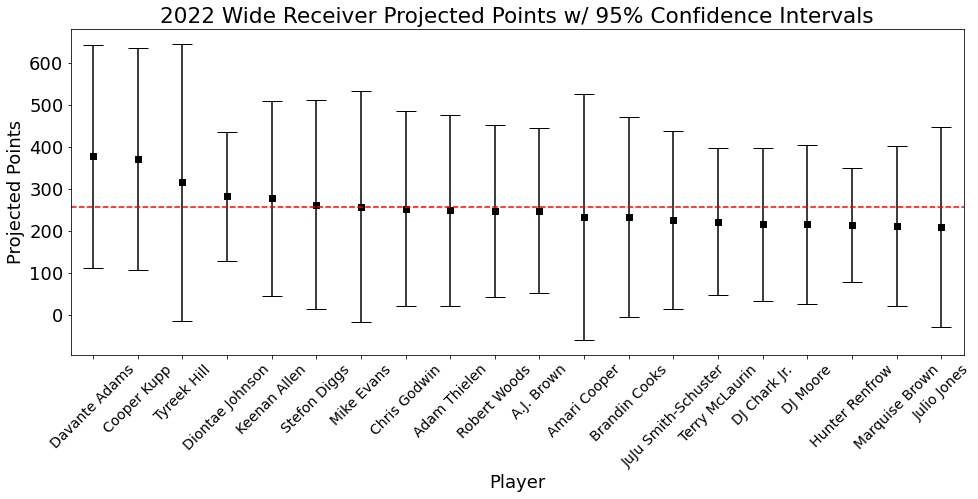

In [837]:
projection_barplot(wr_2022_projections[0:20], 'Wide Receiver', save_fig=False)

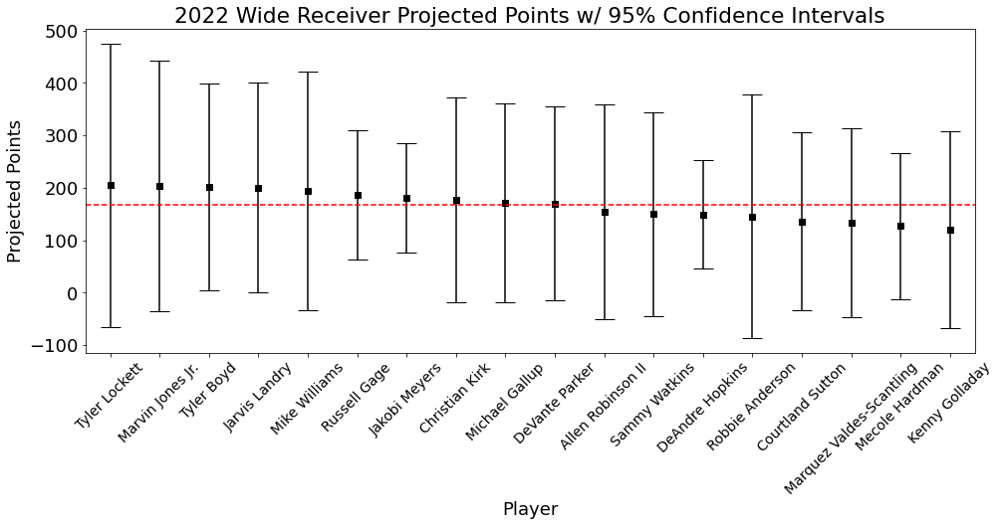

In [838]:
projection_barplot(wr_2022_projections[21:], 'Wide Receiver', save_fig=False)

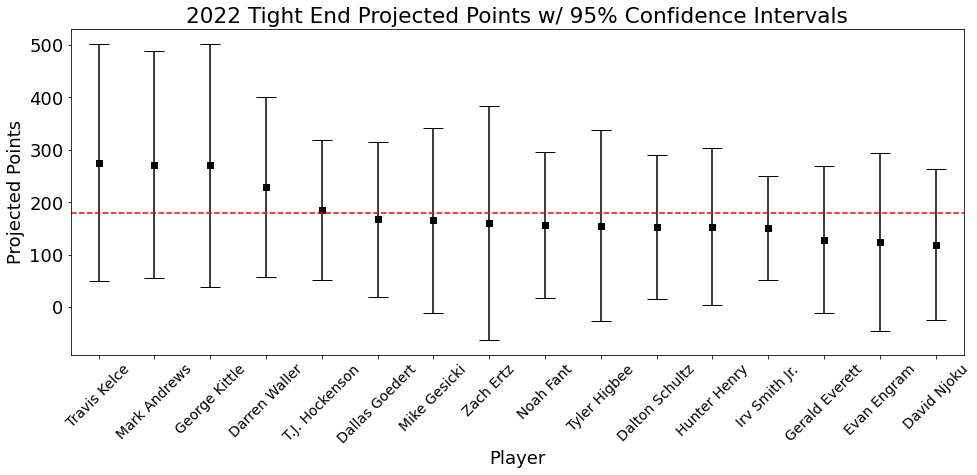

In [839]:
projection_barplot(te_2022_projections, 'Tight End', save_fig=False)

### ADP vs Projected Points

In [724]:
# load in 2022 player adp as adp_df
adp_df = pd.read_csv('data/adp/FantasyPros_2022_Overall_ADP_Rankings.csv')

#Columns to drop
to_drop = ['Bye', 'Team', 'ESPN', 'POS', 'RTSports', 'MFL', 'Fantrax', 'FFC', 'Sleeper', 'AVG']

# Drop columns
player_adp = adp_df.drop(to_drop, axis=1).dropna().head(200)
player_adp.head(10)

,Rank,Player
0,1.0,Jonathan Taylor
1,2.0,Christian McCaffrey
2,3.0,Austin Ekeler
3,4.0,Cooper Kupp
4,5.0,Derrick Henry
5,6.0,Justin Jefferson
6,7.0,Dalvin Cook
7,8.0,Najee Harris
8,9.0,Ja'Marr Chase
9,10.0,Joe Mixon


In [725]:
# Merge qb projections df with adp_df
qb_adp_df = pd.merge(qb_2022_projections, player_adp, how = 'left', on='Player')
qb_adp_df = qb_adp_df.drop(columns = ['Min Projected Points', 'Max Projected Points'], axis =1)
qb_adp_df

,Player,Projected Points,Rank
0,Josh Allen,384.0,24.0
1,Patrick Mahomes II,377.0,31.0
2,Aaron Rodgers,343.0,84.0
3,Kyler Murray,342.0,53.0
4,Tom Brady,336.0,76.0
5,Dak Prescott,322.0,74.0
6,Kirk Cousins,300.0,116.0
7,Russell Wilson,290.0,81.0
8,Matthew Stafford,285.0,93.0
9,Lamar Jackson,280.0,46.0


In [726]:
# Merge rb 2022 projections with adp_df
rb_adp_df = pd.merge(rb_2022_projections, player_adp, how = 'left', on='Player')
rb_adp_df = rb_adp_df.drop(columns = ['Min Projected Points', 'Max Projected Points'], axis =1)

# Create 2 Running back dfs to aid visualization
rb_adp_df_100 = rb_adp_df[rb_adp_df['Rank'] <= 79].reset_index().drop('index', axis=1)
rb_adp_df_200 = rb_adp_df[rb_adp_df['Rank'] >= 80].reset_index().drop('index', axis=1)
rb_adp_df_200

,Player,Projected Points,Rank
0,Kareem Hunt,283.0,85.0
1,Darrell Henderson Jr.,259.0,124.0
2,Chase Edmonds,245.0,92.0
3,Marlon Mack,226.0,165.0
4,J.D. McKissic,216.0,145.0
5,Melvin Gordon III,213.0,101.0
6,Tony Pollard,185.0,83.0
7,Mark Ingram II,182.0,179.0
8,Jamaal Williams,178.0,157.0
9,Devin Singletary,167.0,80.0


In [727]:
# Merge wr 2022 projections with adp_df
wr_adp_df = pd.merge(wr_2022_projections, player_adp, how = 'left', on='Player')
wr_adp_df = wr_adp_df.drop(columns = ['Min Projected Points', 'Max Projected Points'], axis =1)

# Create 2 Wide receiver dfs to aid visualization
wr_adp_df_100 = wr_adp_df[wr_adp_df['Rank'] <= 80].reset_index().drop('index', axis=1)
wr_adp_df_200 = wr_adp_df[wr_adp_df['Rank'] >= 81].reset_index().drop('index', axis=1)
wr_adp_df_200

,Player,Projected Points,Rank
0,Robert Woods,248.0,97.0
1,DJ Chark Jr.,215.0,139.0
2,Julio Jones,209.0,153.0
3,Tyler Lockett,205.0,91.0
4,Marvin Jones Jr.,204.0,193.0
5,Tyler Boyd,202.0,121.0
6,Jarvis Landry,200.0,148.0
7,Russell Gage,186.0,122.0
8,Jakobi Meyers,181.0,143.0
9,Christian Kirk,177.0,99.0


In [728]:
# Merge te 2022 projections with adp_df
te_adp_df = pd.merge(te_2022_projections, player_adp, how = 'left', on='Player')
te_adp_df = te_adp_df.drop(columns = ['Min Projected Points', 'Max Projected Points'], axis =1)
te_adp_df

,Player,Projected Points,Rank
0,Travis Kelce,275.0,13.0
1,Mark Andrews,271.0,22.0
2,George Kittle,270.0,38.0
3,Darren Waller,229.0,44.0
4,T.J. Hockenson,185.0,65.0
5,Dallas Goedert,167.0,71.0
6,Mike Gesicki,165.0,115.0
7,Zach Ertz,160.0,90.0
8,Noah Fant,157.0,160.0
9,Tyler Higbee,155.0,178.0


In [729]:
# Concat all positions 2022 projections
all_list = [qb_adp_df, rb_adp_df, wr_adp_df, te_adp_df]
all_adp_df = pd.concat(all_list, axis=0, ignore_index=True).sort_values('Rank')
all_adp_df

,Player,Projected Points,Rank
16,Christian McCaffrey,357.0,2.0
18,Austin Ekeler,341.0,3.0
44,Cooper Kupp,371.0,4.0
15,Derrick Henry,416.0,5.0
19,Dalvin Cook,297.0,7.0
...,...,...,...
65,Marvin Jones Jr.,204.0,193.0
77,Robbie Anderson,145.0,194.0
42,Ronald Jones II,132.0,195.0
11,Baker Mayfield,261.0,197.0


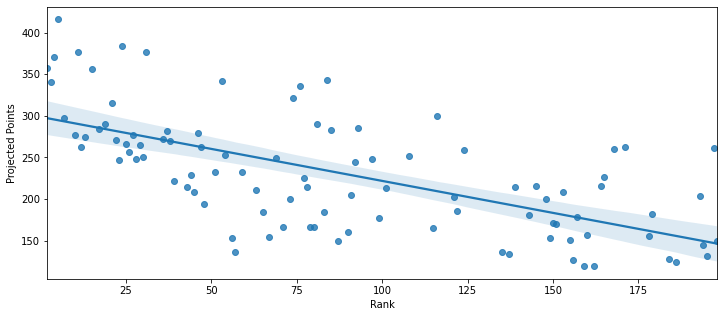

In [730]:
# Plot all players regplot
fig, ax = plt.subplots(figsize=(12,5))

sns.regplot(x = 'Rank', y = 'Projected Points', data = all_adp_df);

In [840]:
def adp_plot(df, position = '', save_fig = False):
    '''
    Plots regplot of ADP vs Projected fantasy points
    
    Inputs: 
        df : DataFrame.
        position : 'Quarterback', 'Running Back', 'Wide Receiver', 'Tight End' 
        save_fig : True or False
            
    Outputs:
        Returns : Regplot of ADP vs 2022 Projected fantasy points with player labels
    '''
    # Plot
    plt.figure(figsize=(20,15))
    p1 = sns.regplot('Rank', 'Projected Points', data=df, ci=None)

    # Add text labels of player name to each point
    for line in range(0,df.shape[0]):
         p1.text(df['Rank'][line]+0.2, df['Projected Points'][line], 
         df['Player'][line], ha='left', bbox={'facecolor':'white','alpha':1,'edgecolor':'none','pad':1},
         size='small', color='black', weight='normal')

    # Title        
    plt.title(f'ADP vs 2022 {position} Projections', fontsize=25)
    # Set x-axis label
    plt.xlabel('ADP', fontsize=20)
    # Set y-axis label
    plt.ylabel('Projected Points', fontsize=20);
    return adp_plot

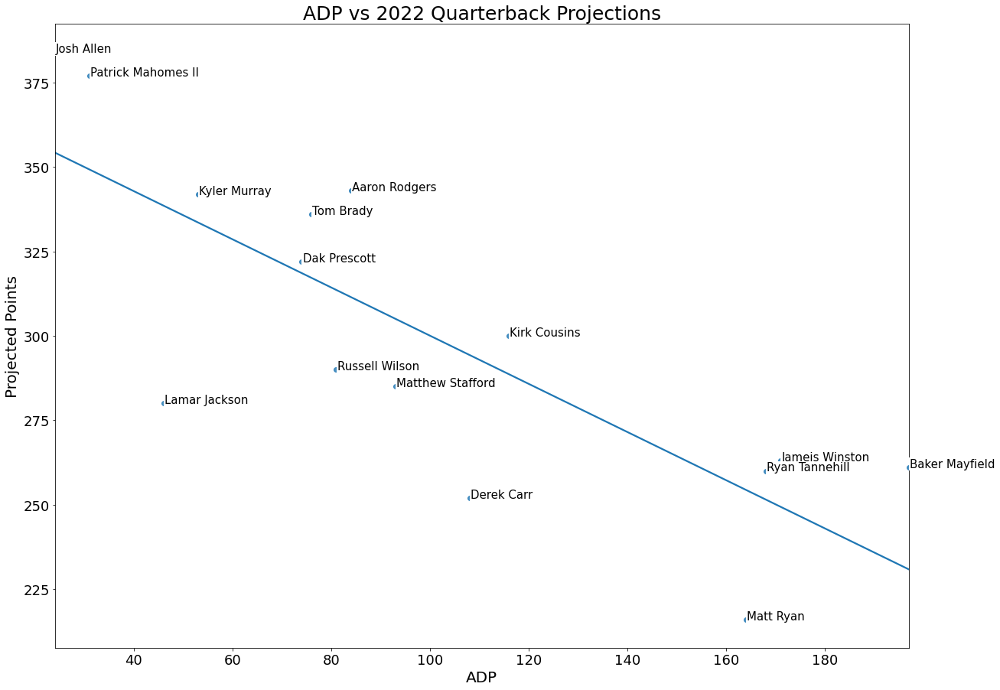

In [771]:
adp_plot(qb_adp_df, 'Quarterback');

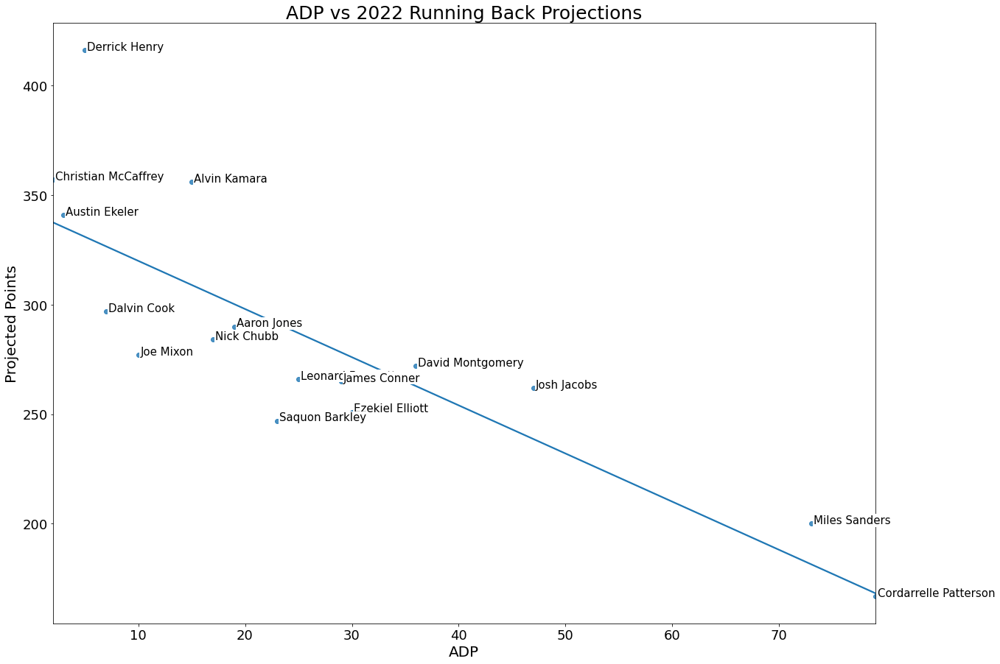

In [772]:
adp_plot(rb_adp_df_100, 'Running Back');

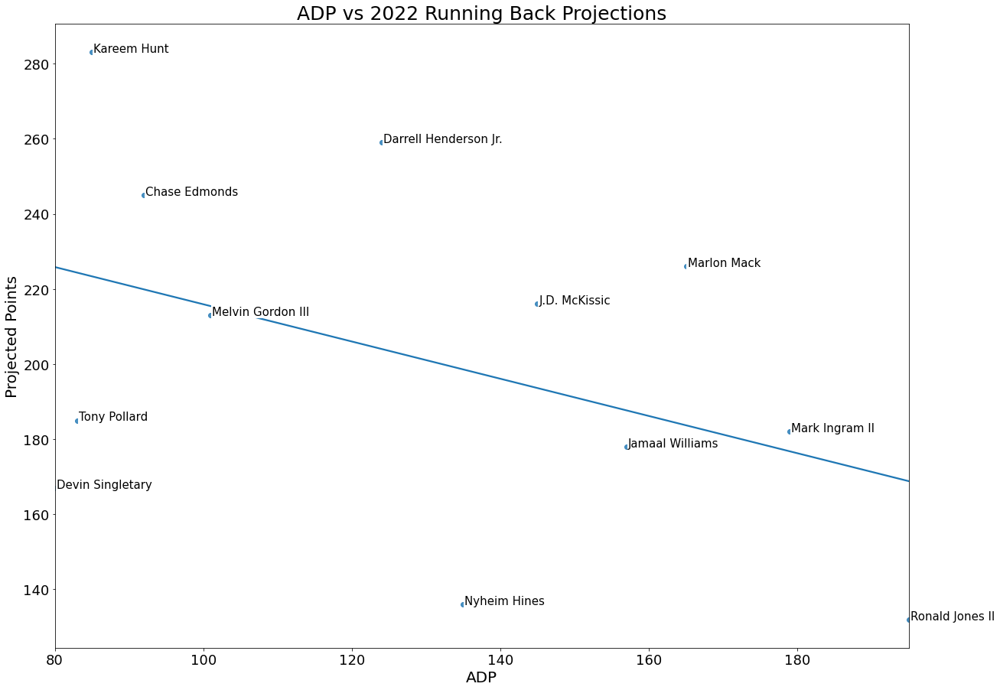

In [773]:
adp_plot(rb_adp_df_200, 'Running Back');

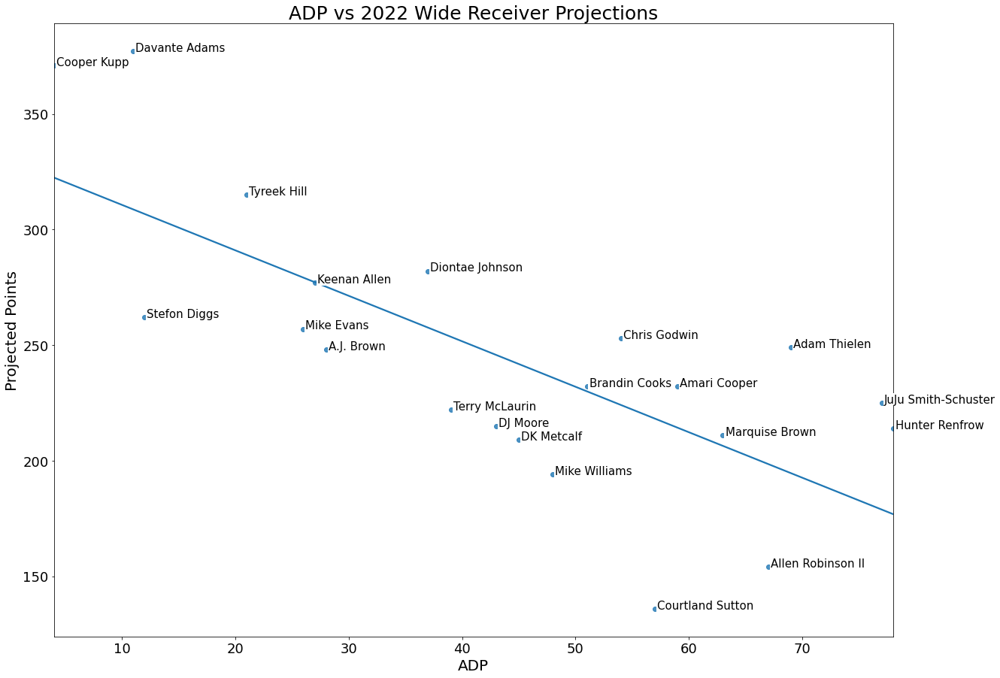

In [774]:
adp_plot(wr_adp_df_100, 'Wide Receiver');

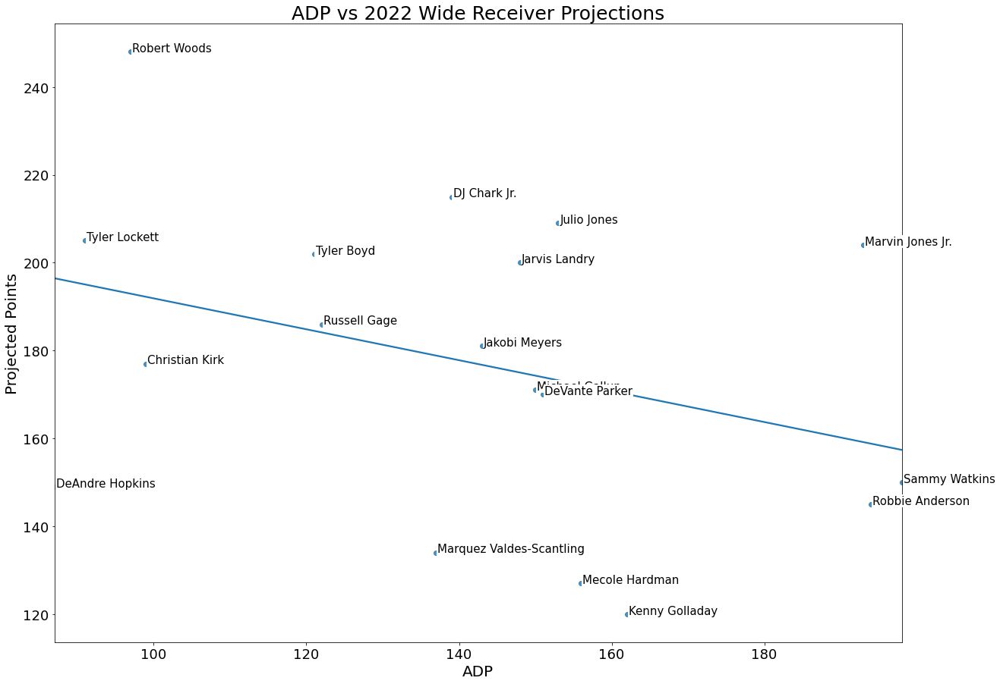

In [775]:
adp_plot(wr_adp_df_200, 'Wide Receiver');

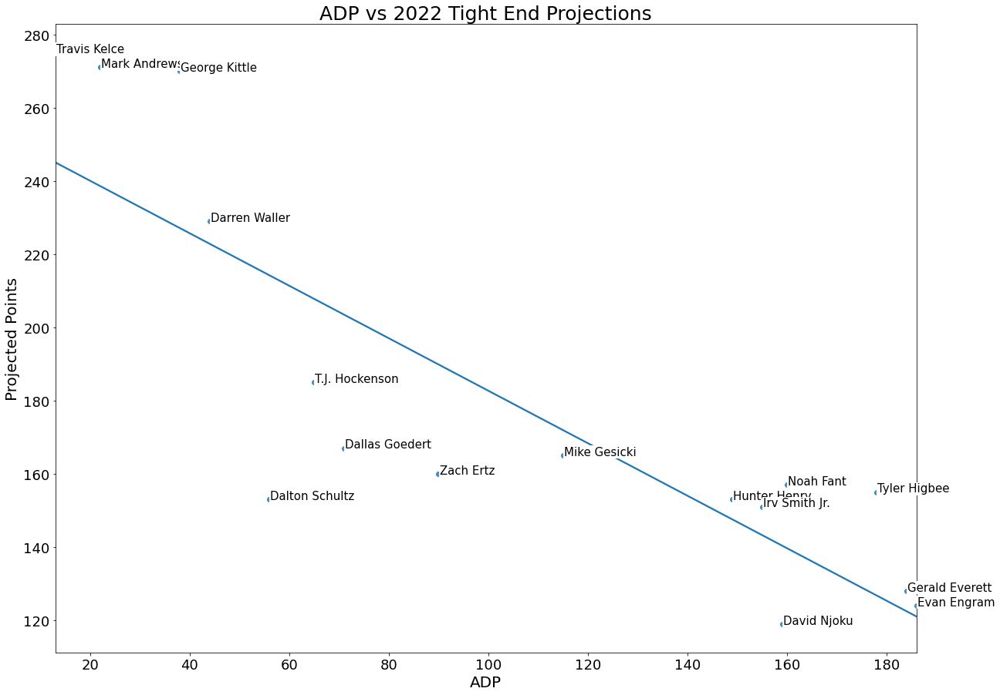

In [776]:
adp_plot(te_adp_df, 'Tight End');

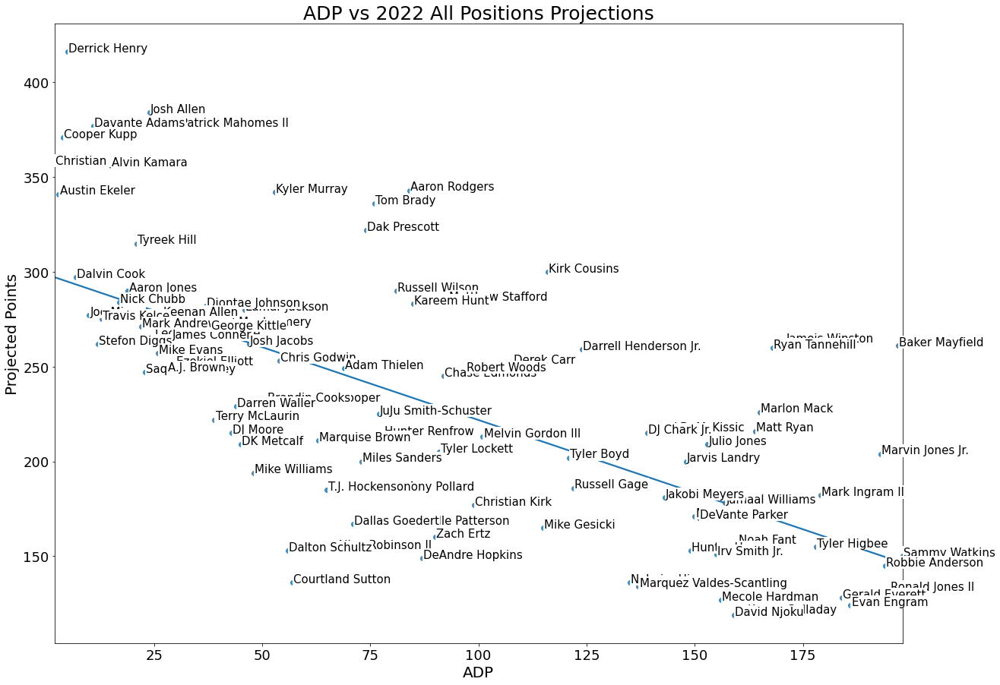

In [842]:
adp_plot(all_adp_df, 'All Positions');

## Recommendations

## Future Work